## Imports

In [1]:
import itk
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import os
import SimpleITK as sitk
from tqdm import tqdm
from pathlib import Path
from typing import List
import nibabel as nib
from sklearn.cluster import KMeans
import warnings
import math
warnings.filterwarnings("ignore")

## Global Functions and Variables

In [2]:
# Global variables
train_image_directory = "training-set/training-images/"
train_label_directory = "training-set/training-labels/"
test_image_directory = "testing-images/"
test_label_directory = "testing-labels/"
reference_image_path = "training-set/training-images/1017.nii.gz"

test_image_files = [f for f in os.listdir('testing-images/') if f.endswith('.nii.gz')]
test_label_files = [f for f in os.listdir('testing-labels/') if f.endswith('.nii.gz')]
train_image_files = [f for f in os.listdir('training-set/training-images/') if f.endswith('.nii.gz')]
train_label_files = [f for f in os.listdir('training-set/training-labels/') if f.endswith('.nii.gz')]

atlas_directory = "Atlas_images/"
mean_volume = itk.imread(f'./{atlas_directory}mean_volume.nii.gz', itk.F)
topological_atlas = itk.imread(f'./{atlas_directory}topological_atlas.nii.gz', itk.F)
num_classes = 4
class_labels = {0: 'background', 1: 'csf', 2: 'wm', 3: 'gm'}
probability_atlases = [itk.imread(f'./{atlas_directory}probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]

# Load tissue models
label_histograms_posterior = np.load('tissue_models.npy')

In [3]:
# Global Functions
def dice_coefficient(segmented_image: np.ndarray, gt_labels: np.ndarray, label: int) -> float:
    """Calculate Dice coefficient for a specific label.
    
    Args:
        segmented_image (np.ndarray): Predicted segmentation
        gt_labels (np.ndarray): Ground truth labels
        label (int): Label to calculate Dice coefficient for
        
    Returns:
        float: Dice coefficient value between 0 and 1
    """
    seg_mask = segmented_image == label
    gt_mask = gt_labels == label
    
    intersection = np.sum(seg_mask & gt_mask)
    denominator = np.sum(seg_mask) + np.sum(gt_mask)
    
    return (2.0 * intersection) / denominator if denominator > 0 else 0.0

def show_results(image, gt, prediction, modality='T1', i=0, slice_idx=150, plot=True, show_hist=True, cmap='tab20'):
    csf, gm, wm = dice_coefficient(prediction, gt, 1), dice_coefficient(prediction, gt, 2), dice_coefficient(prediction, gt, 3)
    print(f'Dice Score: CSF: {csf}, GM: {gm}, WM: {wm}, Avg: {(csf+gm+wm)/3}')
    if plot:
        slice_idx = slice_idx
        plt.figure(figsize=(15, 6))
        plt.subplot(1, 5, 1)
        plt.imshow(image[slice_idx], cmap='gray')
        plt.title(f'Original Image Slice for {modality} image {i+1}')
        plt.axis('off')
        
        plt.subplot(1, 5, 2)
        plt.imshow(gt[slice_idx], cmap='gray')
        plt.title('Ground Truth Slice')
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(prediction[slice_idx], cmap='gray')
        plt.title('Segmented Image Slice')
        plt.axis('off')
        plt.tight_layout()
        
        # plot overlay
        overlay = np.zeros_like(image[slice_idx])
        overlay[prediction[slice_idx] == 1] = 1
        overlay[prediction[slice_idx] == 2] = 2
        overlay[prediction[slice_idx] == 3] = 3
        plt.subplot(1, 5, 4)
        plt.imshow(image[slice_idx], cmap='gray')
        plt.imshow(overlay, cmap=cmap, alpha=0.5)
        plt.title('Prediction Overlay')
        plt.axis('off')
        
        # ground truth overlay
        overlay_gt = np.zeros_like(image[slice_idx])
        overlay_gt[gt[slice_idx] == 1] = 1
        overlay_gt[gt[slice_idx] == 2] = 2
        overlay_gt[gt[slice_idx] == 3] = 3
        plt.subplot(1, 5, 5)
        plt.imshow(image[slice_idx], cmap='gray')
        plt.imshow(overlay_gt, cmap=cmap, alpha=0.5)
        plt.title('Ground Truth Overlay')
        plt.axis('off')
        
        if show_hist:
            # plot histogram
            plt.figure(figsize=(15, 6))
            plt.subplot(1, 3, 1)
            plt.hist(image[slice_idx].ravel(), bins=256, histtype='step', color='black')
            plt.title(f'Original Image Histogram for {modality} image {i+1}')
            plt.xlabel('Intensity')
            plt.ylabel('Frequency')
            
            plt.subplot(1, 3, 2)
            plt.hist(gt[slice_idx].ravel(), bins=256, histtype='step', color='black')
            plt.title('Ground Truth Histogram') 
            plt.xlabel('Intensity')
            plt.ylabel('Frequency')
            
            plt.subplot(1, 3, 3)
            plt.hist(prediction[slice_idx].ravel(), bins=256, histtype='step', color='black')
            plt.title('Segmented Image Histogram')
            plt.xlabel('Intensity')
            plt.ylabel('Frequency')
            plt.tight_layout()
        
        
        plt.show()
    return csf, gm, wm
def gaussian(inp, mean, cov, k, d):
  num = []

  inv = np.linalg.inv(cov[k] + 1e-6 * np.eye(d))
  den = (2*math.pi)**(d/2) * math.sqrt(np.linalg.det(cov[k]) + 1e-6)
  diff = inp - mean[k].reshape((-1, 1))

  num = -0.5 * np.sum(diff * (inv @ diff), axis=0)

  gaussian = np.exp(num)/(den + 1e-6)
  return np.array(gaussian)

def EM(data, data_label=None, init='kmeans', mask=None, init_weights=None, 
       comb_mode=None, atlas_weights=None, freq=2, max_iter=100):
    """
    Expectation-Maximization algorithm for image segmentation with improved stability and atlas integration.
    
    Args:
        data: Input image data
        data_label: Label data (optional)
        init: Initialization method ('kmeans' or 'other')
        mask: Binary mask for valid pixels
        init_weights: Initial weights if not using kmeans
        comb_mode: Atlas combination mode ('into', 'end', or None)
        atlas_weights: Atlas probabilities for combination
        freq: Frequency of atlas combination for 'into' mode
        max_iter: Maximum number of iterations
        
    Returns:
        pred_em: Predicted segmentation labels
    """
    # Constants for numerical stability
    epsilon = 1e-10
    min_covar = 1e-7
    tol = 1e-6
    
    # Initialize mask if not provided
    if mask is None and init == 'kmeans':
        mask = data_label > 0

    # Prepare data
    y = np.array([data[mask]])
    d, k = 1, 3  # dimensions and number of clusters

    # Initialize parameters
    if init == 'kmeans':
        # Initialize with KMeans
        kmeans = KMeans(n_clusters=k, random_state=42).fit(y.T)
        x = kmeans.predict(y.T)
        mean = kmeans.cluster_centers_
        alpha = np.array([np.mean(x == i) for i in range(k)])
        cov = np.array([np.cov(y.T[x == i], rowvar=False) for i in range(k)])
        cov = cov[:, np.newaxis, np.newaxis] if d == 1 else cov
        weights = np.array([gaussian(y, mean, cov, i, d) * alpha[i] for i in range(k)])
    else:
        # Initialize with provided weights
        weights = init_weights
        N_k = np.sum(weights, axis=1, keepdims=True)
        mean = (weights @ y.T) / (N_k + epsilon)
        cov = np.array([np.eye(d)] * k)

    # Normalize initial weights
    weights /= (np.sum(weights, axis=0) + epsilon)
    prev_weights = np.zeros_like(weights)
    prev_ll = -np.inf

    # EM algorithm
    for v in range(max_iter):
        # M-Step
        N_k = np.sum(weights, axis=1, keepdims=True)
        alpha = N_k / len(y[0])
        mean = (weights @ y.T) / (N_k + epsilon)
        
        # Calculate and regularize covariance
        cov = np.array([
            np.dot((weights[i] * (y - mean[i].reshape(-1, 1))), 
                  (y - mean[i].reshape(-1, 1)).T) / (N_k[i] + epsilon) 
            for i in range(k)
        ])
        for i in range(k):
            cov[i] += min_covar * np.eye(d)

        # Save previous weights and calculate previous log-likelihood
        prev_weights = weights.copy()
        prev_ll = np.sum(np.log(np.sum(prev_weights, axis=0) + epsilon))

        # E-Step
        weights = np.array([gaussian(y, mean, cov, i, d) * alpha[i] for i in range(k)])
        weights /= (np.sum(weights, axis=0) + epsilon)

        # Combine with atlas weights if specified
        if comb_mode == 'into' and v % freq == 0 and atlas_weights is not None:
            normalized_atlas = atlas_weights / (np.sum(atlas_weights, axis=0) + epsilon)
            weights = 0.5 * weights + 0.5 * normalized_atlas
            weights /= (np.sum(weights, axis=0) + epsilon)

        # Check convergence
        new_ll = np.sum(np.log(np.sum(weights, axis=0) + epsilon))
        if v > 0:
            relative_change = np.abs((new_ll - prev_ll) / (prev_ll + epsilon))
            if relative_change < tol:
                print(f'Converged at iteration {v} with log-likelihood {new_ll:.4f}')
                break

    # Final atlas combination if specified
    if comb_mode == 'end' and atlas_weights is not None:
        normalized_atlas = atlas_weights / (np.sum(atlas_weights, axis=0) + epsilon)
        weights = 0.5 * weights + 0.5 * normalized_atlas
        weights /= (np.sum(weights, axis=0) + epsilon)

    # Final prediction
    pred_em = np.argmax(weights, axis=0)
    return pred_em
    
def relabel(gt, predictions, image):
    best_score, best_config = find_best_configuration(gt, predictions)
    relabeled_image, relabeled_predictions = reassign_labels(image, predictions, best_config)
    return relabeled_image, relabeled_predictions, best_score

def find_best_configuration(gt, predictions):
    configurations = generate_label_combinations()
    best_score, best_config = evaluate_combinations(gt, predictions, configurations)
    return best_score, best_config

def generate_label_combinations():
    return [
        {1: 1, 2: 2, 3: 3},
        {1: 1, 2: 3, 3: 2},
        {1: 2, 2: 3, 3: 1},
        {1: 2, 2: 1, 3: 3},
        {1: 3, 2: 1, 3: 2},
        {1: 3, 2: 2, 3: 1}
    ]

def evaluate_combinations(gt, predictions, configurations):
    best_mean_score = 0
    best_config = configurations[0]
    best_score = []

    for config in configurations:
        dice_scores = calculate_dice_scores(gt, predictions, config)
        mean_score = np.mean(dice_scores)
        if mean_score > best_mean_score:
            best_mean_score = mean_score
            best_config = config
            best_score = dice_scores

    print('Best combination has average dice score of:', best_mean_score)
    return best_score, best_config

def reassign_labels(image, predictions, config):
    relabeled_image = apply_label_mapping(image, config)
    relabeled_predictions = apply_label_mapping(predictions, config)
    return relabeled_image, relabeled_predictions

def apply_label_mapping(data, config):
    relabeled_data = np.zeros(data.shape)
    for old_label, new_label in config.items():
        relabeled_data[data == old_label] = new_label
    return relabeled_data

def calculate_dice_scores(gt, predictions, config):
    worker = apply_label_mapping(predictions, config)
    labels = np.unique(worker)
    dice_scores = [calculate_dice_for_label(gt, worker, label) for label in labels if label != 0]
    return dice_scores

def calculate_dice_for_label(gt, worker, label):
    intersection = np.sum(np.bitwise_and(worker == label, gt == label))
    union = np.sum(worker == label) + np.sum(gt == label)
    return (2 * intersection) / union if union > 0 else 0

def save_probability_atlases(
    test_image_directory: str,
    test_label_directory: str,
    mean_volume,
    probability_atlases: List,
    topological_atlas,
    class_labels: dict,
    output_dir: str = "test_probability_atlases"
) -> None:
    """
    Save probability atlases for test images after registration.
    
    Args:
        test_image_directory (str): Directory containing test images
        test_label_directory (str): Directory containing test labels
        mean_volume: Reference mean volume image
        probability_atlases (List): List of probability atlas images
        topological_atlas: Reference topological atlas
        class_labels (dict): Dictionary mapping class indices to names
        output_dir (str): Directory to save probability atlases
    """
    # Create output directory
    Path(output_dir).mkdir(parents=True, exist_ok=True)
    
    # Get image paths
    img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
    
    for image_path in tqdm(img_paths, desc="Processing images"):
        try:
            # Create image-specific output directory
            image_output_dir = Path(f"{output_dir}/{os.path.splitext(image_path)[0]}")
            image_output_dir.mkdir(parents=True, exist_ok=True)
            
            # Load fixed image
            fx_image = itk.imread(os.path.join(test_image_directory, image_path), itk.F)
            
            # Setup registration parameters
            parameter_object = itk.ParameterObject.New()
            parameter_object.AddParameterFile("parameters/9/Parameters.Par0009.affine.txt")
            parameter_object.AddParameterFile("parameters/9/Parameters.Par0009.elastic.txt")
            
            # Perform registration
            _, result_transform_parameters = itk.elastix_registration_method(
                fx_image, mean_volume,
                parameter_object=parameter_object,
                log_to_console=False
            )
            
            # Set interpolator for transformations
            result_transform_parameters.SetParameter("ResampleInterpolator", 
                                                ["FinalNearestNeighborInterpolator"])
            
            # Transform and save probability atlases
            for c, atlas in enumerate(probability_atlases):
                prob_atlas = itk.transformix_filter(atlas, result_transform_parameters)
                prob_atlas = sitk.GetImageFromArray(prob_atlas)
                prob_atlas.CopyInformation(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
                sitk.WriteImage(
                    prob_atlas, 
                    str(image_output_dir / f"probability_atlas_{class_labels[c]}.nii.gz")
                )
            
            # Transform and save topological atlas
            topological_atlas_warped = itk.transformix_filter(topological_atlas, result_transform_parameters)
            topological_atlas_warped = sitk.GetImageFromArray(topological_atlas_warped)
            topological_atlas_warped.CopyInformation(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
            sitk.WriteImage(
                topological_atlas_warped, 
                str(image_output_dir / "topological_atlas.nii.gz")
            )
        except Exception as e:
            print(f"Error processing {image_path}: {e}")
            continue


# Without EM

## 2.1 Tissue Models

In [5]:
def calculate_tissue_models(image_directory: str, label_directory: str) -> np.ndarray:
    """
    Calculate tissue models from training images and their corresponding labels.
    
    Args:
        image_directory (str): Path to directory containing training images
        label_directory (str): Path to directory containing label images
        
    Returns:
        np.ndarray: Posterior probability distributions for each tissue class
    """
    num_classes = 3
    label_histograms = np.zeros((3, 256))
    
    # Get all image files
    image_files = [f for f in os.listdir(image_directory) if f.endswith('.nii.gz')]
    
    # Process each image and its corresponding label
    for image_file in tqdm(image_files, total=len(image_files)):
        image_name = os.path.splitext(os.path.splitext(image_file)[0])[0]
        image_filepath = os.path.join(image_directory, image_file)
        label_filepath = os.path.join(label_directory, f'{image_name}_3C.nii.gz')
        
        # Load and normalize image
        images = sitk.GetArrayFromImage(sitk.ReadImage(image_filepath))
        labels = sitk.GetArrayFromImage(sitk.ReadImage(label_filepath))
        images = (images - images.min()) / (images.max() - images.min()) * 255
        
        # Calculate histogram for each class
        for c in range(0, num_classes):
            label_histograms[c, :] += np.histogram(images[labels == c+1], 
                                                 bins=256, 
                                                 range=[0, 256])[0]
    
    # Calculate posterior probabilities
    label_histograms_density = label_histograms / np.sum(label_histograms, axis=0)[None]
    
    return label_histograms_density

def segment_image_with_tissue_model(image: np.ndarray, tissue_models: np.ndarray, gt_label) -> np.ndarray:
    """
    Segment an input image using pre-calculated tissue models and ground truth label mask.

    Args:
        image (np.ndarray): Input image to be segmented
        tissue_models (np.ndarray): Pre-calculated tissue probability models of shape (num_classes, 256)
            representing the probability distribution for each tissue class
        gt_label (np.ndarray): Ground truth label mask of same shape as input image,
            used to mask out background (where gt_label == 0)

    Returns:
        np.ndarray: Segmented image of same shape as input, where each pixel value
            represents the predicted tissue class (0-3)
    """
    # Normalize image to [0, 255] range
    image = (image - image.min()) / (image.max() - image.min()) * 255
    image = image.astype(np.uint8)
    
    # Mask out background
    # image[gt_label == 0] = 0
    
    flat_image = image.ravel()
    posteriors = tissue_models[:, flat_image]  # Shape: (num_classes, num_pixels)
    segmentation = np.argmax(posteriors, axis=0) +1
    
    # Reshape back to original image dimensions
    return segmentation.reshape(image.shape)*(gt_label != 0)

  0%|          | 0/20 [00:00<?, ?it/s]

Dice Score: CSF: 0.4565065026088311, GM: 0.9271022236475268, WM: 0.9499159777624182, Avg: 0.7778415680062588


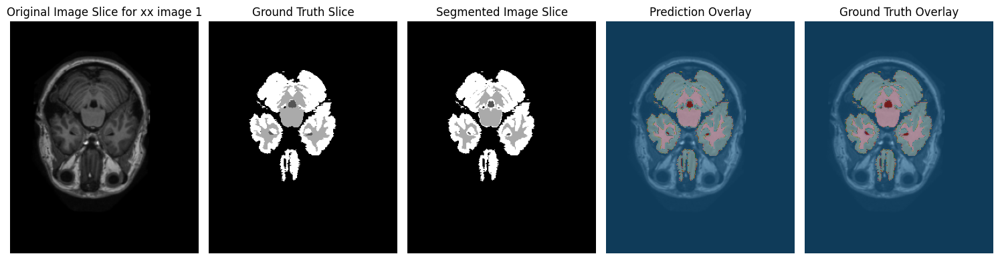

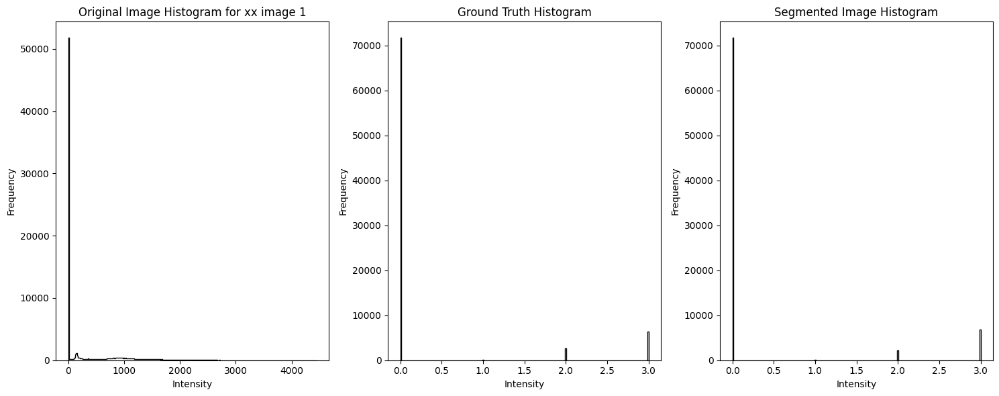

  5%|▌         | 1/20 [00:02<00:38,  2.05s/it]

Dice Score: CSF: 0.6761751857521562, GM: 0.874478924545988, WM: 0.9262002644305785, Avg: 0.8256181249095742


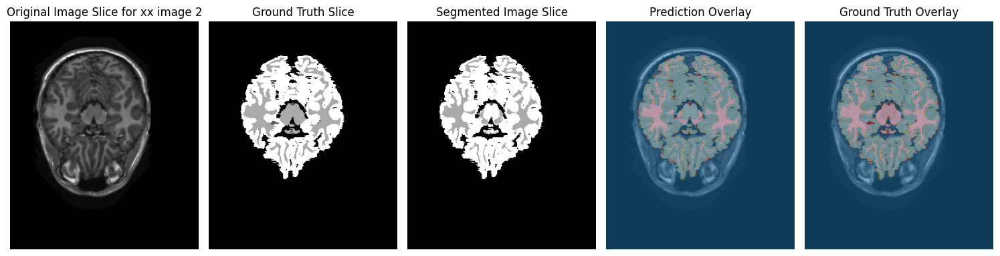

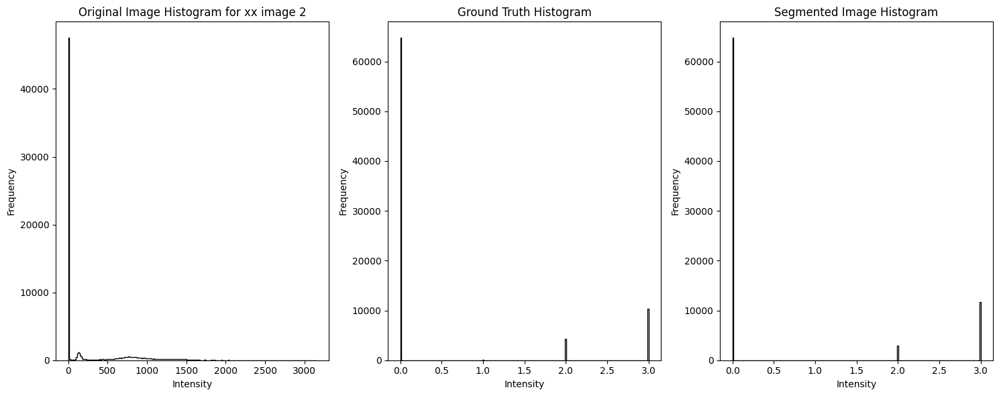

 10%|█         | 2/20 [00:03<00:32,  1.80s/it]

Dice Score: CSF: 0.874349101738372, GM: 0.9158115093948858, WM: 0.9422995970714175, Avg: 0.9108200694015585


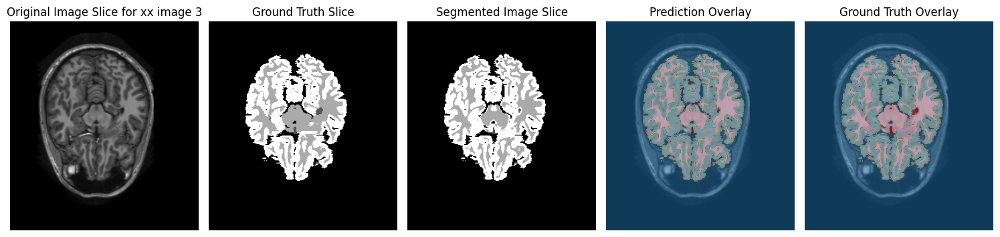

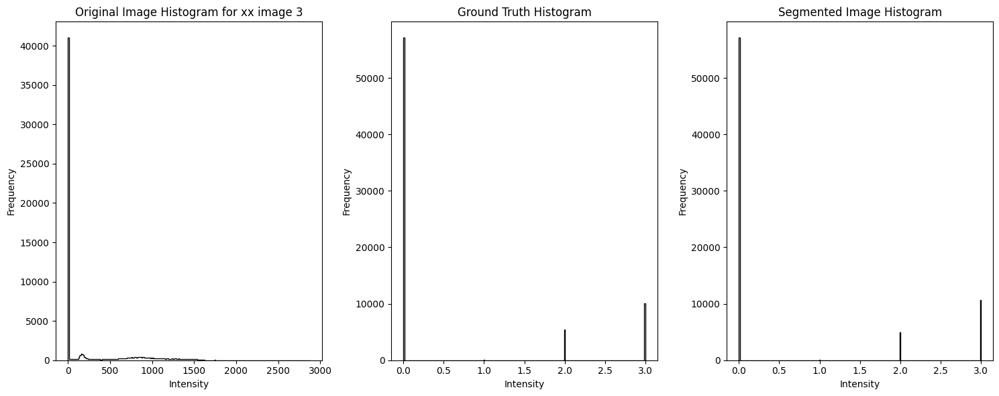

 15%|█▌        | 3/20 [00:05<00:28,  1.65s/it]

Dice Score: CSF: 0.556033531877344, GM: 0.9167207502920516, WM: 0.9390439379465149, Avg: 0.8039327400386368


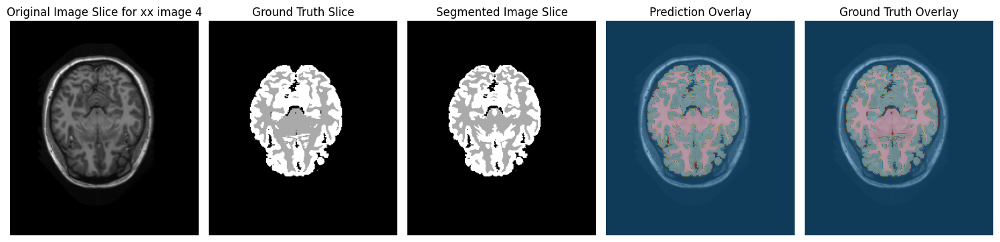

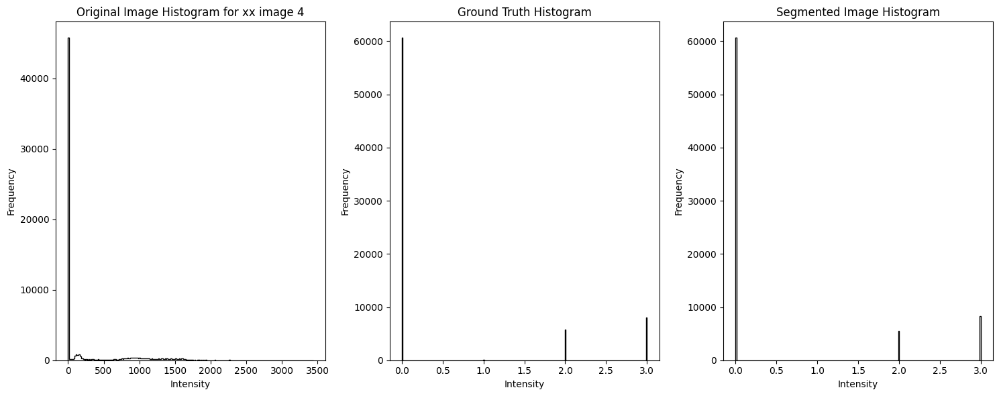

 20%|██        | 4/20 [00:06<00:25,  1.59s/it]

Dice Score: CSF: 0.4574051776038531, GM: 0.9091626615202856, WM: 0.9478340701736195, Avg: 0.7714673030992527


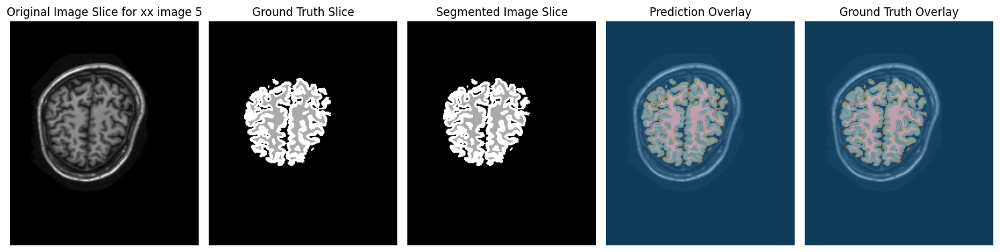

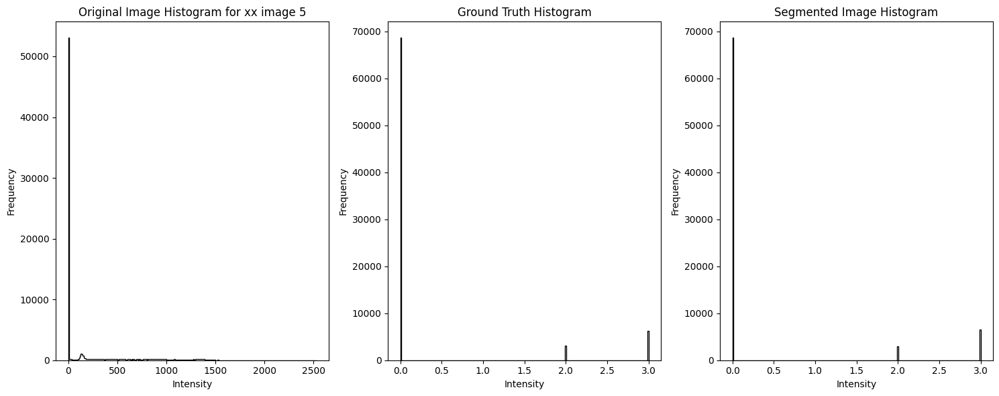

 25%|██▌       | 5/20 [00:08<00:24,  1.64s/it]

Dice Score: CSF: 0.4890643985419198, GM: 0.918105489601143, WM: 0.942573025096133, Avg: 0.7832476377463986


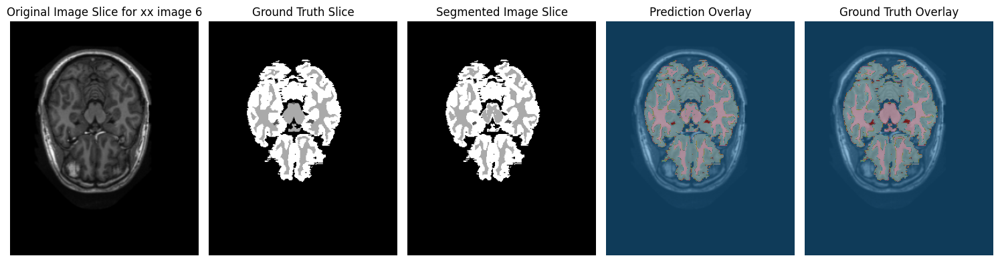

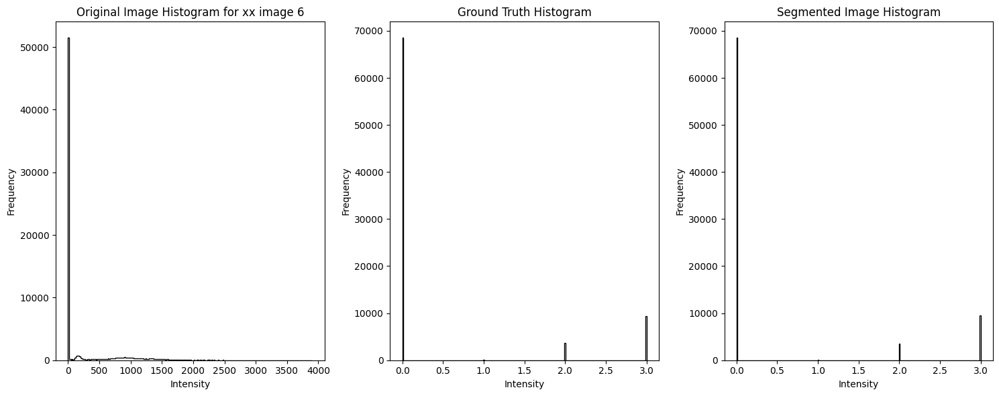

 30%|███       | 6/20 [00:10<00:23,  1.65s/it]

Dice Score: CSF: 0.6135198966177978, GM: 0.9058026696922032, WM: 0.9365945176724169, Avg: 0.8186390279941392


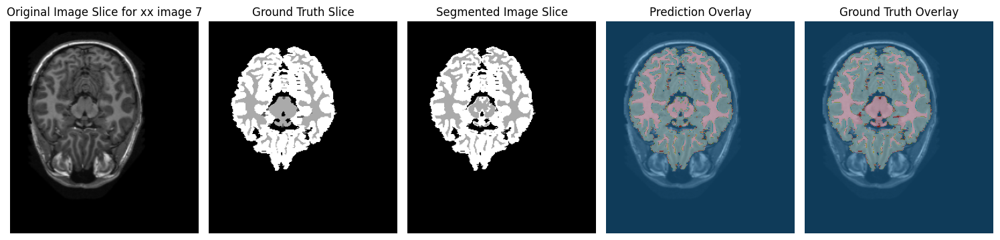

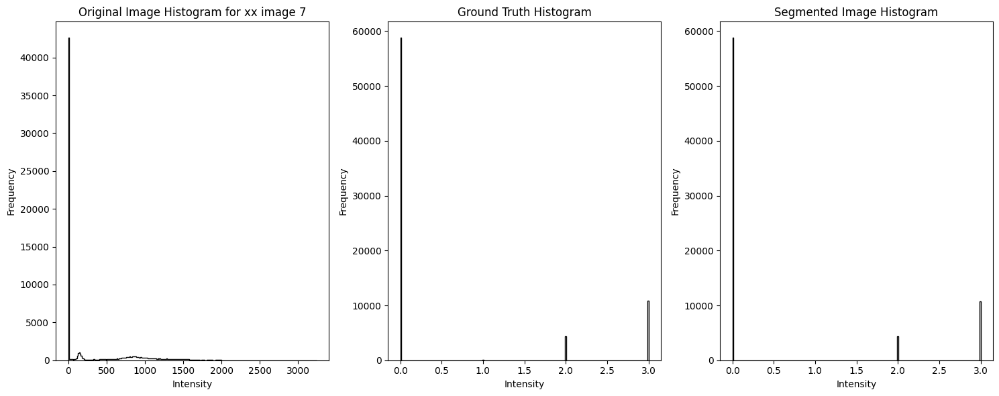

 35%|███▌      | 7/20 [00:11<00:21,  1.62s/it]

Dice Score: CSF: 0.8285704813685187, GM: 0.8998707346012179, WM: 0.9393961712880383, Avg: 0.8892791290859249


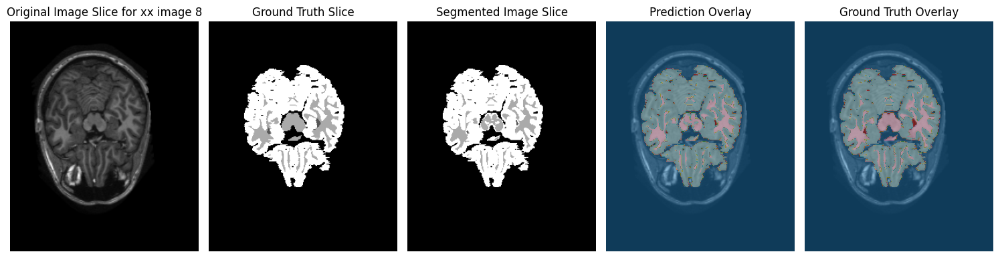

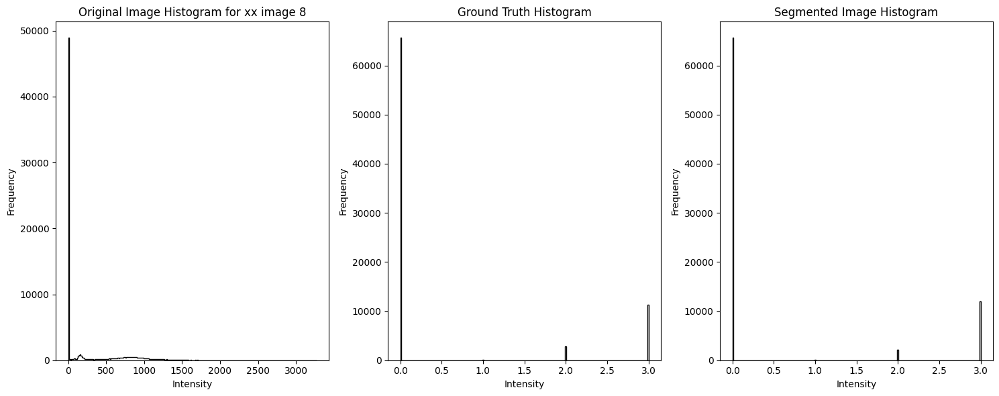

 40%|████      | 8/20 [00:13<00:19,  1.63s/it]

Dice Score: CSF: 0.5274434986791899, GM: 0.915222570364775, WM: 0.937233689500477, Avg: 0.7932999195148139


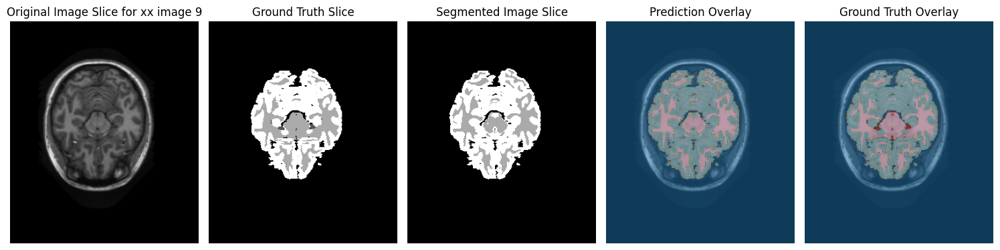

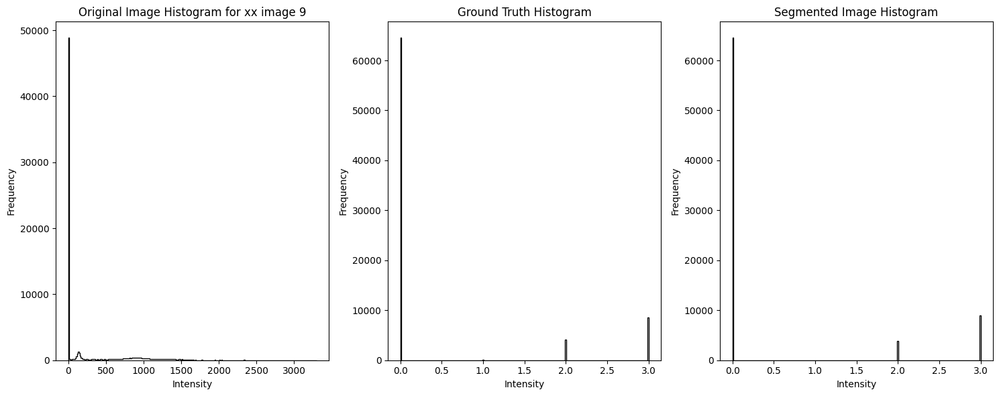

 45%|████▌     | 9/20 [00:14<00:17,  1.61s/it]

Dice Score: CSF: 0.4123579318072675, GM: 0.9232311619654561, WM: 0.9486315795307798, Avg: 0.7614068911011677


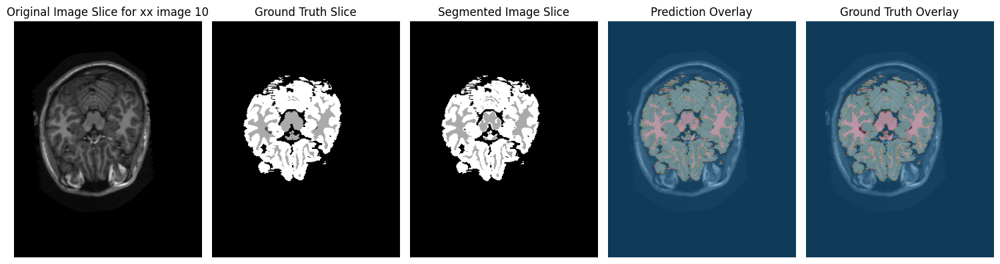

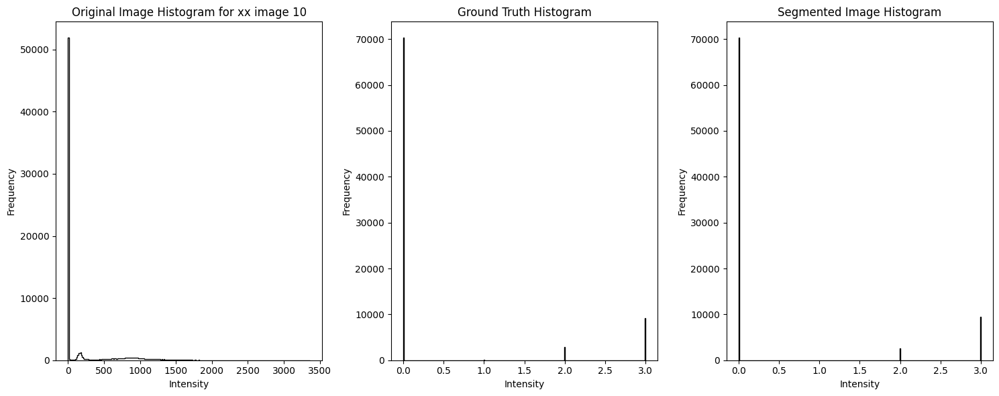

 50%|█████     | 10/20 [00:16<00:16,  1.65s/it]

Dice Score: CSF: 0.7222172190201729, GM: 0.9108587299946518, WM: 0.9367609395989316, Avg: 0.8566122962045855


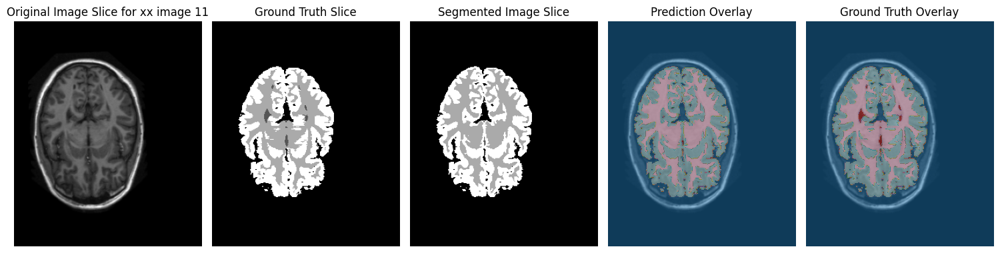

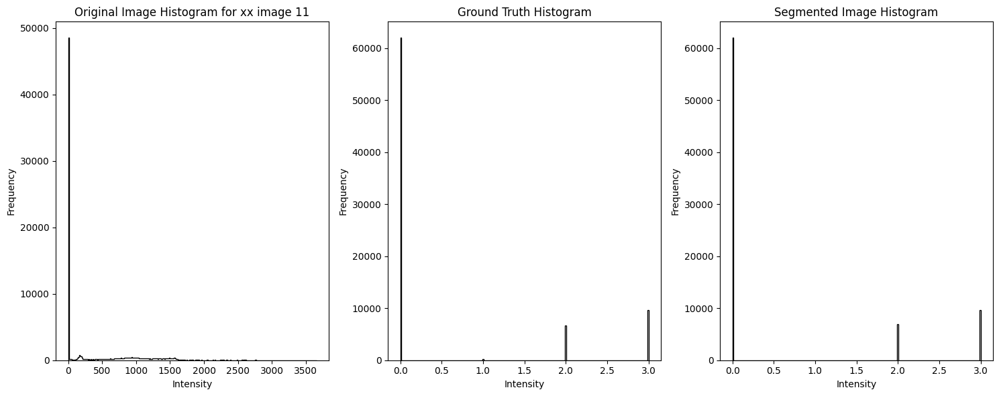

 55%|█████▌    | 11/20 [00:18<00:15,  1.71s/it]

Dice Score: CSF: 0.6222608432824542, GM: 0.8281585380268227, WM: 0.8663993294489609, Avg: 0.7722729035860793


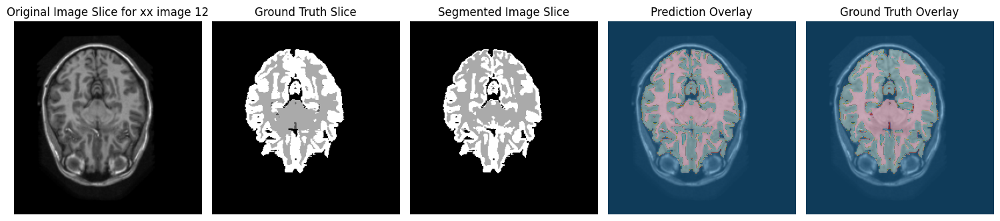

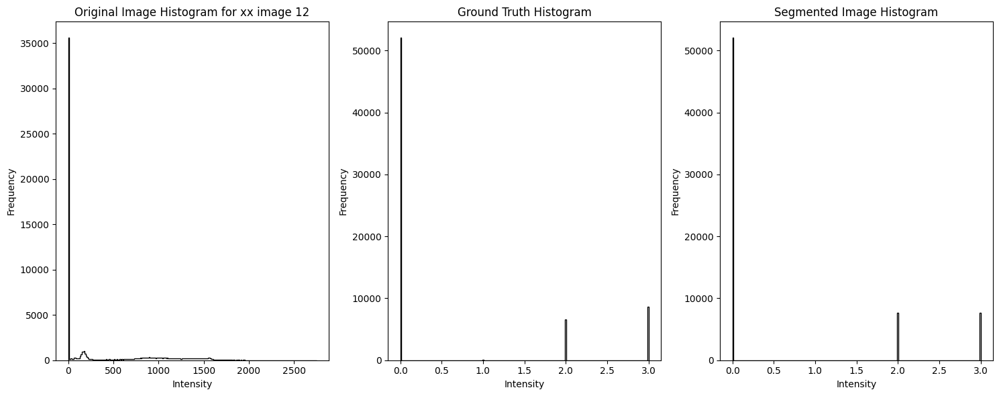

 60%|██████    | 12/20 [00:19<00:13,  1.63s/it]

Dice Score: CSF: 0.4546041842667594, GM: 0.8468878463738595, WM: 0.8747018082316356, Avg: 0.7253979462907516


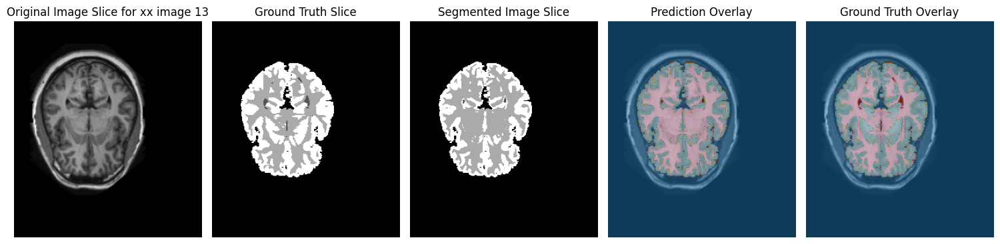

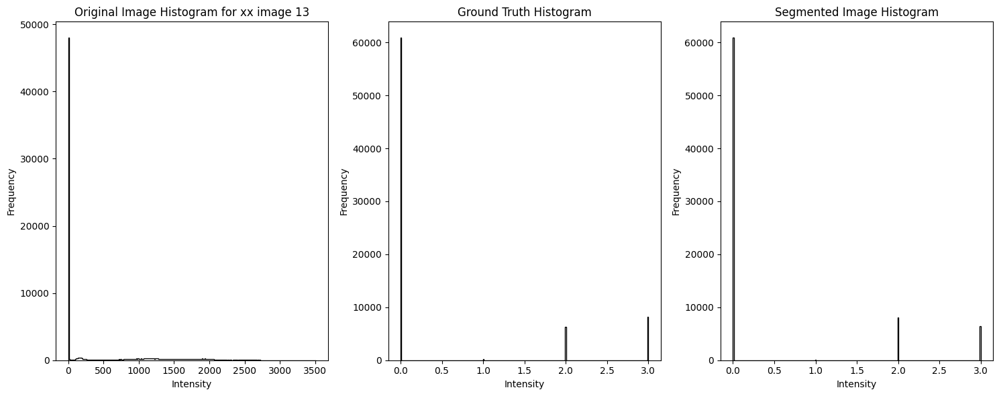

 65%|██████▌   | 13/20 [00:21<00:11,  1.60s/it]

Dice Score: CSF: 0.5449044212501466, GM: 0.8414486821020639, WM: 0.9148022304394005, Avg: 0.7670517779305369


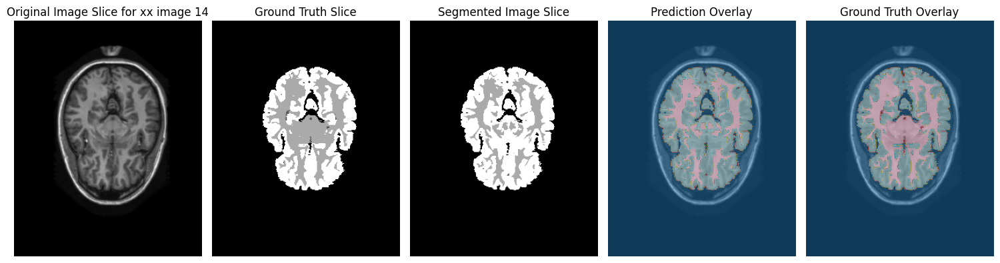

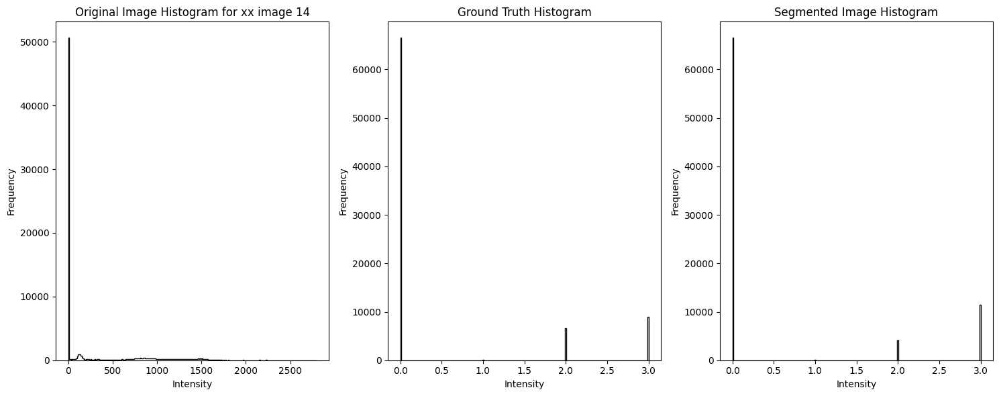

 70%|███████   | 14/20 [00:23<00:09,  1.63s/it]

Dice Score: CSF: 0.5976545374835598, GM: 0.9295240081756936, WM: 0.9459044010235459, Avg: 0.8243609822275998


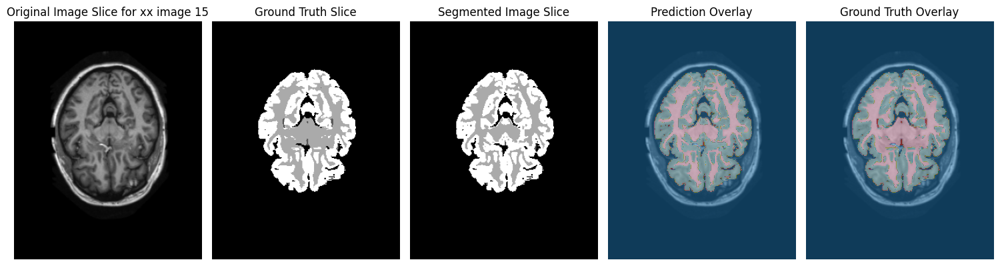

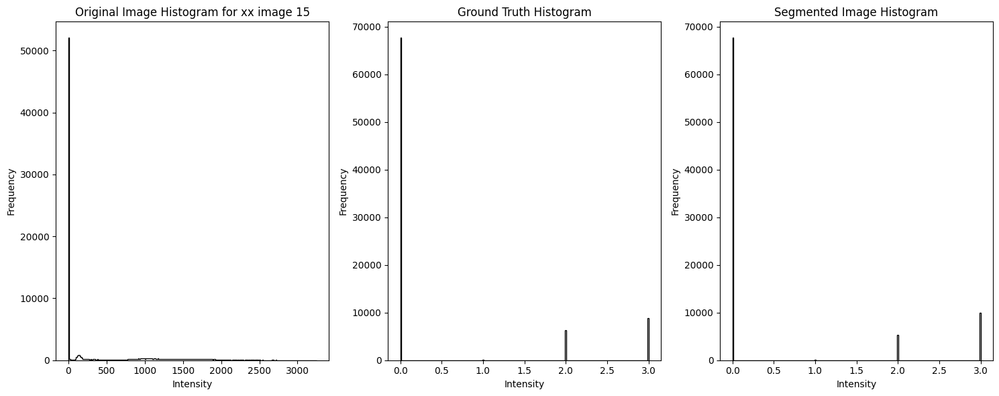

 75%|███████▌  | 15/20 [00:24<00:08,  1.64s/it]

Dice Score: CSF: 0.5781866911295183, GM: 0.8904706319585848, WM: 0.9134140745258633, Avg: 0.7940237992046555


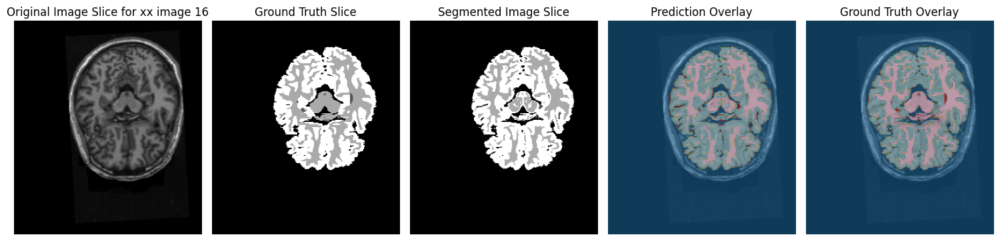

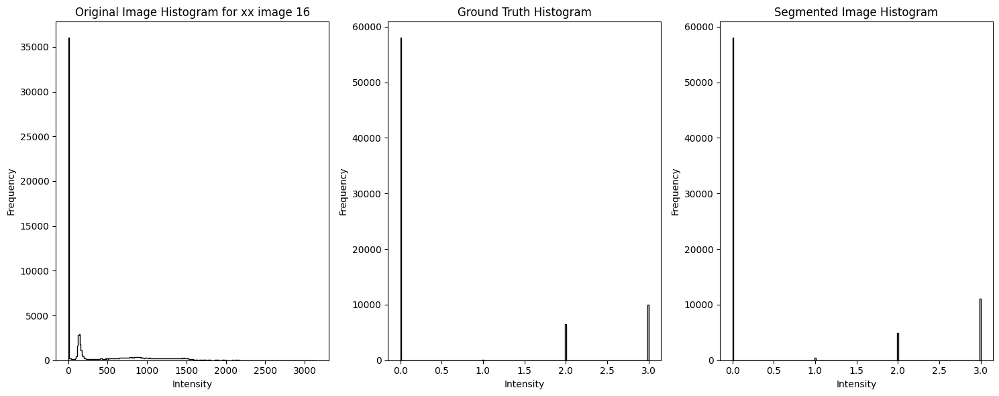

 80%|████████  | 16/20 [00:26<00:06,  1.62s/it]

Dice Score: CSF: 0.8290048593245947, GM: 0.8757445793379558, WM: 0.8993050672710824, Avg: 0.8680181686445443


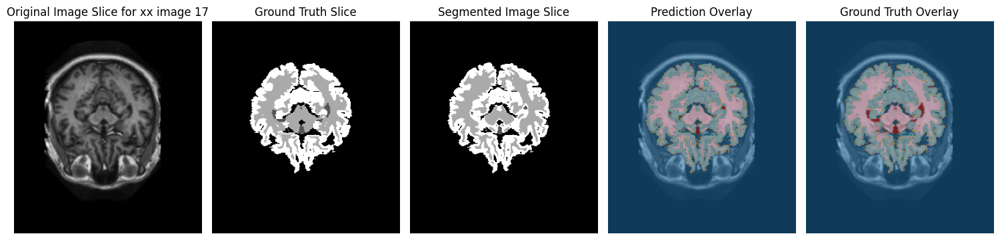

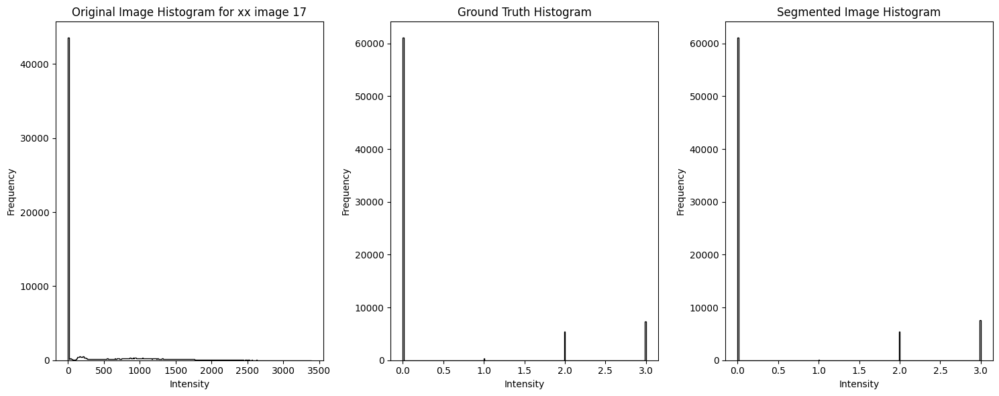

 85%|████████▌ | 17/20 [00:27<00:04,  1.57s/it]

Dice Score: CSF: 0.8019020729623301, GM: 0.7819060852927909, WM: 0.789494491933264, Avg: 0.7911008833961283


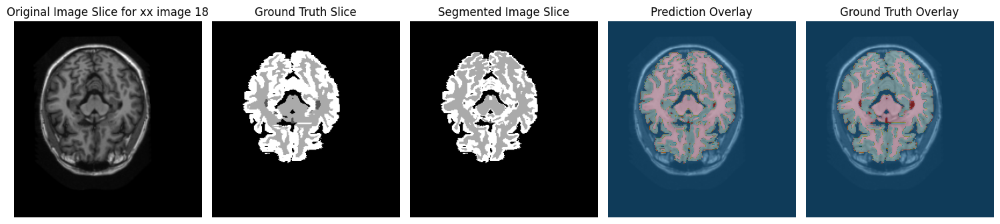

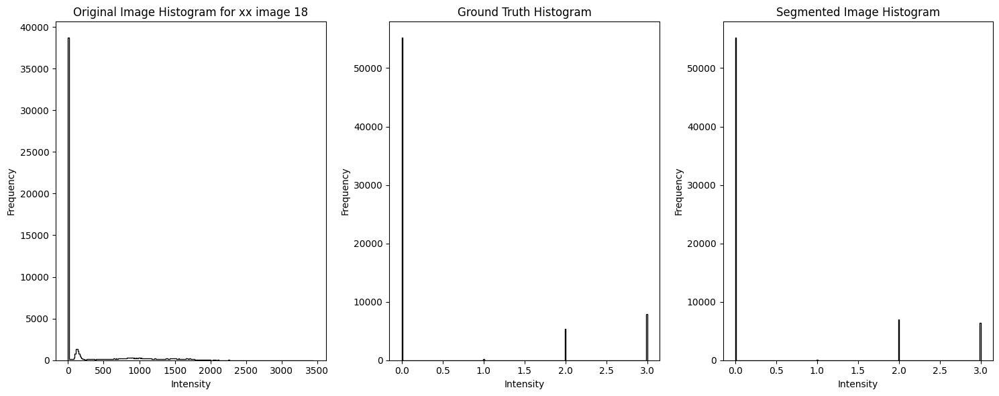

 90%|█████████ | 18/20 [00:29<00:03,  1.60s/it]

Dice Score: CSF: 0.8661854440349295, GM: 0.8662249265715689, WM: 0.8874374336024784, Avg: 0.8732826014029923


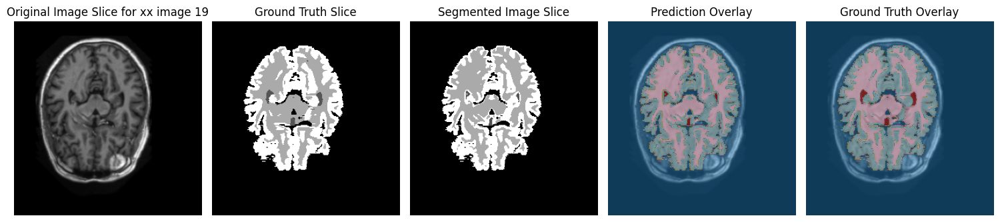

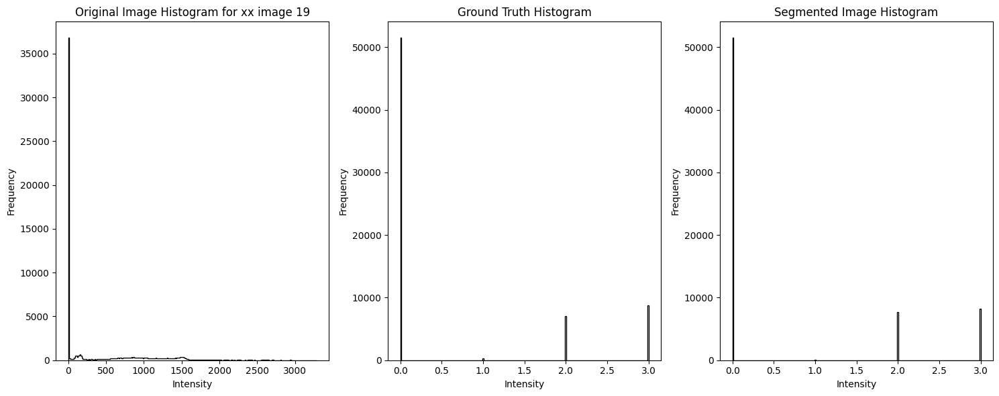

 95%|█████████▌| 19/20 [00:30<00:01,  1.55s/it]

Dice Score: CSF: 0.7012080626132039, GM: 0.8105141178052995, WM: 0.8584925214055092, Avg: 0.790071567274671


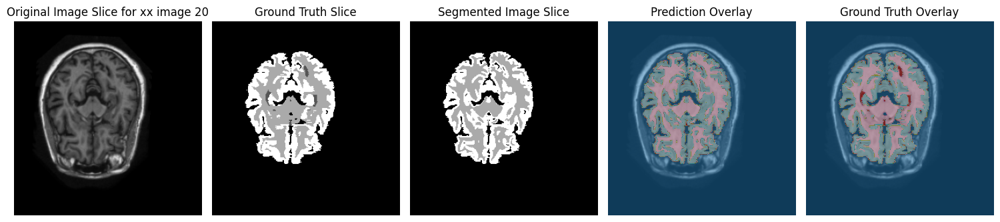

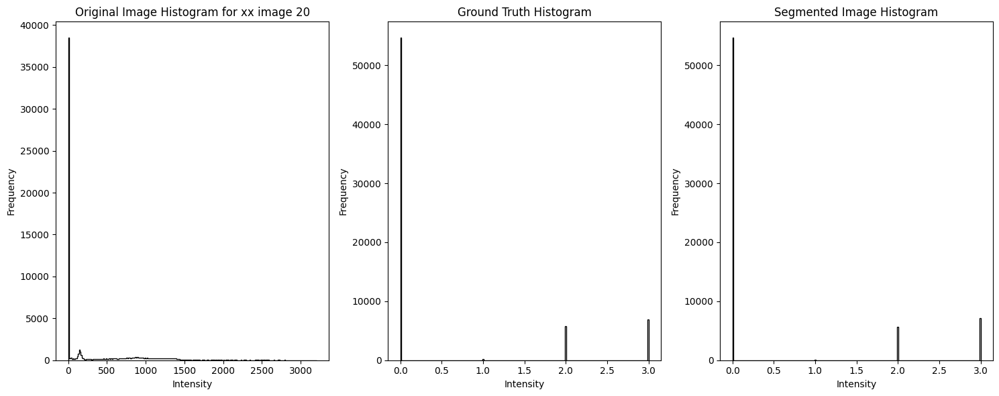

100%|██████████| 20/20 [00:32<00:00,  1.62s/it]

Average Dice Score for Tissue Model: CSF: 0.630477702098146, GM: 0.8843623420632414, WM: 0.9148217563976534, Avg: 0.8098872668530136


In [6]:
# label_histograms_posterior = calculate_tissue_models(train_image_directory, train_label_directory)
# # # save the tissue models
# np.save('tissue_models.npy', label_histograms_posterior)
csf_list = []
gm_list = []
wm_list = []
# Segment test images
for i, test_image_file in tqdm(enumerate(test_image_files), total=len(test_image_files)):
    test_image_name = os.path.splitext(os.path.splitext(test_image_file)[0])[0]
    test_image_filepath = os.path.join('testing-images/', test_image_file)
    test_image = sitk.GetArrayFromImage(sitk.ReadImage(test_image_filepath))
    
    gt_label_filepath = os.path.join('testing-labels/', f'{test_image_name}_3C.nii.gz')
    gt_label = sitk.GetArrayFromImage(sitk.ReadImage(gt_label_filepath))
    
    test_label = segment_image_with_tissue_model(test_image, label_histograms_posterior, gt_label)
    csf, gm, wm = show_results(test_image, gt_label, test_label, modality='xx', i=i, slice_idx=120, plot=True, show_hist=True, cmap='tab20')
    # accumulate dice scores
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for Tissue Model: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')


In [ ]:
csf_values_tissue_models = [
    0.4565065026088311, 0.6761751857521562, 0.874349101738372, 0.556033531877344,
    0.4574051776038531, 0.4890643985419198, 0.6135198966177978, 0.8285704813685187,
    0.5274434986791899, 0.4123579318072675, 0.7222172190201729, 0.6222608432824542,
    0.4546041842667594, 0.5449044212501466, 0.5976545374835598, 0.5781866911295183,
    0.8290048593245947, 0.8019020729623301, 0.8661854440349295, 0.7012080626132039
]

gm_values_tissue_models = [
    0.9271022236475268, 0.874478924545988, 0.9158115093948858, 0.9167207502920516,
    0.9091626615202856, 0.918105489601143, 0.9058026696922032, 0.8998707346012179,
    0.915222570364775, 0.9232311619654561, 0.9108587299946518, 0.8281585380268227,
    0.8468878463738595, 0.8414486821020639, 0.9295240081756936, 0.8904706319585848,
    0.8757445793379558, 0.7819060852927909, 0.8662249265715689, 0.8105141178052995
]

wm_values_tissue_models = [
    0.9499159777624182, 0.9262002644305785, 0.9422995970714175, 0.9390439379465149,
    0.9478340701736195, 0.942573025096133, 0.9365945176724169, 0.9393961712880383,
    0.937233689500477, 0.9486315795307798, 0.9367609395989316, 0.8663993294489609,
    0.8747018082316356, 0.9148022304394005, 0.9459044010235459, 0.9134140745258633,
    0.8993050672710824, 0.789494491933264, 0.8874374336024784, 0.8584925214055092
]


## 2.2 Label Propagation

In [7]:
def perform_label_propagation(test_image_files: List[str], mean_volume, topological_atlas, image_directory, label_directory) -> None:
    """
    Perform label propagation on test images using elastix registration.
    
    Args:
        test_image_files (List[str]): List of test image filenames
        mean_volume: Reference mean volume image
        topological_atlas: Reference topological atlas
        image_directory (str): Path to directory containing the images to be segmented
        label_directory (str): Path to directory containing the ground truth labels
    """
    with tqdm(total=len(test_image_files), desc="Registration Progress") as pbar:
        csf_list = []
        gm_list = []
        wm_list = []
        for file_name in test_image_files:
            # Load images
            fixed_image = itk.imread(os.path.join(image_directory, file_name), itk.F)
            
            gt_label = itk.imread(os.path.join(
                label_directory, 
                f'{os.path.splitext(os.path.splitext(file_name)[0])[0]}_3C.nii.gz'
            ), itk.F)
            
            # Setup registration parameters
            parameter_object = itk.ParameterObject.New()
            parameter_object.AddParameterFile("parameters/9/Parameters.Par0009.affine.txt")
            parameter_object.AddParameterFile("parameters/9/Parameters.Par0009.elastic.txt")
            
            # Perform registration
            result_image, result_transform_parameters = itk.elastix_registration_method(
                fixed_image, mean_volume,
                parameter_object=parameter_object,
                log_to_console=False
            )
            
            # Print registration info
            print(f"Fixed Image: {file_name}")
            
            # Transform atlas
            result_transform_parameters.SetParameter("ResampleInterpolator", 
                                                  ["FinalNearestNeighborInterpolator"])
            topological_atlas_warped = itk.transformix_filter(topological_atlas, 
                                                            result_transform_parameters)
            
            csf, gm, wm = show_results(fixed_image, itk.GetArrayFromImage(gt_label), itk.GetArrayFromImage(topological_atlas_warped), modality='T1', i=i, slice_idx=120, plot=True, show_hist=True, cmap='tab20')
            csf_list.append(csf)
            gm_list.append(gm)
            wm_list.append(wm)
            pbar.update(1)
            
        print(f'Average Dice Score for Tissue Model: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')
            

Registration Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Fixed Image: 1003.nii.gz
Dice Score: CSF: 0.6687690742624619, GM: 0.7956623503776792, WM: 0.7783452354429312, Avg: 0.7475922200276908


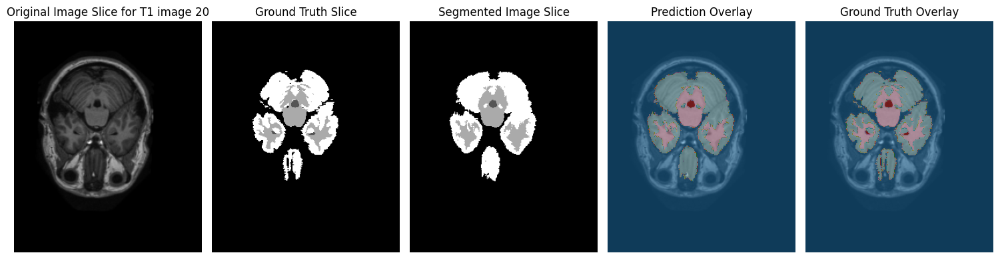

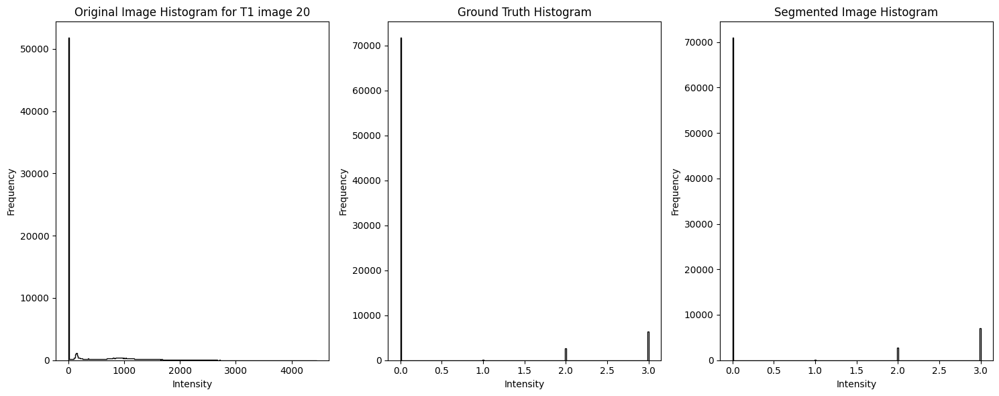

Registration Progress:   5%|▌         | 1/20 [00:34<10:47, 34.06s/it]

Fixed Image: 1004.nii.gz
Dice Score: CSF: 0.8230077120822622, GM: 0.7936557014959185, WM: 0.7618441054703271, Avg: 0.7928358396828359


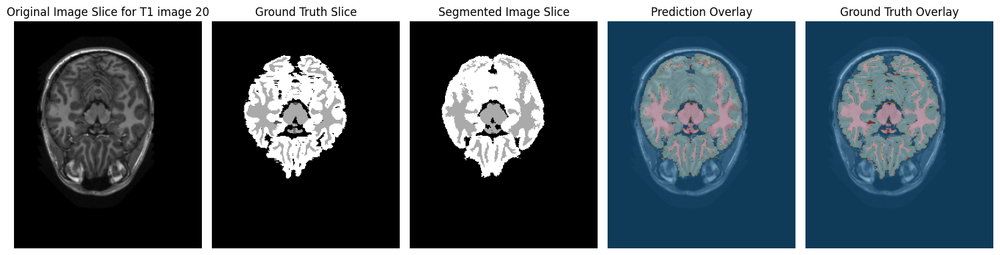

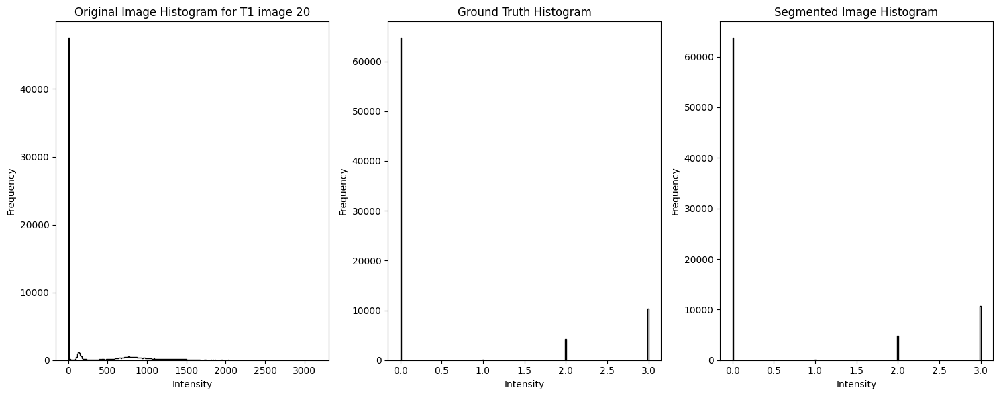

Registration Progress:  10%|█         | 2/20 [00:53<07:34, 25.22s/it]

Fixed Image: 1005.nii.gz
Dice Score: CSF: 0.7712003845371689, GM: 0.7227632035092657, WM: 0.7122486195315726, Avg: 0.735404069192669


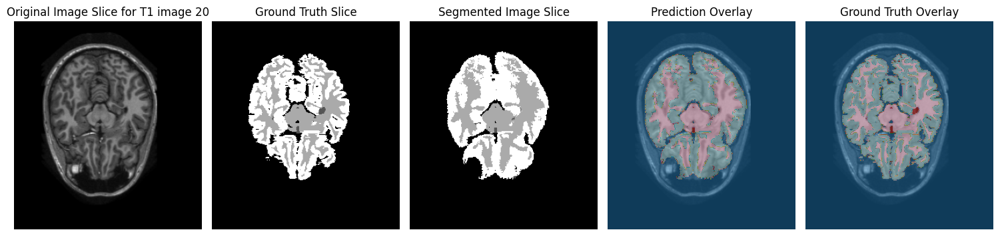

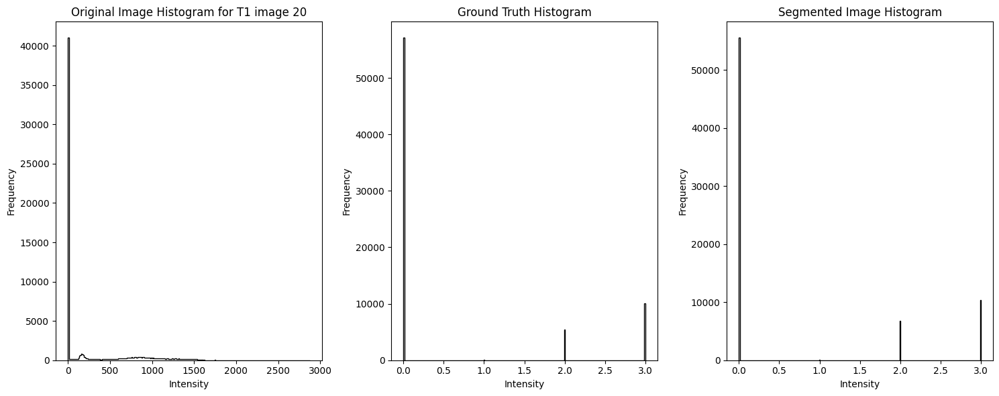

Registration Progress:  15%|█▌        | 3/20 [01:05<05:26, 19.22s/it]

Fixed Image: 1018.nii.gz
Dice Score: CSF: 0.8108197126271152, GM: 0.789181632368979, WM: 0.7736934485318994, Avg: 0.7912315978426645


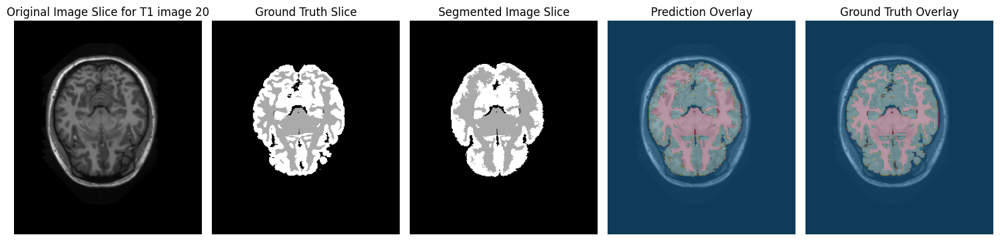

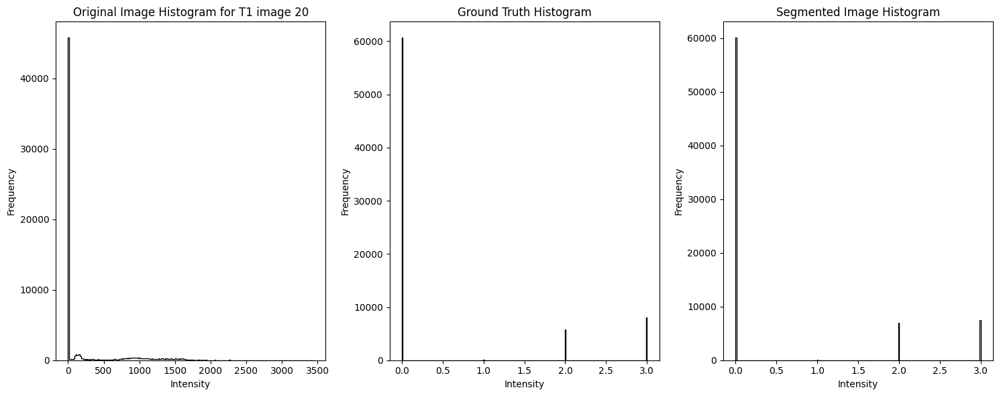

Registration Progress:  20%|██        | 4/20 [01:24<05:10, 19.40s/it]

Fixed Image: 1019.nii.gz
Dice Score: CSF: 0.7480163228292904, GM: 0.7727176860039675, WM: 0.7541002585837618, Avg: 0.7582780891390066


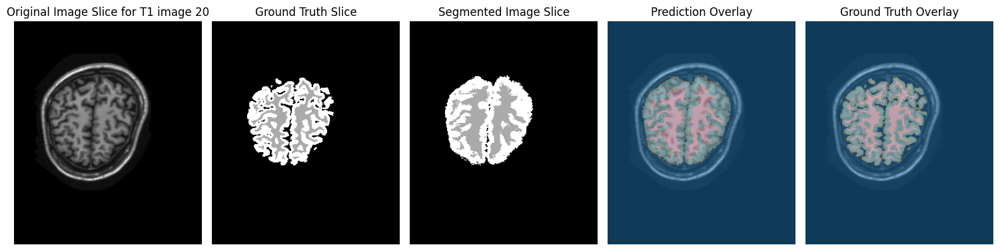

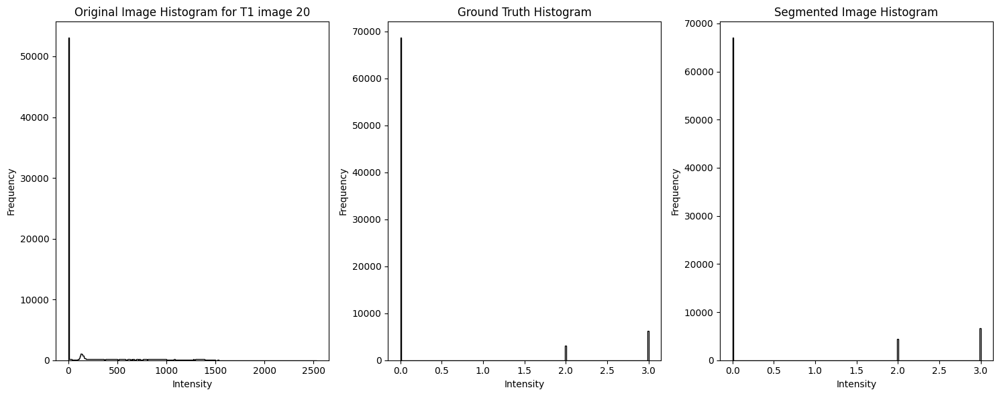

Registration Progress:  25%|██▌       | 5/20 [01:42<04:42, 18.83s/it]

Fixed Image: 1023.nii.gz
Dice Score: CSF: 0.6954262463846267, GM: 0.7947243228560488, WM: 0.7821471391352108, Avg: 0.7574325694586287


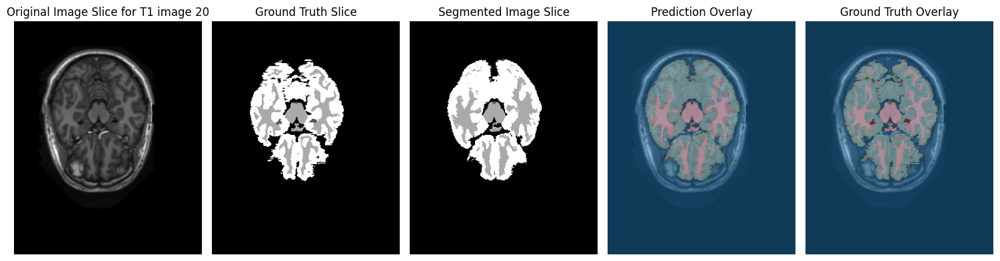

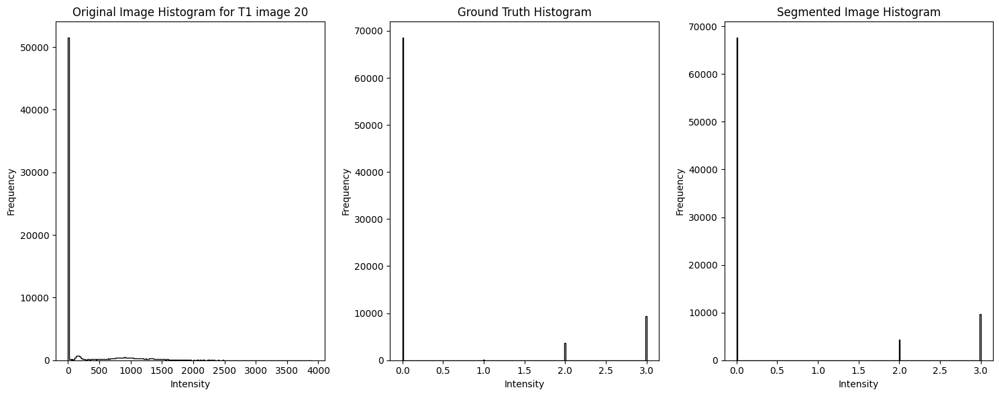

Registration Progress:  30%|███       | 6/20 [02:02<04:28, 19.20s/it]

Fixed Image: 1024.nii.gz
Dice Score: CSF: 0.8163014958939585, GM: 0.786055093061969, WM: 0.7809327618575794, Avg: 0.7944297836045022


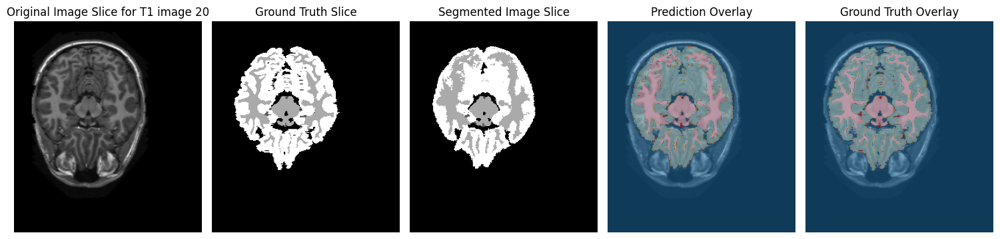

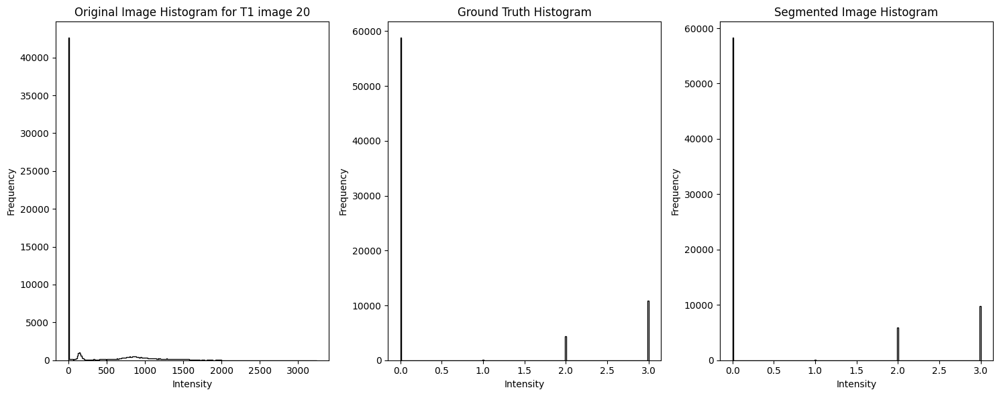

Registration Progress:  35%|███▌      | 7/20 [02:22<04:12, 19.39s/it]

Fixed Image: 1025.nii.gz
Dice Score: CSF: 0.7581343163968585, GM: 0.7251844081109199, WM: 0.7329543733529881, Avg: 0.7387576992869221


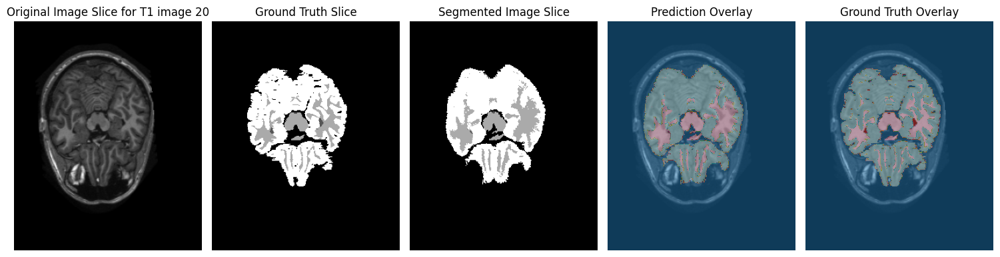

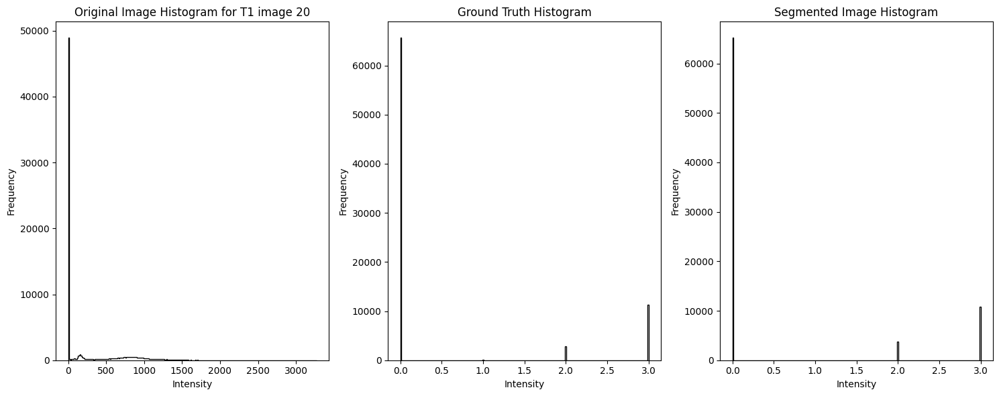

Registration Progress:  40%|████      | 8/20 [02:35<03:30, 17.52s/it]

Fixed Image: 1038.nii.gz
Dice Score: CSF: 0.8033154632903692, GM: 0.7908573268881707, WM: 0.7717120962467391, Avg: 0.7886282954750929


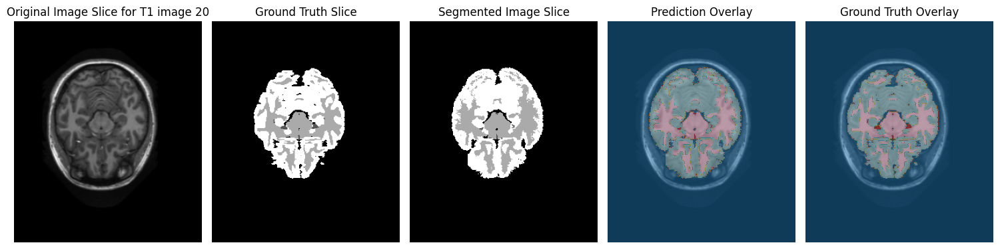

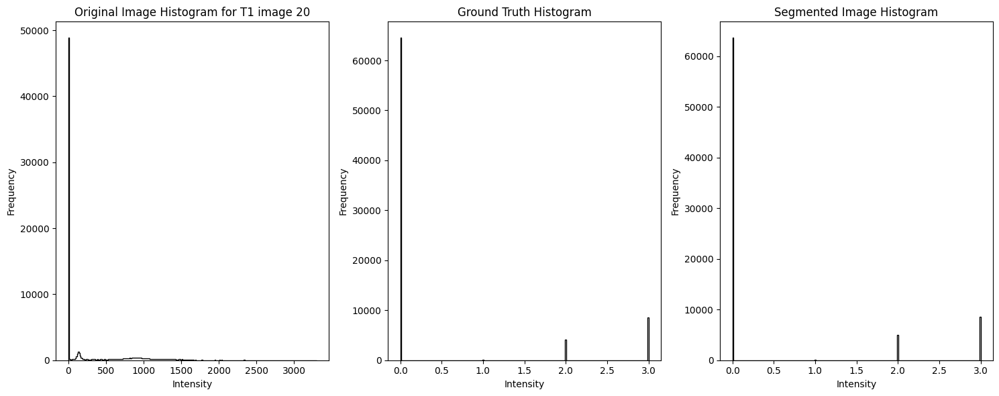

Registration Progress:  45%|████▌     | 9/20 [02:54<03:17, 17.99s/it]

Fixed Image: 1039.nii.gz
Dice Score: CSF: 0.6819659405171995, GM: 0.7518109592827059, WM: 0.722212126468588, Avg: 0.7186630087561645


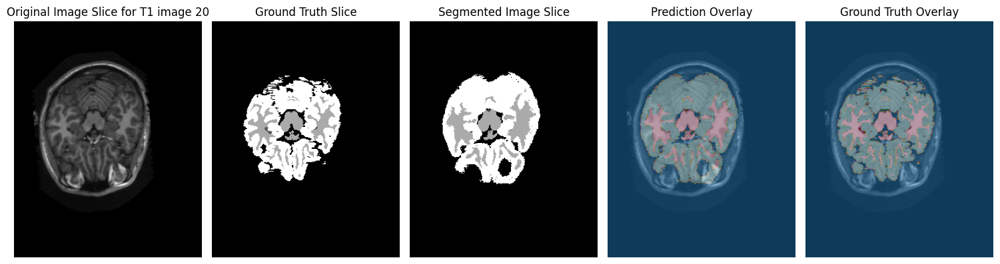

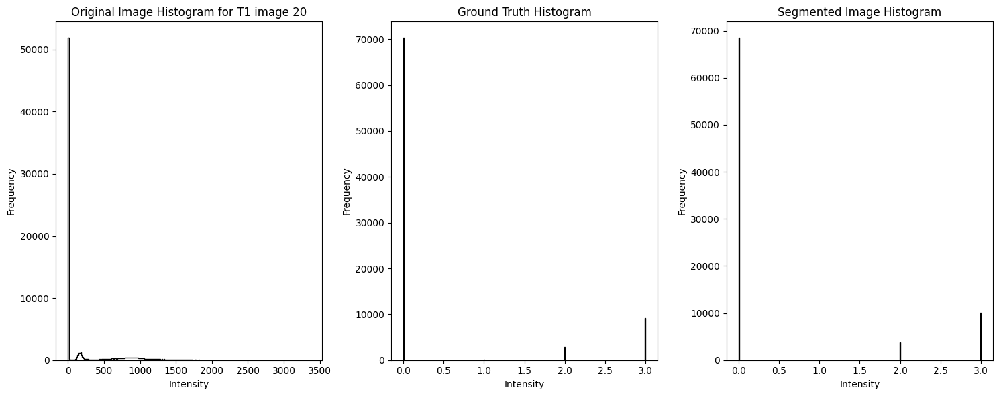

Registration Progress:  50%|█████     | 10/20 [03:08<02:46, 16.63s/it]

Fixed Image: 1101.nii.gz
Dice Score: CSF: 0.851865377592404, GM: 0.7961228856911974, WM: 0.7948815805515939, Avg: 0.8142899479450652


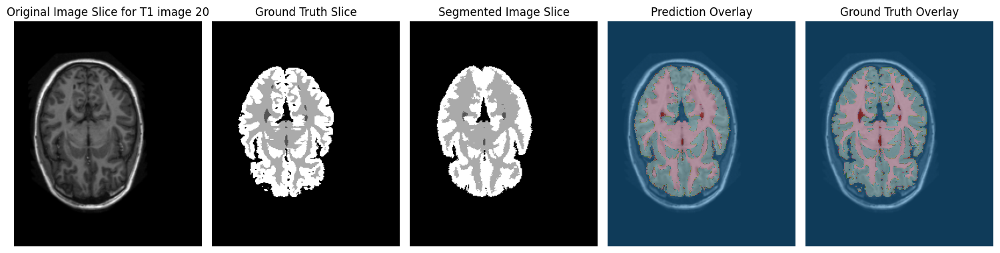

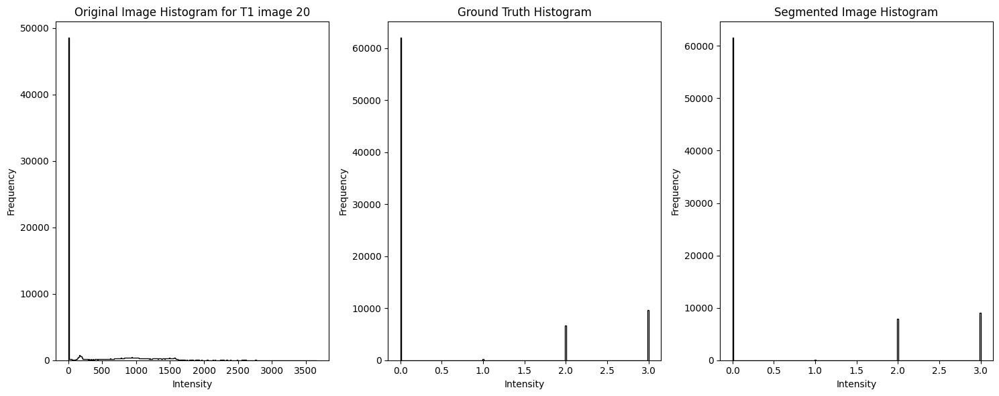

Registration Progress:  55%|█████▌    | 11/20 [03:28<02:37, 17.55s/it]

Fixed Image: 1104.nii.gz
Dice Score: CSF: 0.8026124818577649, GM: 0.7765665117563153, WM: 0.7739718239559931, Avg: 0.7843836058566911


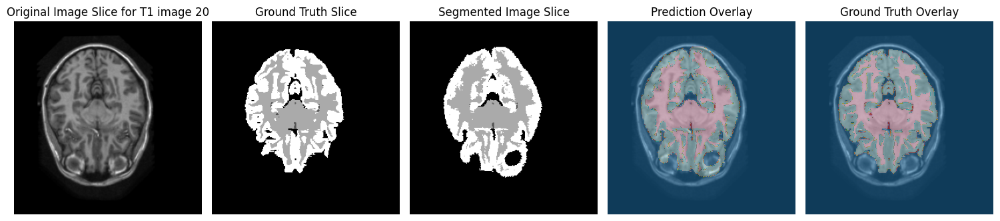

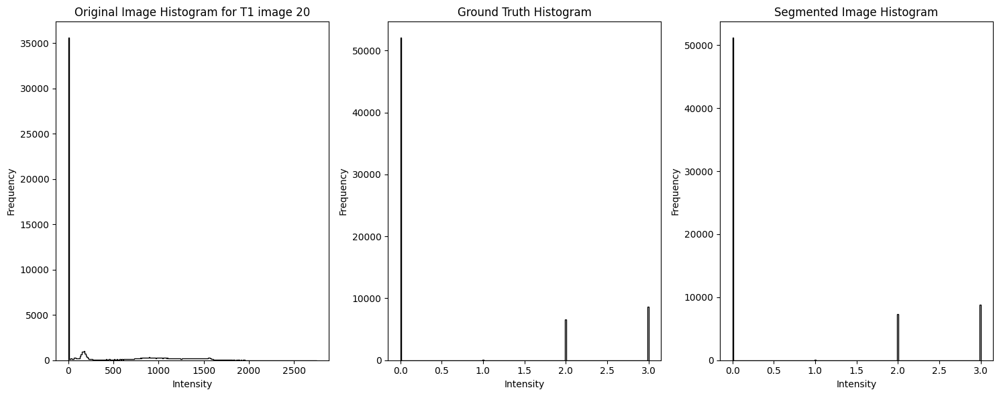

Registration Progress:  60%|██████    | 12/20 [03:40<02:08, 16.07s/it]

Fixed Image: 1107.nii.gz
Dice Score: CSF: 0.7772101288316304, GM: 0.8137994691975303, WM: 0.8109919950866236, Avg: 0.8006671977052614


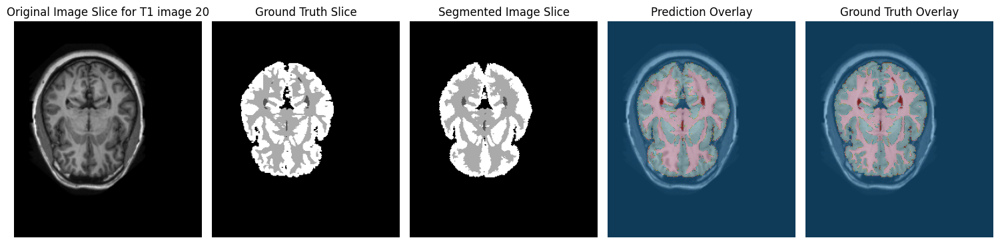

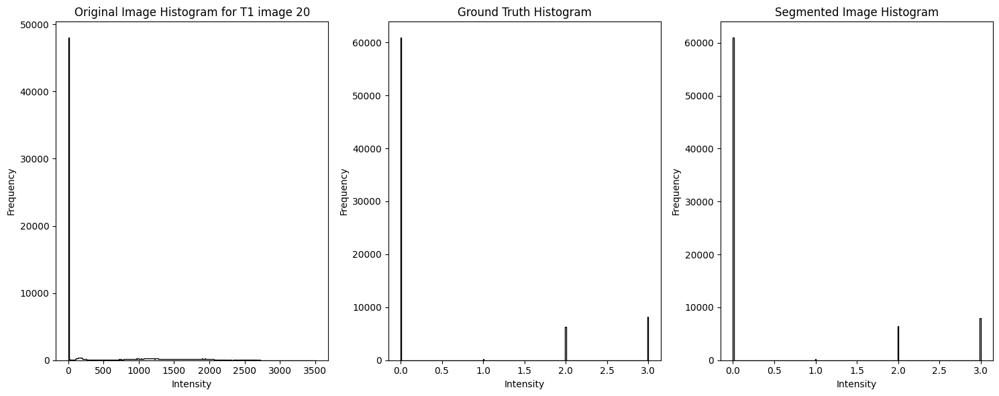

Registration Progress:  65%|██████▌   | 13/20 [03:59<01:58, 16.89s/it]

Fixed Image: 1110.nii.gz
Dice Score: CSF: 0.7601159230096238, GM: 0.774045285833387, WM: 0.7594744734857305, Avg: 0.7645452274429139


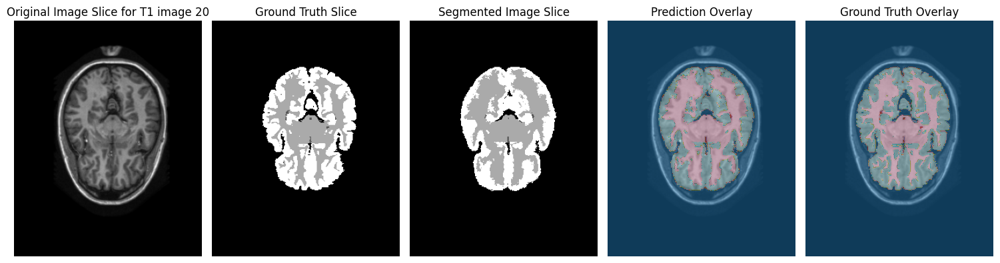

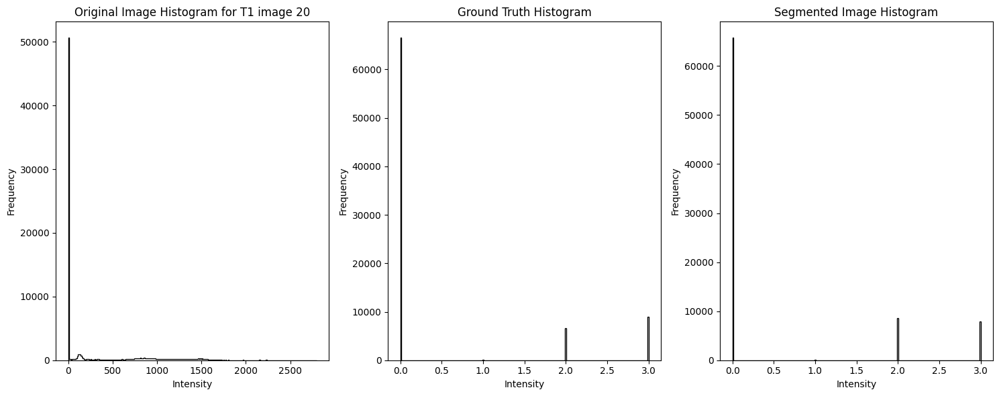

Registration Progress:  70%|███████   | 14/20 [04:19<01:45, 17.66s/it]

Fixed Image: 1113.nii.gz
Dice Score: CSF: 0.7650849443468073, GM: 0.8059306118777456, WM: 0.7644565184941935, Avg: 0.7784906915729155


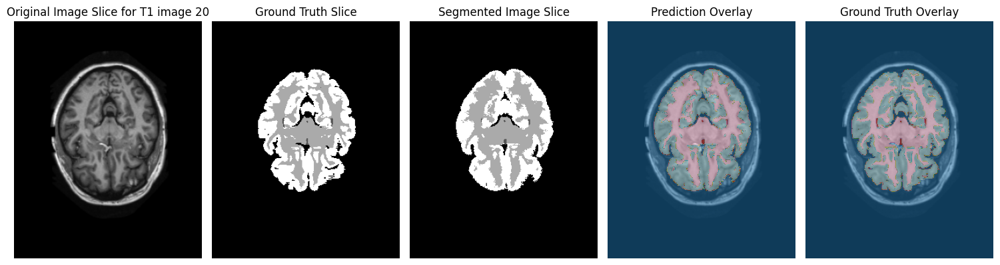

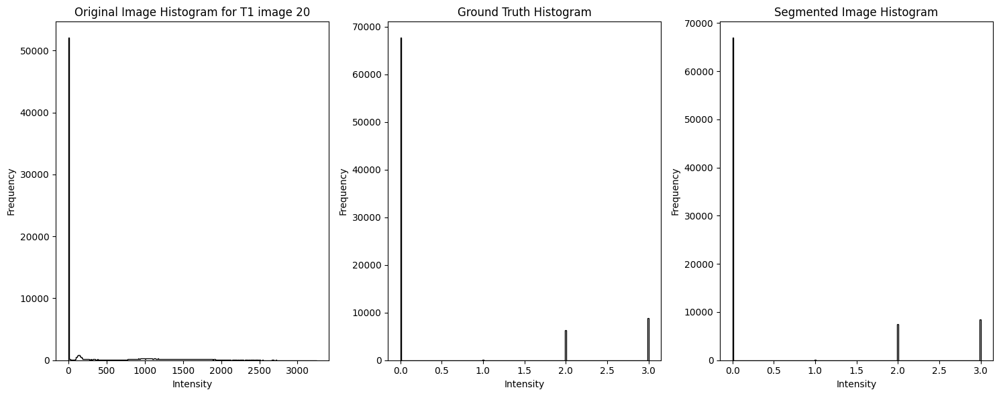

Registration Progress:  75%|███████▌  | 15/20 [04:39<01:31, 18.37s/it]

Fixed Image: 1116.nii.gz
Dice Score: CSF: 0.7840513923176979, GM: 0.7524894695634298, WM: 0.7375154927053623, Avg: 0.7580187848621635


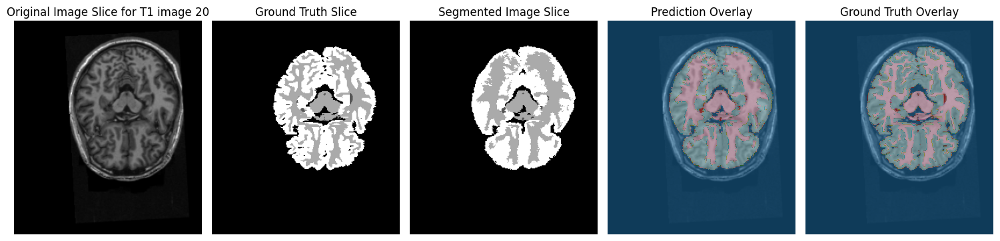

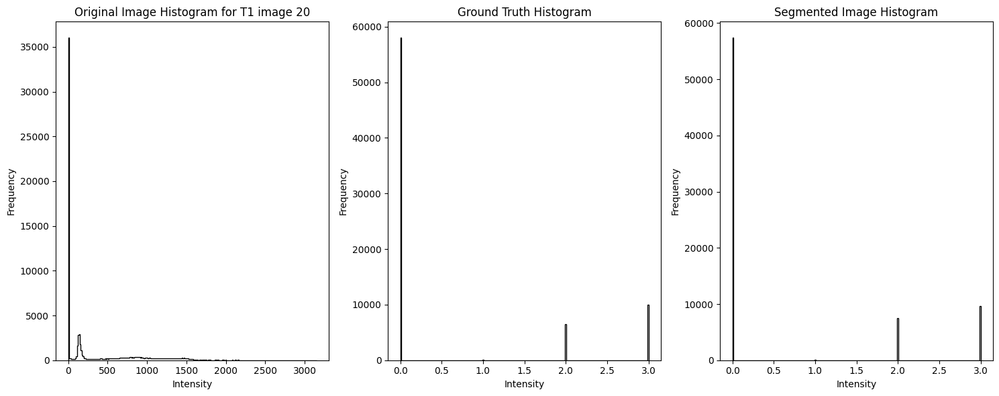

Registration Progress:  80%|████████  | 16/20 [04:51<01:06, 16.64s/it]

Fixed Image: 1119.nii.gz
Dice Score: CSF: 0.8509427179036511, GM: 0.7732693445666754, WM: 0.7332399664768083, Avg: 0.7858173429823783


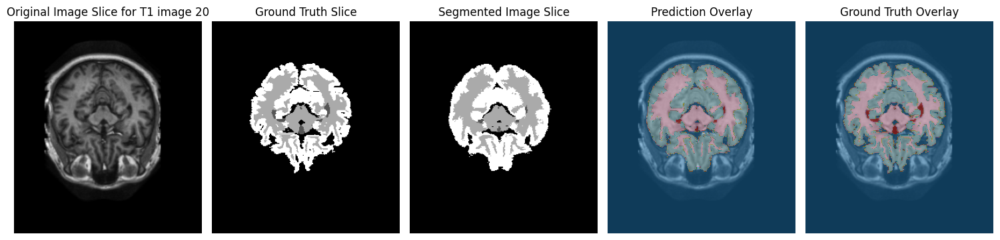

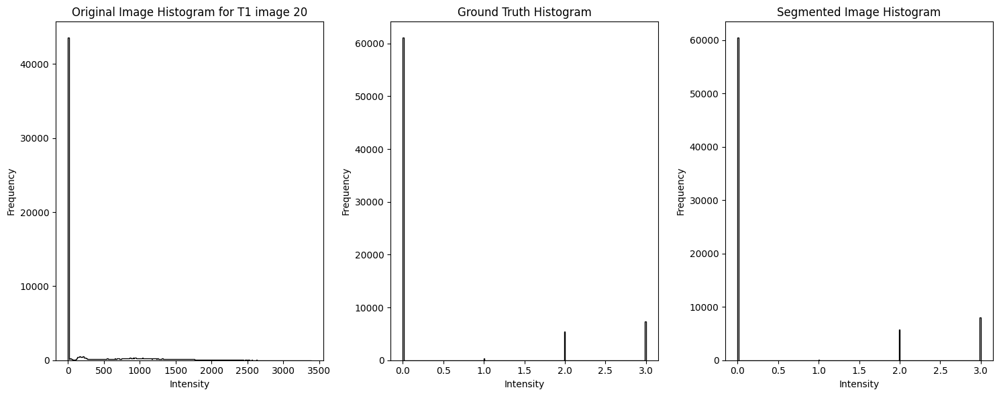

Registration Progress:  85%|████████▌ | 17/20 [05:11<00:52, 17.55s/it]

Fixed Image: 1122.nii.gz
Dice Score: CSF: 0.6780209817381169, GM: 0.7689550281675253, WM: 0.727388206158057, Avg: 0.7247880720212331


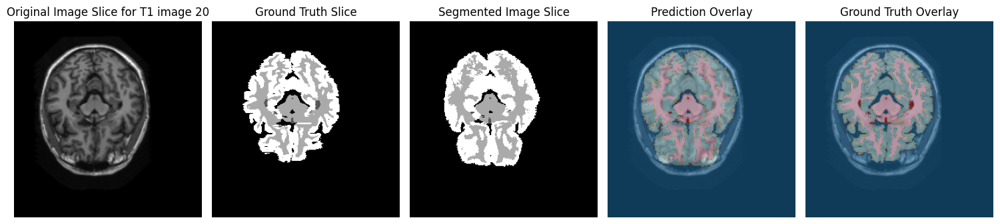

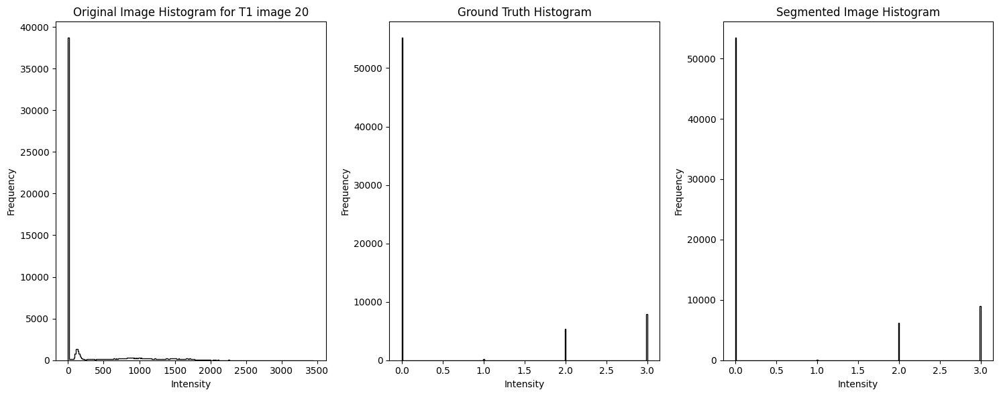

Registration Progress:  90%|█████████ | 18/20 [05:23<00:31, 15.96s/it]

Fixed Image: 1125.nii.gz
Dice Score: CSF: 0.8672700409096646, GM: 0.7905311072768749, WM: 0.7644542267443393, Avg: 0.807418458310293


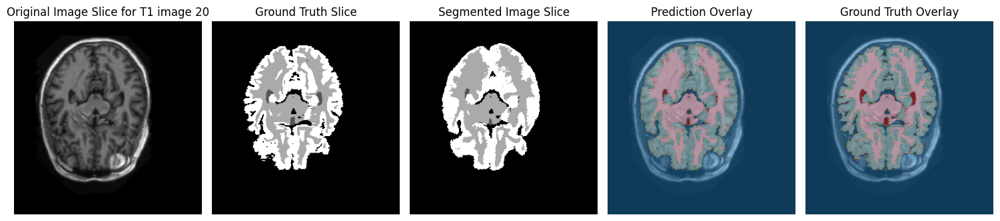

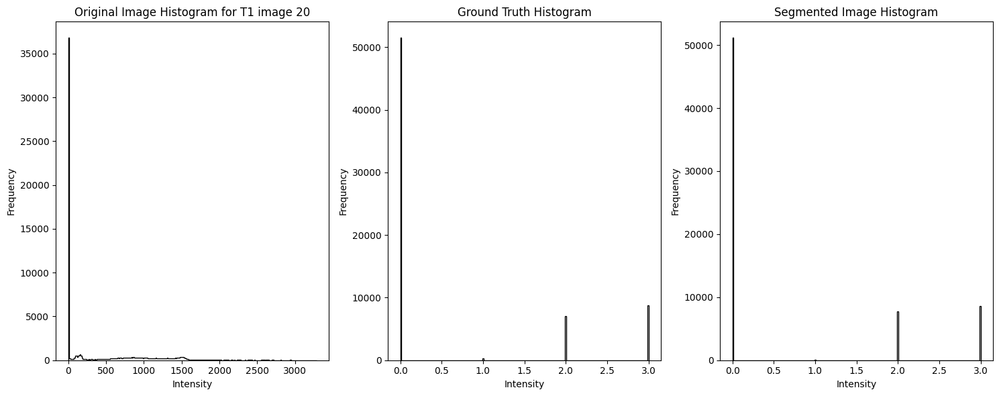

Registration Progress:  95%|█████████▌| 19/20 [05:42<00:16, 16.75s/it]

Fixed Image: 1128.nii.gz
Dice Score: CSF: 0.7950561355130983, GM: 0.769366529611918, WM: 0.7431535321197682, Avg: 0.7691920657482615


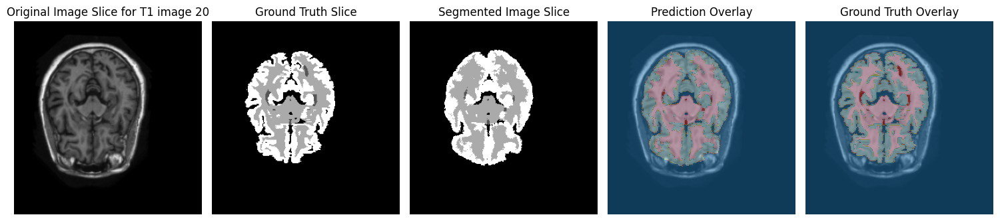

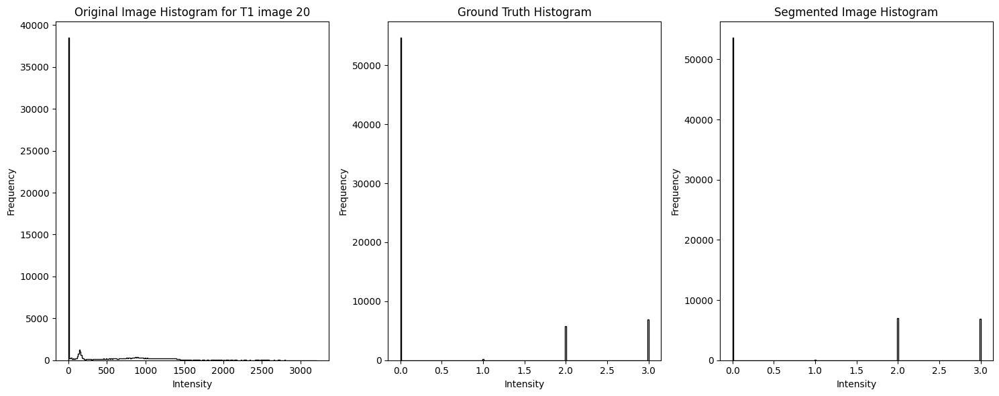

Registration Progress: 100%|██████████| 20/20 [06:00<00:00, 18.03s/it]

Average Dice Score for Tissue Model: CSF: 0.7754593396420885, GM: 0.7771844463749111, WM: 0.7589858990200034, Avg: 0.7705432283456677


In [8]:
perform_label_propagation(test_image_files, mean_volume, topological_atlas, 'testing-images/', 'testing-labels/')

In [ ]:
csf_values_label_propagation = [
    0.6687690742624619, 0.8230077120822622, 0.7712003845371689, 0.8108197126271152,
    0.7480163228292904, 0.6954262463846267, 0.8163014958939585, 0.7581343163968585,
    0.8033154632903692, 0.6819659405171995, 0.851865377592404, 0.8026124818577649,
    0.7772101288316304, 0.7601159230096238, 0.7650849443468073, 0.7840513923176979,
    0.8509427179036511, 0.6780209817381169, 0.8672700409096646, 0.7950561355130983
]

gm_values_label_propagation = [
    0.7956623503776792, 0.7936557014959185, 0.7227632035092657, 0.789181632368979,
    0.7727176860039675, 0.7947243228560488, 0.786055093061969, 0.7251844081109199,
    0.7908573268881707, 0.7518109592827059, 0.7961228856911974, 0.7765665117563153,
    0.8137994691975303, 0.774045285833387, 0.8059306118777456, 0.7524894695634298,
    0.7732693445666754, 0.7689550281675253, 0.7905311072768749, 0.769366529611918
]

wm_values_label_propagation = [
    0.7783452354429312, 0.7618441054703271, 0.7122486195315726, 0.7736934485318994,
    0.7541002585837618, 0.7821471391352108, 0.7809327618575794, 0.7329543733529881,
    0.7717120962467391, 0.722212126468588, 0.7948815805515939, 0.7739718239559931,
    0.8109919950866236, 0.7594744734857305, 0.7644565184941935, 0.7375154927053623,
    0.7332399664768083, 0.727388206158057, 0.7644542267443393, 0.7431535321197682
]


## 2.3 Tissue models & label propagation

In [9]:
def probability_image_tissue_model(image: np.ndarray, tissue_models: np.ndarray, gt_label) -> np.ndarray:
    """
    Segment an image using tissue models and return probability maps for each tissue class.

    Args:
        image (np.ndarray): Input image to be segmented
        tissue_models (np.ndarray): Pre-calculated tissue probability models of shape (num_classes, 256)
            representing the probability distribution for each tissue class
        gt_label (np.ndarray): Ground truth label mask of same shape as input image,
            used to mask out background (where gt_label == 0)

    Returns:
        np.ndarray: Probability maps for each tissue class with shape (num_classes, height, width, depth),
            where num_classes=4 representing [background, CSF, WM, GM]
    """
    # Normalize image to [0, 255] range
    image = (image - image.min()) / (image.max() - image.min()) * 255
    image = image.astype(np.uint8)
    
    # Mask out background
    image[gt_label == 0] = 0
    flat_image = image.ravel()
    posteriors = tissue_models[:, flat_image]  # Shape: (num_classes, num_pixels)
    tissue = posteriors.reshape((3, *image.shape))
    # add background class
    background = np.ones(image.shape) - np.sum(tissue, axis=0)
    tissue = np.concatenate([background[None], tissue], axis=0)
    
    return tissue

def combine_tissue_models_and_label_propagation(
    test_image_files: List[str], 
    mean_volume, 
    probability_atlases: List, 
    label_histograms_posterior: np.ndarray,
    image_directory: str,
    label_directory: str
) -> None:
    """
    Combine tissue models and label propagation for image segmentation.
    
    Args:
        test_image_files (List[str]): List of test image filenames
        mean_volume: Reference mean volume image
        probability_atlases: List of probability atlas images for each tissue class
        label_histograms_posterior: Pre-calculated tissue probability models
        image_directory (str): Path to directory containing the images to be segmented
        label_directory (str): Path to directory containing the ground truth labels 
    """
    with tqdm(total=len(test_image_files), desc="Registration Progress") as pbar:
        csf_list = []
        gm_list = []
        wm_list = []
        for file_name in test_image_files:
            # Load images
            fixed_image = itk.imread(os.path.join(image_directory, file_name), itk.F)
            gt_label = itk.imread(os.path.join(
                label_directory, 
                f'{os.path.splitext(os.path.splitext(file_name)[0])[0]}_3C.nii.gz'
            ), itk.F)
            
            # Setup and perform registration
            parameter_object = itk.ParameterObject.New()
            parameter_object.AddParameterFile("parameters/9/Parameters.Par0009.affine.txt")
            parameter_object.AddParameterFile("parameters/9/Parameters.Par0009.elastic.txt")
            
            result_image, result_transform_parameters = itk.elastix_registration_method(
                fixed_image, mean_volume,
                parameter_object=parameter_object,
                log_to_console=False
            )
            
            # Print registration info
            print(f"Fixed Image: {file_name}")
            
            # Transform probability atlases
            result_transform_parameters.SetParameter("ResampleInterpolator", 
                                                  ["FinalNearestNeighborInterpolator"])
            probability_atlases_warped = [
                itk.transformix_filter(atlas, result_transform_parameters) 
                for atlas in probability_atlases
            ]
            probability_atlases_warped = np.array([
                itk.GetArrayFromImage(atlas) 
                for atlas in probability_atlases_warped
            ])
            
            # Calculate tissue probabilities and combine with atlas probabilities
            tissue_probs = probability_image_tissue_model(
                itk.GetArrayFromImage(fixed_image), 
                label_histograms_posterior, 
                itk.GetArrayFromImage(gt_label)
            )
            final_probs = tissue_probs * probability_atlases_warped
            final_label = np.argmax(final_probs, axis=0)
            csf, gm, wm = show_results(fixed_image, itk.GetArrayFromImage(gt_label), final_label, modality='T1', i=i, slice_idx=120, plot=True, show_hist=True, cmap='tab20')
            csf_list.append(csf)
            gm_list.append(gm)
            wm_list.append(wm)
            pbar.update(1)
        print(f'Average Dice Score for Tissue Model: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')
            

Registration Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Fixed Image: 1003.nii.gz
Dice Score: CSF: 0.728104415711149, GM: 0.9288738623910886, WM: 0.9533221147085678, Avg: 0.8701001309369353


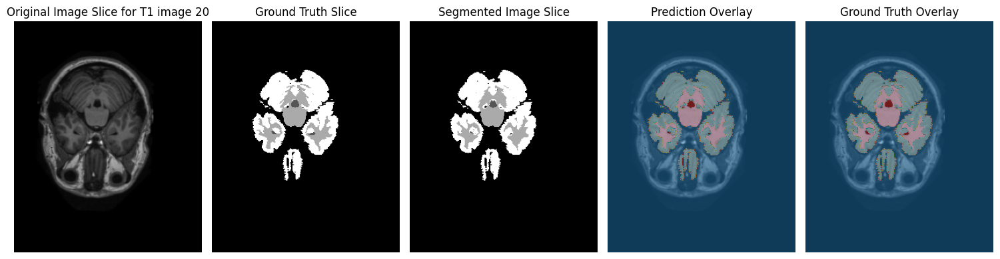

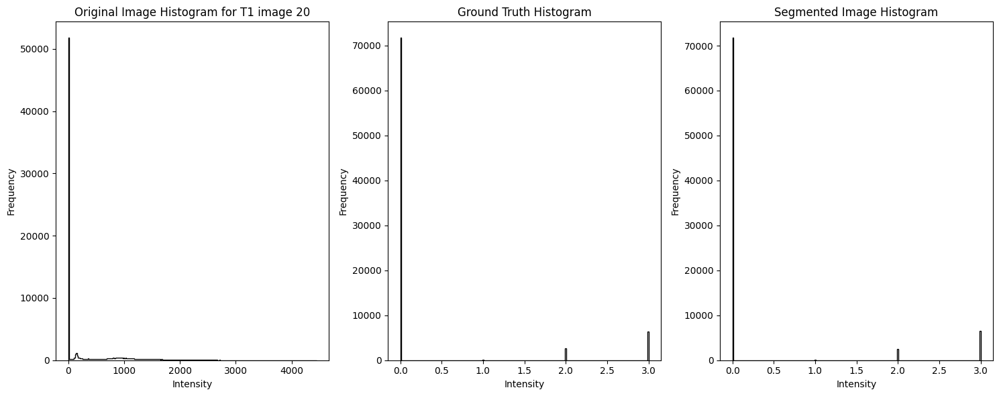

Registration Progress:   5%|▌         | 1/20 [00:28<09:06, 28.75s/it]

Fixed Image: 1004.nii.gz
Dice Score: CSF: 0.856511684097891, GM: 0.9209663371070531, WM: 0.9487461505848206, Avg: 0.9087413905965883


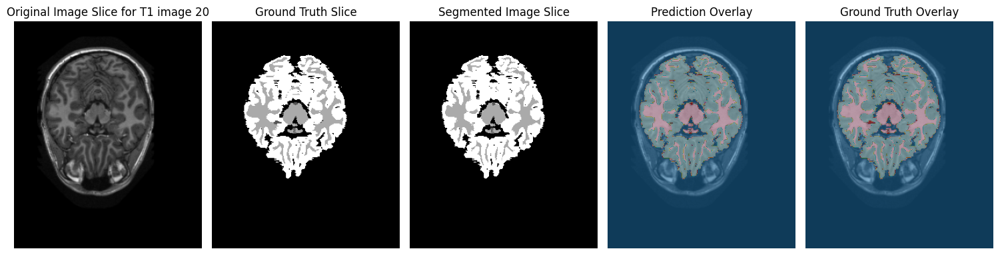

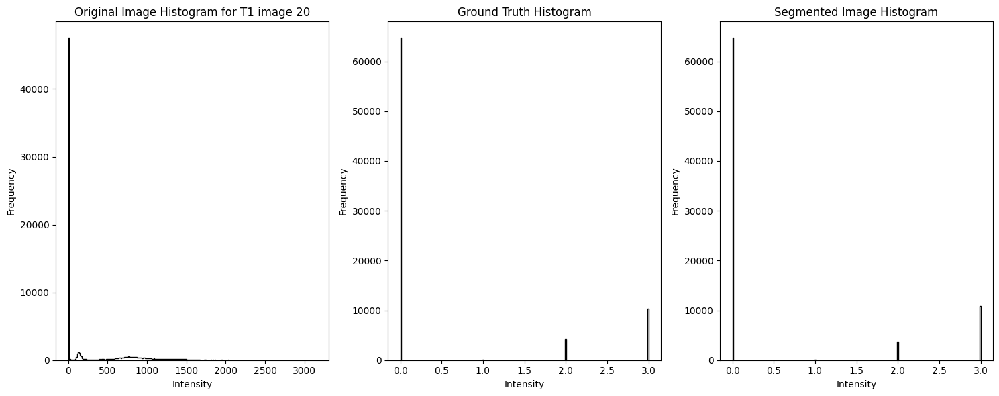

Registration Progress:  10%|█         | 2/20 [01:01<09:18, 31.03s/it]

Fixed Image: 1005.nii.gz
Dice Score: CSF: 0.8827584997017649, GM: 0.8934408914345464, WM: 0.9309000732822728, Avg: 0.902366488139528


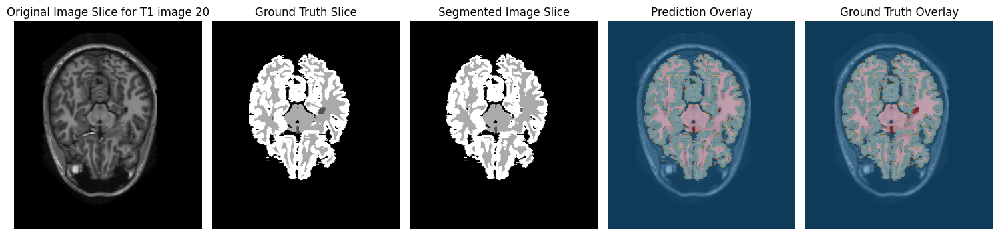

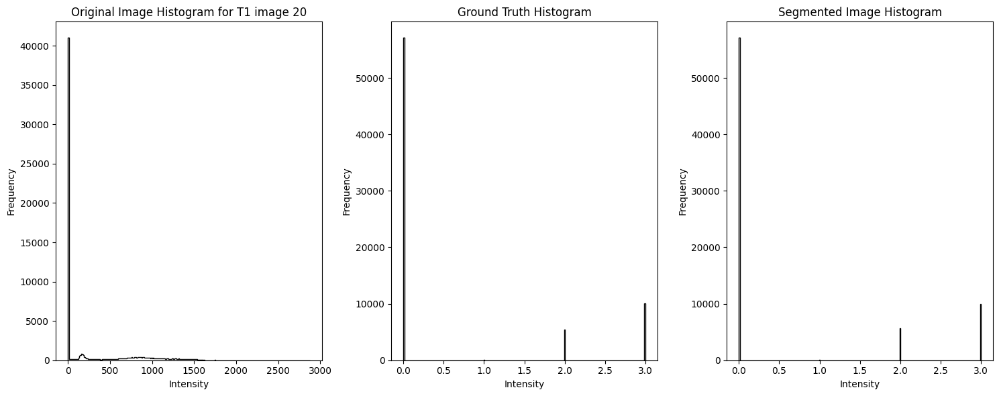

Registration Progress:  15%|█▌        | 3/20 [01:27<08:10, 28.87s/it]

Fixed Image: 1018.nii.gz
Dice Score: CSF: 0.7939754555596876, GM: 0.9180003726227798, WM: 0.942630420802648, Avg: 0.8848687496617051


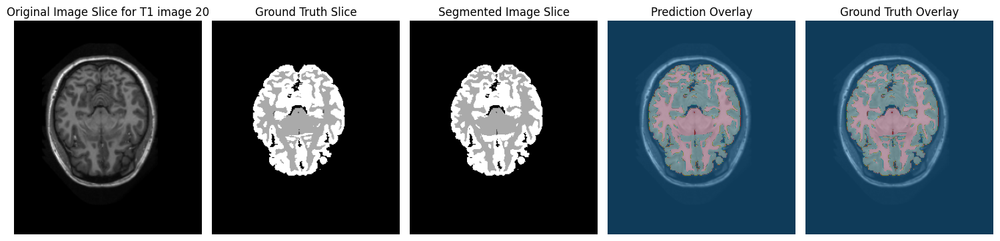

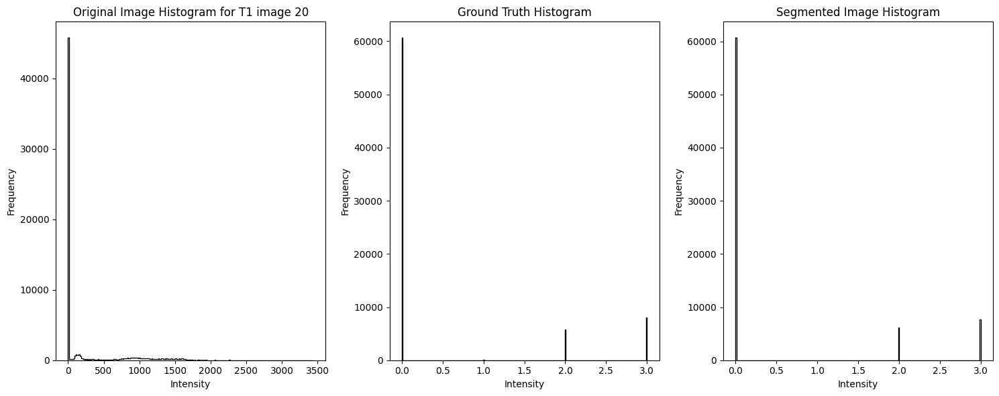

Registration Progress:  20%|██        | 4/20 [02:00<08:08, 30.56s/it]

Fixed Image: 1019.nii.gz
Dice Score: CSF: 0.7761676888858934, GM: 0.9210601669169256, WM: 0.9534236780810792, Avg: 0.8835505112946328


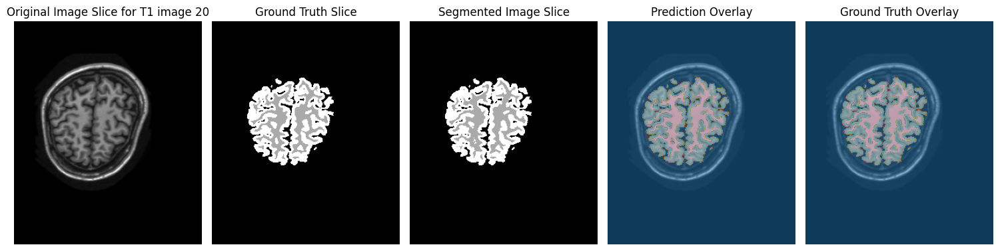

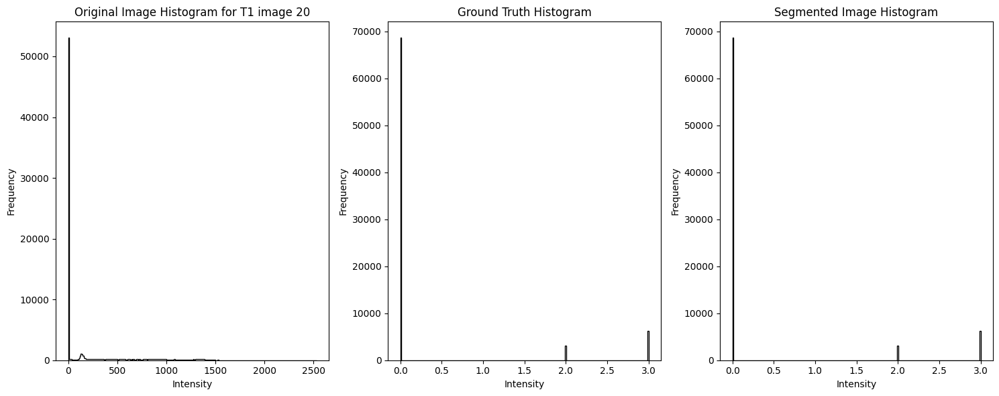

Registration Progress:  25%|██▌       | 5/20 [02:34<07:54, 31.66s/it]

Fixed Image: 1023.nii.gz
Dice Score: CSF: 0.7702807878824164, GM: 0.9293661245821142, WM: 0.9523958763104722, Avg: 0.884014262925001


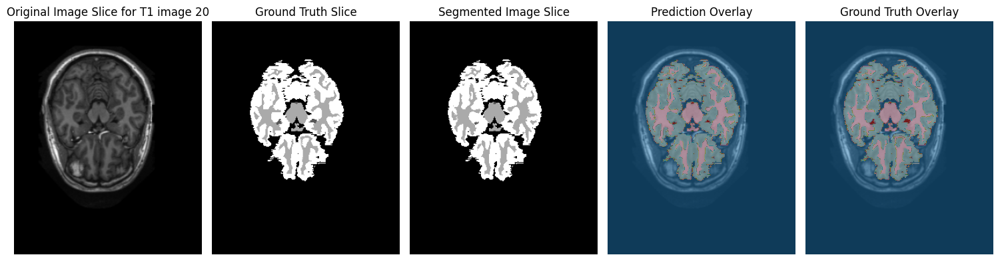

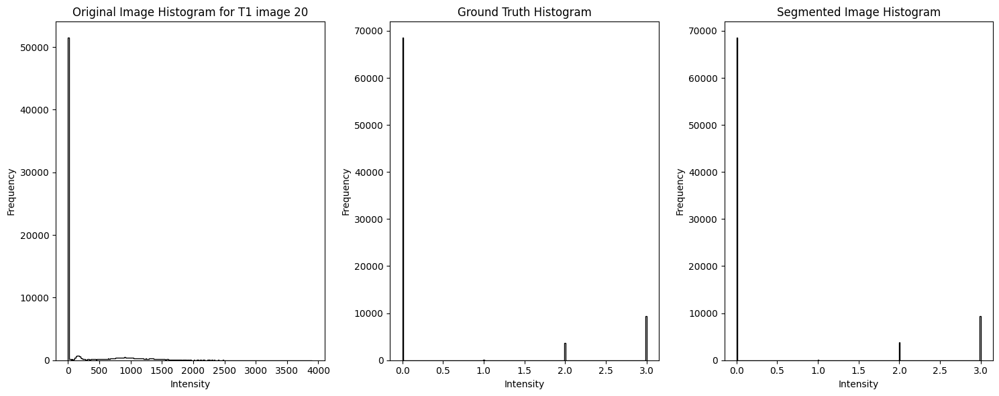

Registration Progress:  30%|███       | 6/20 [03:09<07:38, 32.72s/it]

Fixed Image: 1024.nii.gz
Dice Score: CSF: 0.8293306476603657, GM: 0.9152809420455924, WM: 0.943682174760355, Avg: 0.8960979214887711


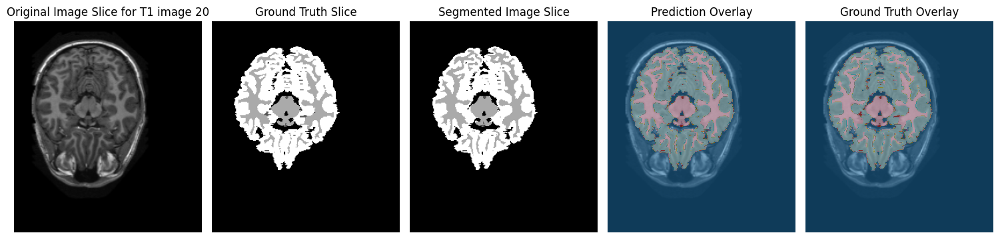

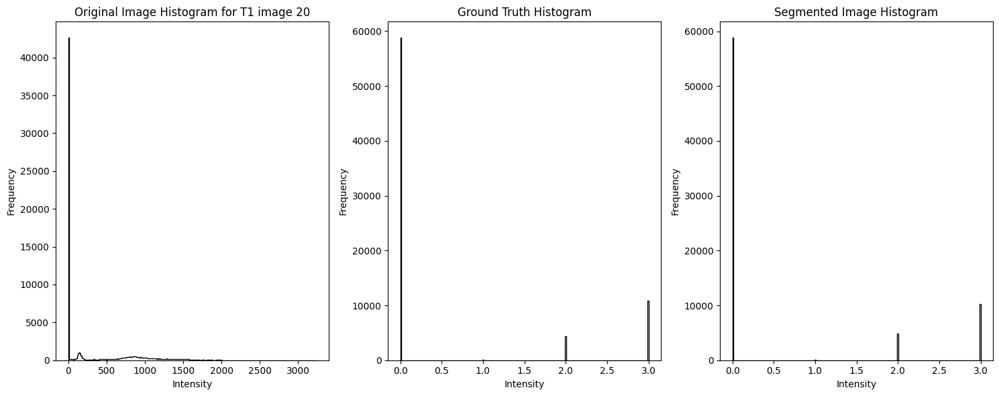

Registration Progress:  35%|███▌      | 7/20 [03:42<07:08, 32.96s/it]

Fixed Image: 1025.nii.gz
Dice Score: CSF: 0.874571947725208, GM: 0.8886656856579374, WM: 0.9364808764873539, Avg: 0.899906169956833


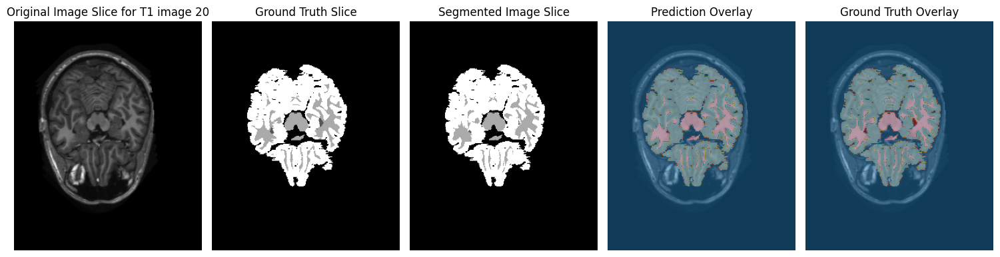

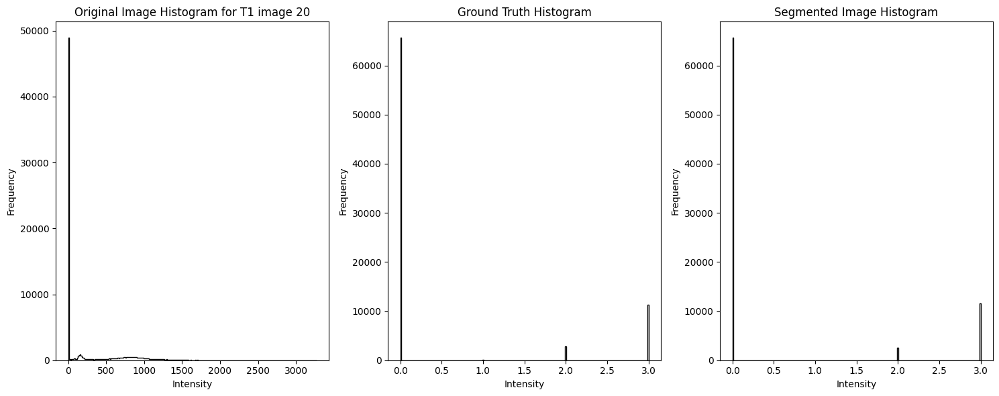

Registration Progress:  40%|████      | 8/20 [04:09<06:13, 31.16s/it]

Fixed Image: 1038.nii.gz
Dice Score: CSF: 0.7621562709590879, GM: 0.9176554849434964, WM: 0.9422604487348887, Avg: 0.874024068212491


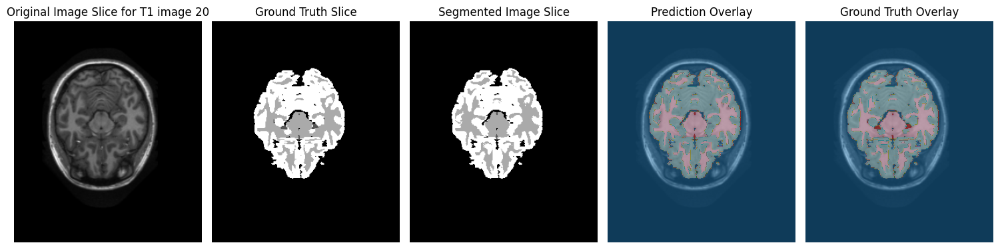

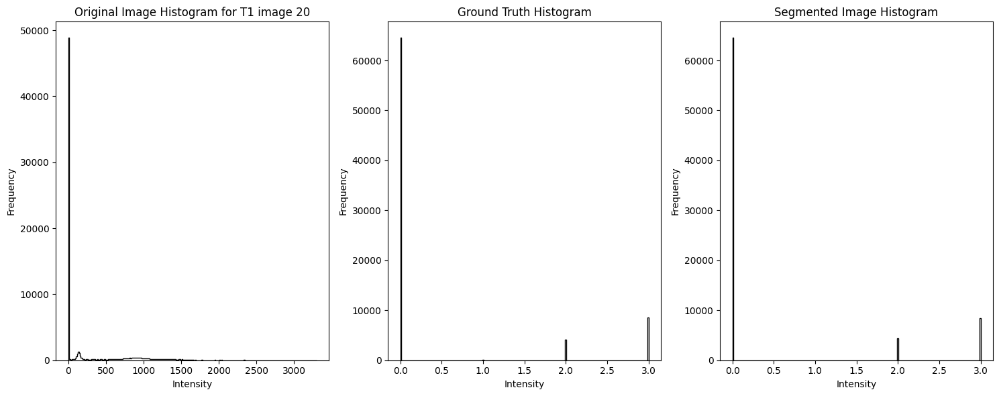

Registration Progress:  45%|████▌     | 9/20 [04:38<05:32, 30.23s/it]

Fixed Image: 1039.nii.gz
Dice Score: CSF: 0.7120576260569997, GM: 0.905194582174912, WM: 0.9376192045375114, Avg: 0.8516238042564744


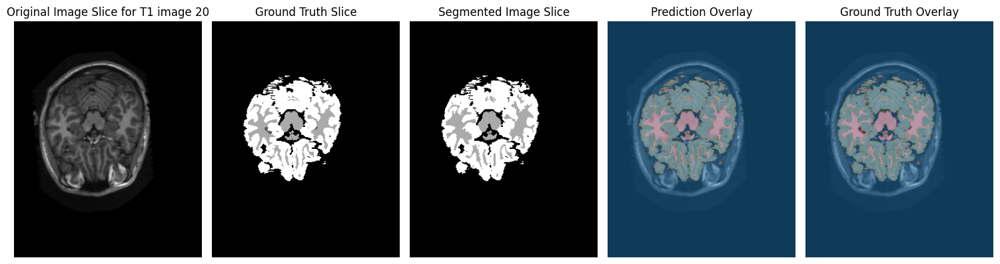

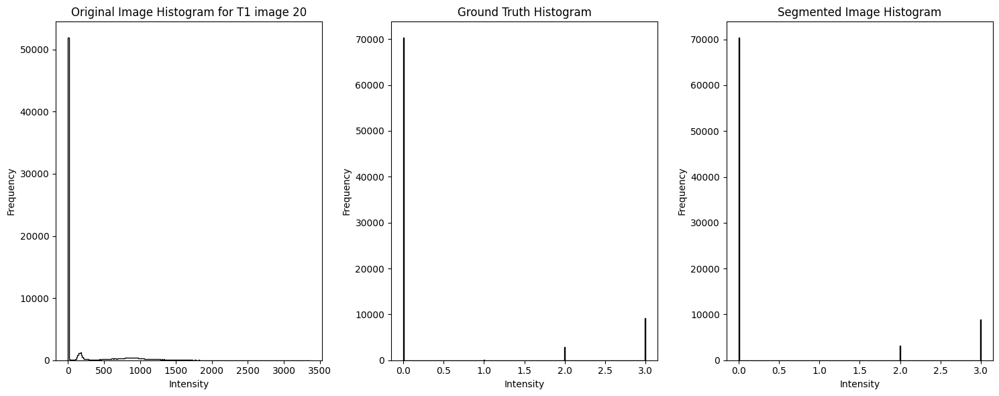

Registration Progress:  50%|█████     | 10/20 [04:59<04:35, 27.53s/it]

Fixed Image: 1101.nii.gz
Dice Score: CSF: 0.853866196171758, GM: 0.9252148150284017, WM: 0.9506688607949619, Avg: 0.9099166239983738


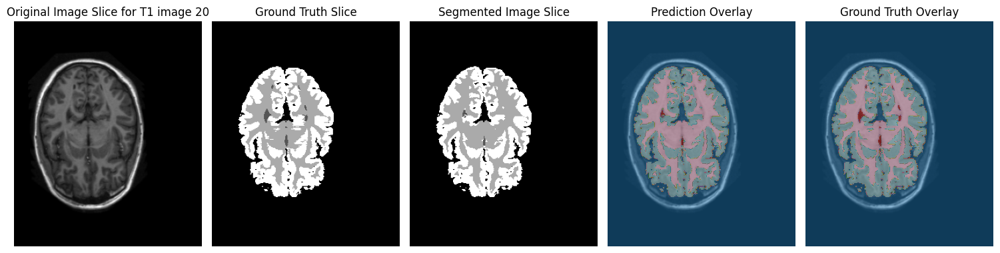

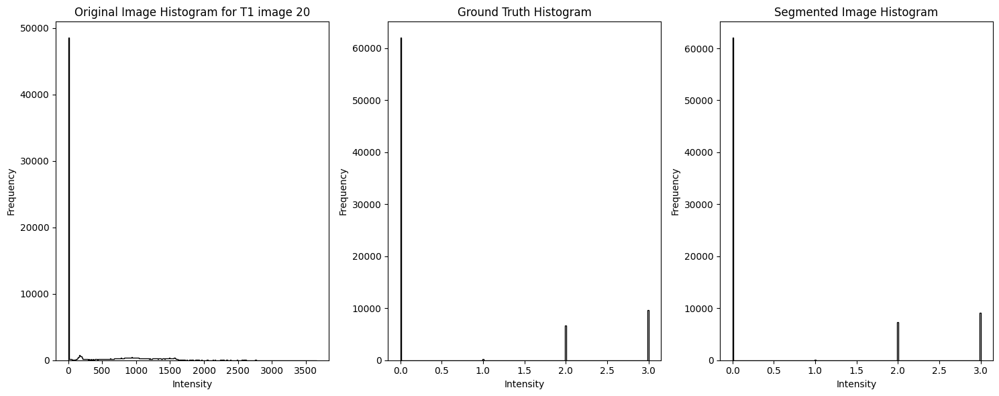

Registration Progress:  55%|█████▌    | 11/20 [05:27<04:09, 27.70s/it]

Fixed Image: 1104.nii.gz
Dice Score: CSF: 0.7747381063588443, GM: 0.8753424398211876, WM: 0.91209959234808, Avg: 0.8540600461760373


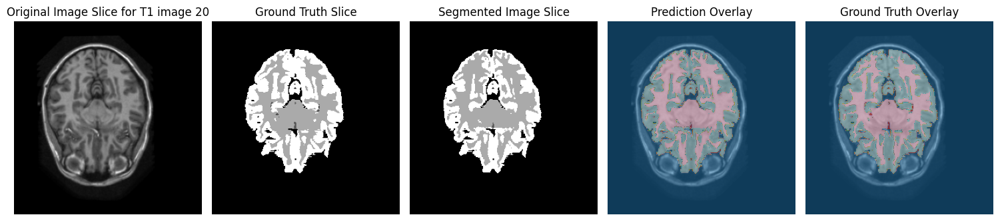

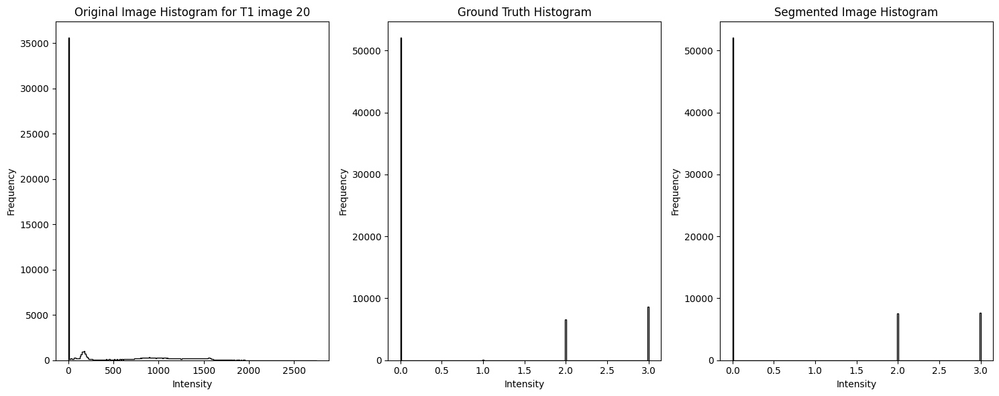

Registration Progress:  60%|██████    | 12/20 [05:46<03:20, 25.03s/it]

Fixed Image: 1107.nii.gz
Dice Score: CSF: 0.6976284584980237, GM: 0.893605371635325, WM: 0.9239538644429977, Avg: 0.8383958981921155


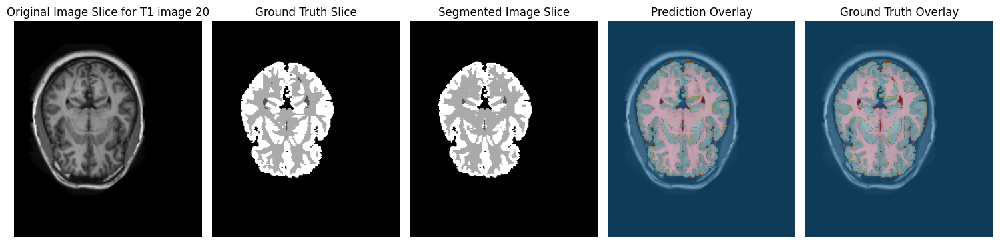

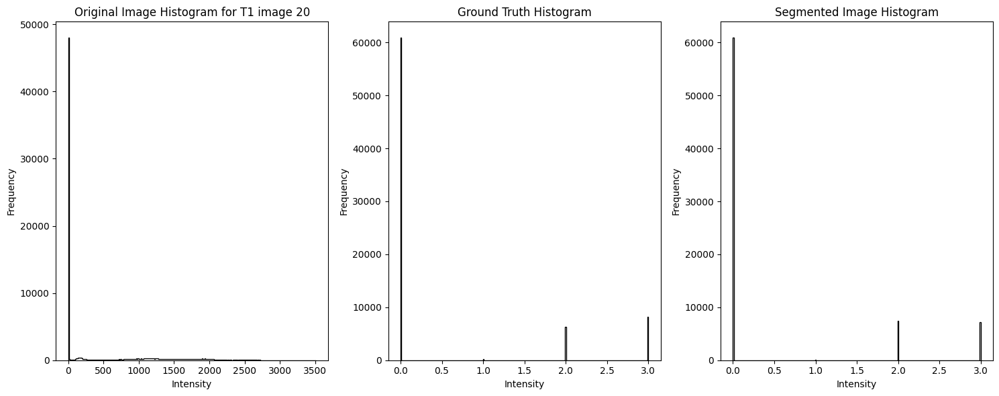

Registration Progress:  65%|██████▌   | 13/20 [06:12<02:56, 25.23s/it]

Fixed Image: 1110.nii.gz
Dice Score: CSF: 0.7882122235537641, GM: 0.9031556752957713, WM: 0.9456535153413365, Avg: 0.8790071380636238


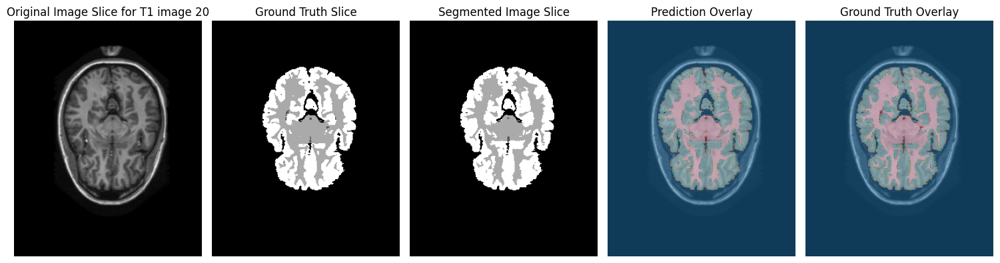

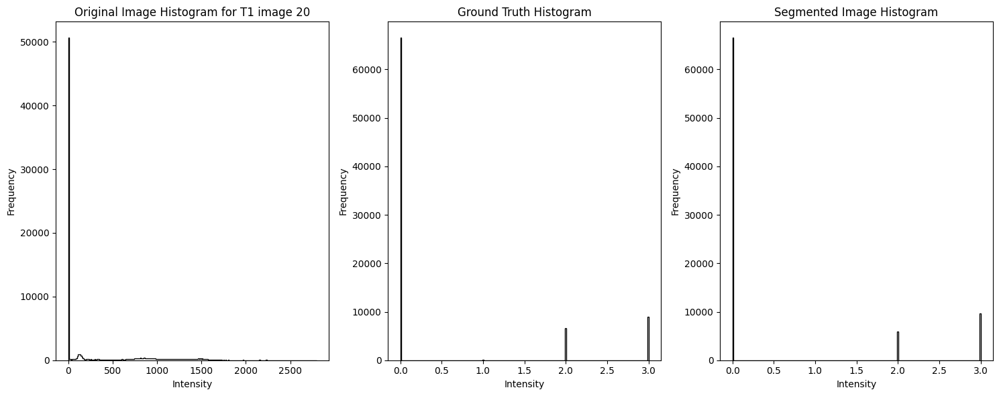

Registration Progress:  70%|███████   | 14/20 [06:46<02:46, 27.81s/it]

Fixed Image: 1113.nii.gz
Dice Score: CSF: 0.7699661313230635, GM: 0.9347809386221078, WM: 0.9549379531049547, Avg: 0.886561674350042


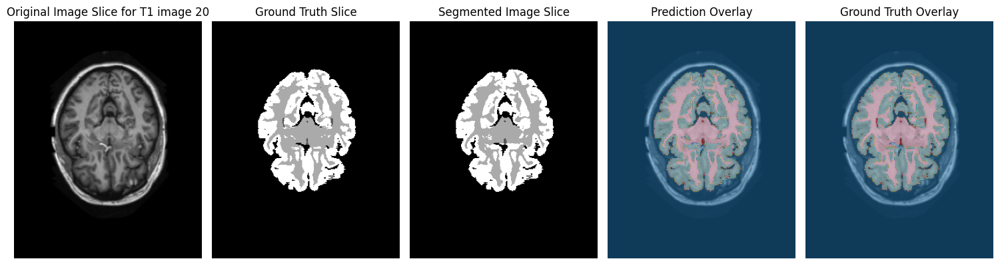

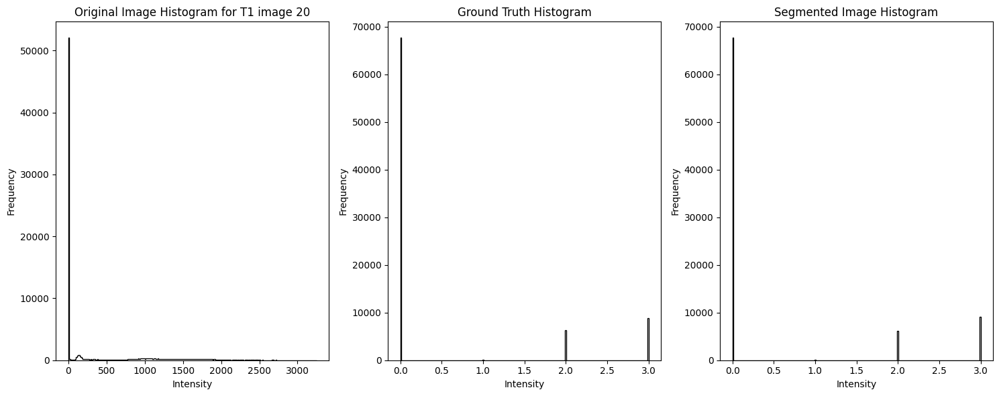

Registration Progress:  75%|███████▌  | 15/20 [07:17<02:24, 28.98s/it]

Fixed Image: 1116.nii.gz
Dice Score: CSF: 0.8627702079704949, GM: 0.898093546758061, WM: 0.937187786245125, Avg: 0.8993505136578935


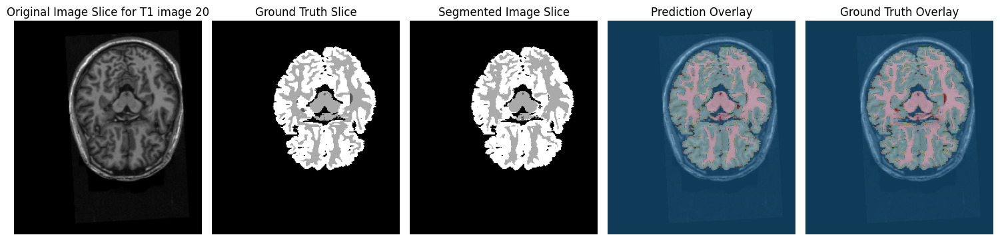

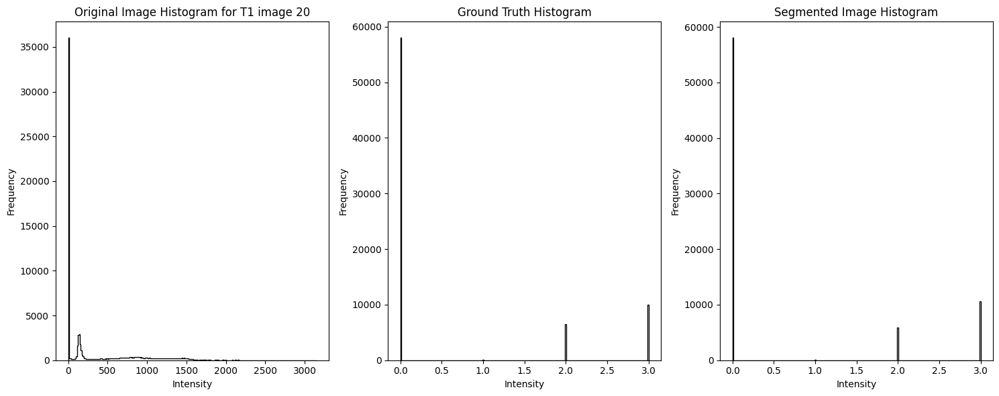

Registration Progress:  80%|████████  | 16/20 [07:40<01:48, 27.11s/it]

Fixed Image: 1119.nii.gz
Dice Score: CSF: 0.8902588413389239, GM: 0.8965059624641497, WM: 0.9240636734241935, Avg: 0.903609492409089


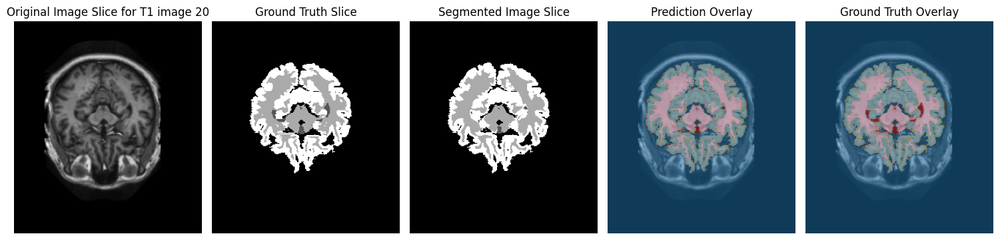

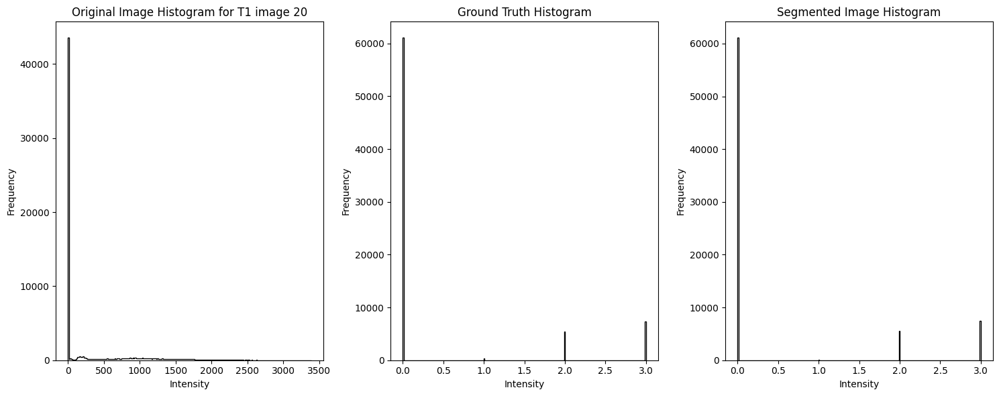

Registration Progress:  85%|████████▌ | 17/20 [08:10<01:24, 28.04s/it]

Fixed Image: 1122.nii.gz
Dice Score: CSF: 0.8367543296985247, GM: 0.8401312512627586, WM: 0.8631657797351573, Avg: 0.8466837868988136


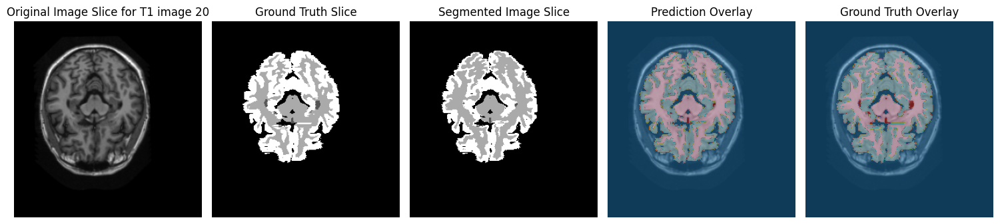

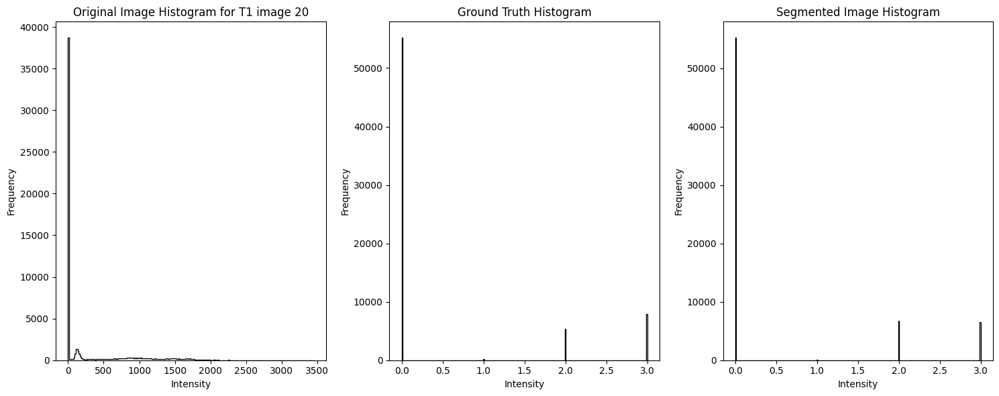

Registration Progress:  90%|█████████ | 18/20 [08:33<00:52, 26.35s/it]

Fixed Image: 1125.nii.gz
Dice Score: CSF: 0.9175757396098891, GM: 0.8989235083887155, WM: 0.9194956088637841, Avg: 0.9119982856207963


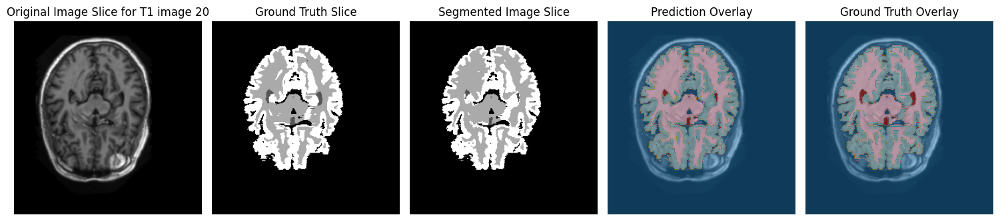

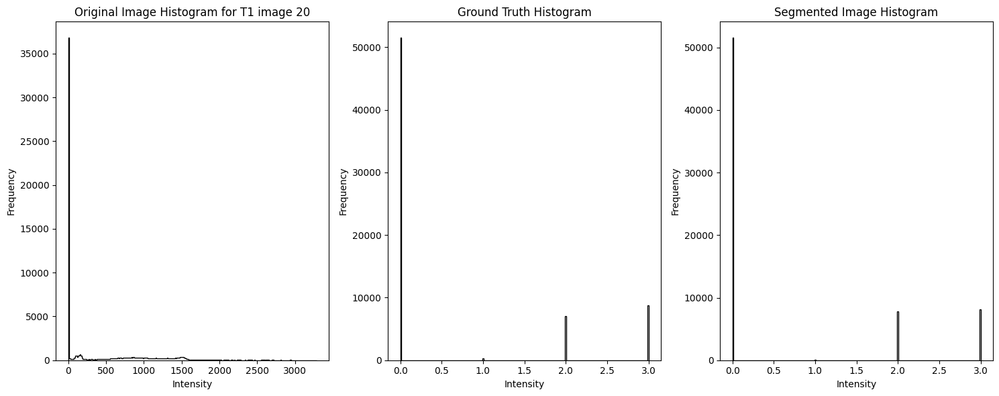

Registration Progress:  95%|█████████▌| 19/20 [09:03<00:27, 27.67s/it]

Fixed Image: 1128.nii.gz
Dice Score: CSF: 0.8326077313575054, GM: 0.8820604104385817, WM: 0.9150917960723269, Avg: 0.876586645956138


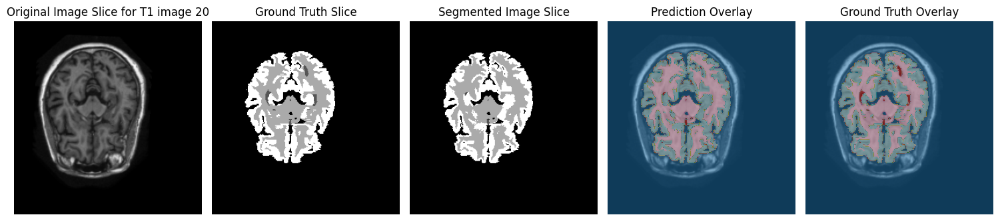

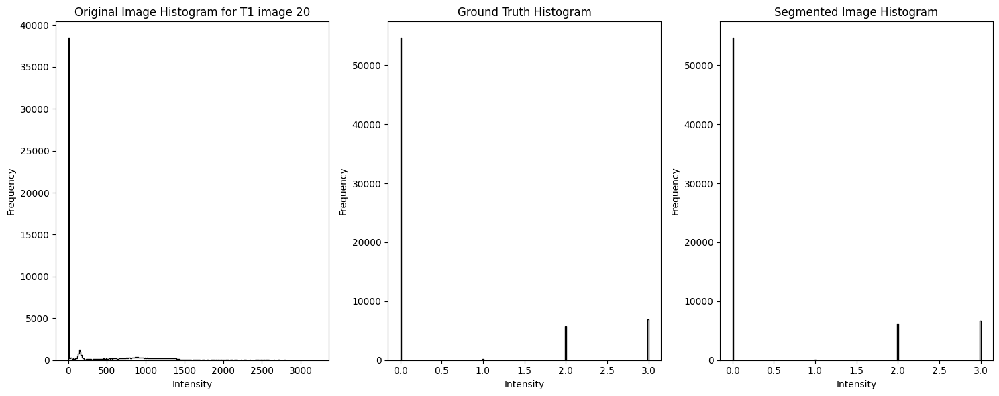

Registration Progress: 100%|██████████| 20/20 [09:34<00:00, 28.71s/it]

Average Dice Score for Tissue Model: CSF: 0.8105146495060627, GM: 0.9043159184795753, WM: 0.9343889724331443, Avg: 0.883073180139594


In [10]:
combine_tissue_models_and_label_propagation(
    test_image_files,
    mean_volume,
    probability_atlases,
    label_histograms_posterior,
    'testing-images/',
    'testing-labels/'
)

In [ ]:
csf_values_tissue_models_and_label_propagation = [
    0.7347140039447732, 0.8586945313305606, 0.889726820687433, 0.7875865942707359,
    0.7686421907510571, 0.7696726706959488, 0.8320885414651136, 0.8642086569300501,
    0.7553514242373167, 0.7302319780493889, 0.8521518053021139, 0.77671004337671,
    0.7022953066118534, 0.7868182189876523, 0.7744852380433599, 0.8627666790380998,
    0.8902835056681211, 0.804330525399042, 0.9179624266726071, 0.8254173290937997
]

gm_values_tissue_models_and_label_propagation = [
    0.9290504994698592, 0.9208494191505633, 0.8915907529270015, 0.918356375718178,
    0.920388864586145, 0.9297278509610372, 0.9155653252778078, 0.8873188788570778,
    0.9180536790773347, 0.9134709130483583, 0.9254787842072429, 0.8714201963813897,
    0.8949625093824424, 0.903161789083633, 0.9344119412749035, 0.8974288269195164,
    0.8970298194283122, 0.8458456913191377, 0.8988608134471706, 0.8822080692525661
]

wm_values_tissue_models_and_label_propagation = [
    0.953387453017135, 0.9487898123303445, 0.9290579622590069, 0.9430420147912444,
    0.9529246342677331, 0.9525520005025641, 0.94395695437005, 0.9357495615063167,
    0.9426248023492206, 0.9436614038128862, 0.9510605358732696, 0.9084210708595969,
    0.924864322738478, 0.9456715952599771, 0.9546608214893285, 0.9369580908837785,
    0.9244949606272149, 0.8724312232848088, 0.9191126791260285, 0.9152160355181843
]


# With EM

## 3.1 k-Means initialization

In [13]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    response = EM(data=image, data_label=gt_label, init='kmeans', comb_mode='no', atlas_weights=None, freq=0, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for KMEANS initialization: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.5575687426621889
Dice Score: CSF: 0.00014391232860941114, GM: 0.7616943126296404, WM: 0.9108680030283169, Avg: 0.5575687426621889
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.5602392314789874
Dice Score: CSF: 1.4951426552985986e-05, GM: 0.7404823496722805, WM: 0.9402203933381286, Avg: 0.5602392314789874
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Converged at iteration 48 with log-likelihood -0.2364
Best combination has average dice score of: 0.9002177827500578
Dice Score: CSF: 0.880780291329243, GM: 0.8853325743075757, WM: 0.934540482613355, Avg: 0.9002177827500578
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.5745275375269423
Dice Score: CSF: 5.1973431181979775e-05, GM: 0.789834511824184, WM: 0.933696127325460

In [ ]:
csf_values_EM_with_kmeans = [
    0.00014391232860941114, 1.4951426552985986e-05, 0.880780291329243, 5.1973431181979775e-05,
    0.0012575571673803026, 0.000406269851822305, 3.654623464144489e-05, 0.8512667556834932,
    0.0005291031212185049, 0.002222831308789822, 0.7662504666694321, 0.00011124486982363716,
    0.00749372380429044, 0.007699106489345541, 0.001385069273479126, 0.28966647054073075,
    0.2586545123062899, 0.2743331295178576, 0.8145237625043412, 0.20834135244880123
]

gm_values_EM_with_kmeans = [
    0.7616943126296404, 0.7404823496722805, 0.8853325743075757, 0.789834511824184,
    0.8179459232169434, 0.7993270813600091, 0.7563099741994133, 0.8680268747120691,
    0.8118604691926322, 0.7775566254878632, 0.8787864399862205, 0.7952684956193324,
    0.8055251790301516, 0.8325430648806644, 0.7232647289745722, 0.8649595561844771,
    0.7782583454672559, 0.8669581702119988, 0.8416422421688954, 0.7676972681146742
]

wm_values_EM_with_kmeans = [
    0.9108680030283169, 0.9402203933381286, 0.934540482613355, 0.9336961273254609,
    0.800248283353377, 0.8983738365144327, 0.9331577764495435, 0.9297454723207705,
    0.9172187688991756, 0.8490639126023439, 0.9304932241991125, 0.9158577035520469,
    0.7746867358467547, 0.8590944470373355, 0.9366234948296258, 0.8109469668636398,
    0.6320500518546519, 0.7556361441645811, 0.9013695934202527, 0.653803282612924
]


## 3.2  Tissue models initialization

In [14]:
def load_and_process_images(image_directory, label_directory):
    """Load and process multiple images efficiently."""
    tissue_data = {i: [] for i in range(1, 4)}  # Initialize dict for 3 tissue types
    
    # Get all image files
    image_files = [f for f in os.listdir(image_directory) if f.endswith('.nii.gz')]
    
    # Process each image and its corresponding label
    for image_file in tqdm(image_files, total=len(image_files)):
        image_name = os.path.splitext(os.path.splitext(image_file)[0])[0]
        image_filepath = os.path.join(image_directory, image_file)
        label_filepath = os.path.join(label_directory, f'{image_name}_3C.nii.gz')
        
        # Load and normalize image
        img = sitk.GetArrayFromImage(sitk.ReadImage(image_filepath))
        lab = sitk.GetArrayFromImage(sitk.ReadImage(label_filepath))
        
        # Process each tissue type
        for tissue_type in range(1, 4):
            tissue_data[tissue_type].extend(img[lab == tissue_type].flatten())
    
    return tissue_data

def calculate_probabilities(tissue_data):
    """Calculate probability distributions for each tissue type."""
    # Find unique intensity values across all tissues
    all_values = sorted(set().union(*[set(data) for data in tissue_data.values()]))
    
    # Calculate probabilities using numpy for better performance
    probabilities = {}
    total_counts = np.zeros(len(all_values))
    tissue_counts = {}
    
    for tissue_type, data in tissue_data.items():
        # Use numpy histogram for efficient counting
        counts, _ = np.histogram(data, bins=len(all_values), range=(min(all_values), max(all_values)))
        tissue_counts[tissue_type] = counts
        total_counts += counts
    
    # Calculate probabilities for each tissue type
    for tissue_type in tissue_data.keys():
        probabilities[tissue_type] = np.divide(
            tissue_counts[tissue_type], 
            total_counts,
            out=np.zeros_like(total_counts, dtype=float),
            where=total_counts > 0
        )
    
    return all_values, probabilities



def plot_tissue_model(all_values, probabilities):
    """Plot the tissue model distributions."""
    plt.figure(figsize=(10, 6))
    
    colors = {1: 'blue', 2: 'orange', 3: 'green'}
    labels = {1: 'CSF', 2: 'WM', 3: 'GM'}
    
    x = np.arange(len(all_values))
    for tissue_type, probs in probabilities.items():
        plt.plot(x, probs, label=labels[tissue_type], color=colors[tissue_type])
    
    plt.xlabel('Intensity values')
    plt.ylabel('Probability of Belonging to Each Class')
    plt.title('Tissue Model')
    plt.xticks(np.arange(0, len(all_values), 200))
    plt.legend()
    plt.show()
    
def tissue_prob(img, lab, probabilities, all_values):
    """
    Calculate tissue model probabilities for an image using pre-computed probability maps.
    
    Args:
        img (np.ndarray): Input image
        lab (np.ndarray): Label mask
        probabilities (dict): Pre-computed probability distributions for each tissue class
        all_values (np.ndarray): Array of intensity values used for probability lookup
        
    Returns:
        np.ndarray: Tissue model probabilities for each valid voxel
    """
    # Create mask for valid voxels (non-zero and labeled)
    mask = (lab > 0) & (img != 0)
    
    # Convert probabilities dict to array once
    prob_array = np.stack(list(probabilities.values()))
    
    # Get indices for probability lookup, clipped to valid range
    value_indices = np.clip(
        np.searchsorted(all_values, img[mask], side='left'),
        0, 
        prob_array.shape[1] - 1
    )
    
    # Directly index probability array for masked voxels
    return prob_array[:, value_indices]


In [15]:
# Process images and calculate probabilities
tissue_data = load_and_process_images(train_image_directory, train_label_directory)
all_values, probabilities = calculate_probabilities(tissue_data)

100%|██████████| 15/15 [00:07<00:00,  2.01it/s]


In [16]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]

csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='no', atlas_weights=None, freq=0, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Tissue Model initialization: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')
    # save the segmented image
    # segmentation = sitk.GetImageFromArray(segmentation)
    # segmentation.CopyInformation(sitk.ReadImage(os.path.join(test_image_directory, f'{patient_ID}.nii.gz')))
    # sitk.WriteImage(segmentation, f'./tm-em-segmentations/{patient_ID}_segmented.nii.gz')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.5017667028263143
Dice Score: CSF: 0.03173205339802994, GM: 0.8236772741183743, WM: 0.6498907809625387, Avg: 0.5017667028263143
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Converged at iteration 144 with log-likelihood -0.2925
Best combination has average dice score of: 0.7452512348222462
Dice Score: CSF: 0.4064165794848802, GM: 0.8958235574515216, WM: 0.9335135675303367, Avg: 0.7452512348222462
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Converged at iteration 113 with log-likelihood -0.2144
Best combination has average dice score of: 0.845838276176769
Dice Score: CSF: 0.7487176440298655, GM: 0.8674991018943736, WM: 0.9212980826060678, Avg: 0.845838276176769
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.5365819873749637
Dice Score: CSF: 0.02104097951249364

In [ ]:
csf_values_EM_with_tissue_models = [
    0.03173205339802994, 0.4064165794848802, 0.7487176440298655, 0.021040979512493643,
    0.0, 0.0008816074642765309, 0.01668101539211832, 0.7315214782817374,
    0.023597509868114708, 0.0, 0.549031904052677, 0.4267800771659067,
    0.0, 0.0, 0.3089128454296994, 0.6147124017286195,
    0.6725014387109151, 0.6422005762107285, 0.7586695097421376, 0.579634571120119
]

gm_values_EM_with_tissue_models = [
    0.8236772741183743, 0.8958235574515216, 0.8674991018943736, 0.8458593066968338,
    0.8710231831812963, 0.8180271584988188, 0.836733204431191, 0.8620257122961692,
    0.8534290553874064, 0.8609414467310949, 0.8671266911534935, 0.8808224558760992,
    0.8596417899105153, 0.8410352149247649, 0.835445887626733, 0.8659285236165766,
    0.9035091118657429, 0.8722479458582497, 0.8352841238501286, 0.7552759186191343
]

wm_values_EM_with_tissue_models = [
    0.6498907809625387, 0.9335135675303367, 0.9212980826060678, 0.7428456759155636,
    0.9319634868657356, 0.8491257978248198, 0.6706801569783181, 0.9222214797212592,
    0.8171386671830905, 0.9242840703642565, 0.9223729287858488, 0.9323168990094498,
    0.9181803735153696, 0.9133287898437836, 0.902883278951146, 0.9178475541549429,
    0.9189753851343033, 0.9163151352873612, 0.8991396843619562, 0.8767138167782179
]


## 3.3 Label propagation initialization

In [17]:
# save all registered probability atlases for test images
# save_probability_atlases(
#     test_image_directory=test_image_directory,
#     test_label_directory=test_label_directory,
#     mean_volume=mean_volume,
#     probability_atlases=probability_atlases,
#     topological_atlas=topological_atlas,
#     class_labels=class_labels
# )

In [18]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)

    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='no', atlas_weights=None, freq=0, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for Label Propagation Initialization: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')
    
    # save the segmented image
    # segmentation = sitk.GetImageFromArray(segmentation)
    # segmentation.CopyInformation(sitk.ReadImage(os.path.join(test_image_directory, f'{patient_ID}.nii.gz')))
    # sitk.WriteImage(segmentation, f'./lp-em-segmentations/{patient_ID}_segmented.nii.gz')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.5740162057666147
Dice Score: CSF: 3.620581193796134e-05, GM: 0.7904249391368084, WM: 0.9315874723510978, Avg: 0.5740162057666147
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Converged at iteration 142 with log-likelihood -0.2925
Best combination has average dice score of: 0.7452512348222462
Dice Score: CSF: 0.4064165794848802, GM: 0.8958235574515216, WM: 0.9335135675303367, Avg: 0.7452512348222462
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Converged at iteration 112 with log-likelihood -0.2144
Best combination has average dice score of: 0.845838276176769
Dice Score: CSF: 0.7487176440298655, GM: 0.8674991018943736, WM: 0.9212980826060678, Avg: 0.845838276176769
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.6346814724937119
Dice Score: CSF: 0.078604615736156

In [ ]:
csf_values_EM_with_label_propagation = [
    3.620581193796134e-05, 0.4064165794848802, 0.7487176440298655, 0.0786046157361566,
    0.0334639618871984, 0.025894025025296773, 0.367291924070538, 0.7315214782817374,
    0.2699055330634278, 0.03061050960829885, 0.549031904052677, 0.4267800771659067,
    0.0, 0.36535678503840585, 0.0, 0.6147124017286195,
    0.6840811090125085, 0.6441084302275801, 0.7586695097421376, 0.3553210094722102
]

gm_values_EM_with_label_propagation = [
    0.7904249391368084, 0.8958235574515216, 0.8674991018943736, 0.8933464933362197,
    0.8553571904393935, 0.8438700639416342, 0.9010784869239165, 0.8620257122961692,
    0.8988724169242706, 0.8332193182868689, 0.8671266911534935, 0.8808224558760992,
    0.8384611858763787, 0.9112250800699984, 0.7948686142199409, 0.8659285236165766,
    0.8129794141316384, 0.874934645231675, 0.8352841238501286, 0.6768053025101504
]

wm_values_EM_with_label_propagation = [
    0.9315874723510978, 0.9335135675303367, 0.9212980826060678, 0.9320933084087594,
    0.8607292826574008, 0.7766335940601408, 0.9413560882602178, 0.9222214797212592,
    0.9337742097102276, 0.8325728585558039, 0.9223729287858488, 0.9323168990094498,
    0.9103348519626651, 0.9430045643474174, 0.8854880820730513, 0.9178475541549429,
    0.8899626602707617, 0.9174095468849262, 0.8991396843619562, 0.7810747295038012
]


# Combine EM with atlas

In [19]:
def process_mni_atlas(mniatlas_directory: str, output_directory: str) -> tuple:
    """
    Process MNI atlas by loading, splitting, and saving probability atlases.
    
    Args:
        mniatlas_directory (str): Directory containing MNI atlas files
        output_directory (str): Directory to save processed atlas files
        
    Returns:
        tuple: (mni_mean_volume, mni_probability_atlases, mni_topological_atlas)
    """
    # Load MNI template
    mni_mean_volume = itk.imread(f'./{mniatlas_directory}template.nii.gz', itk.F)
    
    # Define class labels
    num_classes = 4
    class_labels = {0: 'background', 1: 'csf', 2: 'wm', 3: 'gm'}
    
    # Load MNI atlas and get metadata
    atlas_path = f'./{mniatlas_directory}atlas.nii.gz'
    mni_template = nib.load(atlas_path)
    affine = mni_template.affine
    header = mni_template.header
    template_data = mni_template.get_fdata()
    
    # Split atlas into tissue types
    mni_bg, mni_csf, mni_gm, mni_wm = np.split(template_data, 4, axis=3)
    tissue_volumes = [
        mni_bg[:, :, :, 0],
        mni_csf[:, :, :, 0],
        mni_gm[:, :, :, 0],
        mni_wm[:, :, :, 0]
    ]
    
    # Create probability atlases
    mni_probability_atlases = tissue_volumes
    mni_topological_atlas = np.argmax(mni_probability_atlases, axis=0)
    
    # # Create output directory
    # Path(output_directory).mkdir(parents=True, exist_ok=True)
    
    # # Save probability atlases
    # for c, atlas in enumerate(mni_probability_atlases):
    #     nifti_image = nib.Nifti1Image(atlas, affine, header=header)
    #     output_path = f'./{output_directory}/probability_atlas_{class_labels[c]}.nii.gz'
    #     nib.save(nifti_image, output_path)
    
    # # Save topological atlas
    # topological_atlas = nib.Nifti1Image(mni_topological_atlas, affine, header=header)
    # nib.save(topological_atlas, f'./{output_directory}/topological_atlas.nii.gz')
    
    return mni_mean_volume, mni_probability_atlases, mni_topological_atlas

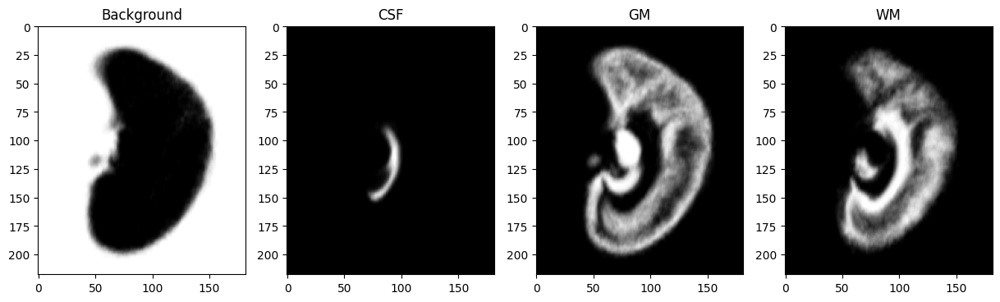

In [20]:
mni_mean_volume, mni_probability_atlases, mni_topological_atlas = process_mni_atlas(
    mniatlas_directory="MNITemplateAtlas/",
    output_directory="mni_splited_atlases"
)

idx = 100
plt.figure(figsize=(15, 8))
plt.subplot(1, 4, 1)
plt.imshow(mni_probability_atlases[0][idx], cmap='gray')
plt.title('Background')

plt.subplot(1, 4, 2)
plt.imshow(mni_probability_atlases[1][idx], cmap='gray')
plt.title('CSF')

plt.subplot(1, 4, 3)
plt.imshow(mni_probability_atlases[2][idx], cmap='gray')
plt.title('GM')

plt.subplot(1, 4, 4)
plt.imshow(mni_probability_atlases[3][idx], cmap='gray')
plt.title('WM')

plt.show()

In [21]:
# register the MNI atlas to my test images
mni_splitted_directory = "mni_splited_atlases/"
mni_mean_volume = itk.imread('./MNITemplateAtlas/template.nii.gz', itk.F)
mni_probability_atlases = [itk.imread(f'./{mni_splitted_directory}probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
mni_topological_atlas = itk.imread(f'./{mni_splitted_directory}topological_atlas.nii.gz', itk.F)

# save_probability_atlases(
#     test_image_directory=test_image_directory,
#     test_label_directory=test_label_directory,
#     mean_volume=mni_mean_volume,
#     probability_atlases=mni_probability_atlases,
#     topological_atlas=mni_topological_atlas,
#     class_labels=class_labels,
#     output_dir="mni_probability_atlases"
# )

## 4.1 A posteriori

### with my atlas

In [22]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]

csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)
    
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='end', atlas_weights=seg, freq=0, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Aposteriori my atlas: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6449416651866595
Dice Score: CSF: 0.09149272612270715, GM: 0.891730517731713, WM: 0.9516017517055584, Avg: 0.6449416651866595
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Converged at iteration 142 with log-likelihood -0.2925
Best combination has average dice score of: 0.8274994736770976
Dice Score: CSF: 0.6056887408511198, GM: 0.9273220569731587, WM: 0.9494876232070144, Avg: 0.8274994736770976
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Converged at iteration 112 with log-likelihood -0.2144
Best combination has average dice score of: 0.8583973965783489
Dice Score: CSF: 0.7742290642534986, GM: 0.878899443774293, WM: 0.9220636817072551, Avg: 0.8583973965783489
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.8223540729260961
Dice Score: CSF: 0.6016935082184958,

In [ ]:
csf_values_a_posteriori_our_atlas_with_label_propagation_only = [
    0.09149272612270715, 0.6056887408511198, 0.7742290642534986, 0.6016935082184958,
    0.7619585687382298, 0.6948556821812759, 0.6111111111111112, 0.7566886200629287,
    0.5060732877411452, 0.7014647137150466, 0.6595119582372223, 0.6025685795212044,
    0.7510015782445065, 0.5141908826119352, 0.6184939428988859, 0.697059923692676,
    0.7536447418824219, 0.6854972467325682, 0.8149932977524856, 0.7819093262821573
]

gm_values_a_posteriori_our_atlas_with_label_propagation_only = [
    0.891730517731713, 0.9273220569731587, 0.878899443774293, 0.9193636785880167,
    0.8905532526284111, 0.8854790870918513, 0.9313317377012406, 0.8763082646677287,
    0.9226796806719731, 0.8588565200770266, 0.9050987157749372, 0.9112610371844297,
    0.8759452490958487, 0.9253087994924033, 0.8606655091952625, 0.885993805011194,
    0.8629560870251053, 0.8952189944951062, 0.8841367034609423, 0.8383315344363532
]

wm_values_a_posteriori_our_atlas_with_label_propagation_only = [
    0.9516017517055584, 0.9494876232070144, 0.9220636817072551, 0.9460050319717757,
    0.939141929098554, 0.9322157361044713, 0.9561573347653529, 0.9248536816759535,
    0.9462049324286983, 0.9186140961589316, 0.9408503262477319, 0.9463539243632796,
    0.9317318231640482, 0.9495907341960687, 0.9155776716239901, 0.9262085754825724,
    0.910466188677, 0.9264803422236015, 0.9226021849792753, 0.9074413865029013
]


### with mni atlas

In [23]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    try: 
        print(f"Processing image name: {image_path} with ground truth: {gt_path}")
        image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
        gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
        gt_label = gt.astype(bool)
        
        tissue_probs = tissue_prob(image, gt, probabilities, all_values)
        prob_atlases = [itk.imread(f'./mni_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
        prob_atlas = {}
        probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
        probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
        seg = np.stack(probabilitic_atlas, axis=0)
        
        response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='end', atlas_weights=seg, freq=0, max_iter=200)
        label_em = np.zeros_like(image)
        label_em[gt_label] = response + 1
        relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
        csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
        csf_list.append(csf)
        gm_list.append(gm)
        wm_list.append(wm)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue
print(f'Average Dice Score for EM Aposteriori mni atlas: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.5877543553112329
Dice Score: CSF: 0.0018996289097013607, GM: 0.8217552222609774, WM: 0.9396082147630198, Avg: 0.5877543553112329
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.6117672735747081
Dice Score: CSF: 0.14844505088407528, GM: 0.8133450804800239, WM: 0.8735116893600251, Avg: 0.6117672735747081
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Converged at iteration 105 with log-likelihood -0.2144
Best combination has average dice score of: 0.8446759418338091
Dice Score: CSF: 0.7577432105563312, GM: 0.8576932326878592, WM: 0.9185913822572367, Avg: 0.8446759418338091
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.6865705750612355
Dice Score: CSF: 0.3178920795203534, GM: 0.8377396195306223, WM: 0.9040800261327308, A

In [ ]:
csf_values_a_posteriori_MNI_atlas_with_label_propagation_only = [
    0.0018996289097013607, 0.14844505088407528, 0.7577432105563312, 0.3178920795203534,
    0.458703685209228, 0.2643681252185138, 0.15954939790236955, 0.7419249268607131,
    0.3027052103569254, 0.5711037618850765, 0.4805503652114829, 0.6280058501411516,
    0.27181654535493466, 0.3928174617397226, 0.7722850678733032, 0.7001940149332706,
    0.8383885293007866, 0.7614689177892116, 0.5946297098310958
]

gm_values_a_posteriori_MNI_atlas_with_label_propagation_only = [
    0.8217552222609774, 0.8133450804800239, 0.8576932326878592, 0.8377396195306223,
    0.8380926716805078, 0.8325251038608995, 0.8309369534455412, 0.853491911790733,
    0.8421066462740028, 0.8606499259300784, 0.8774311212114879, 0.8041436910227718,
    0.8240378651169085, 0.7861197801288262, 0.8396036064218441, 0.7904463171203412,
    0.8593326597647019, 0.8530020515883063, 0.822163120049747
]

wm_values_a_posteriori_MNI_atlas_with_label_propagation_only = [
    0.9396082147630198, 0.8735116893600251, 0.9185913822572367, 0.9040800261327308,
    0.9194105665501546, 0.8983163607218133, 0.887470697985935, 0.9203451534708982,
    0.9031992929318359, 0.9207519828722385, 0.932555710325419, 0.9010505182145593,
    0.910076252559089, 0.8862361994136848, 0.9125902640501297, 0.8836505741998794,
    0.9193000331059471, 0.906566489320541, 0.8777394184580652
]


## 4.2 Into EM

### with my atlas

In [24]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)
    
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='into', atlas_weights=seg, freq=5, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Into EM my atlas freq=5: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6144365922885956
Dice Score: CSF: 0.030611175175594925, GM: 0.8939323573563447, WM: 0.918766244333847, Avg: 0.6144365922885956
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.795448803204818
Dice Score: CSF: 0.5580127500549571, GM: 0.9039481009900511, WM: 0.924385558569446, Avg: 0.795448803204818
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8642303027210853
Dice Score: CSF: 0.8469581489993732, GM: 0.8565268099357264, WM: 0.8892059492281562, Avg: 0.8642303027210853
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.7335052013370803
Dice Score: CSF: 0.3865992414664981, GM: 0.8955052232089632, WM: 0.9184111393357794, Avg: 0.7335052013370803
Processing image name: 1019.nii.gz wit

In [ ]:
csf_values_intoEM_our_atlas_with_label_propagation_only_freq_5 = [
    0.030611175175594925, 0.5580127500549571, 0.8469581489993732, 0.3865992414664981,
    0.0, 0.21601634718303006, 0.4771752055006979, 0.8284263401041285,
    0.3952231708635037, 0.006229191279132209, 0.6940952734356881, 0.5223874482815124,
    0.0, 0.4870360262008734, 0.2546825303333726, 0.004516753468221413,
    0.7375058224741823, 0.6121138767563017, 0.858757858311608, 0.009782328880752839
]

gm_values_intoEM_our_atlas_with_label_propagation_only_freq_5 = [
    0.8939323573563447, 0.9039481009900511, 0.8565268099357264, 0.8955052232089632,
    0.8637638594693389, 0.9027878955405381, 0.8851229156827543, 0.8505375692949667,
    0.8951915672186198, 0.882758908540721, 0.90200854022213, 0.8662135753365554,
    0.9026472174683966, 0.8545393107241324, 0.9045218334063369, 0.8817284433805047,
    0.8697683828702121, 0.8590677824795743, 0.8889133276892345, 0.7931646417890074
]

wm_values_intoEM_our_atlas_with_label_propagation_only_freq_5 = [
    0.918766244333847, 0.924385558569446, 0.8892059492281562, 0.9184111393357794,
    0.9011951004979046, 0.9263643297407578, 0.9169923422454185, 0.8895299098158321,
    0.9170627559573635, 0.9115410938685548, 0.9279097392011854, 0.9029565672262925,
    0.9258260593448847, 0.889657983620119, 0.9179273577311972, 0.8924899673257501,
    0.8882371515351999, 0.8770170509404893, 0.9100576478036414, 0.8245057418694308
]


In [25]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)
    
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='into', atlas_weights=seg, freq=3, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Into EM my atlas freq=3: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6003606152235794
Dice Score: CSF: 0.00021292451825827744, GM: 0.8878164738228892, WM: 0.9130524473295909, Avg: 0.6003606152235794
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.7454509094619636
Dice Score: CSF: 0.4126779425623729, GM: 0.902210232351571, WM: 0.9214645534719468, Avg: 0.7454509094619636
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8676781890858685
Dice Score: CSF: 0.8387244486775588, GM: 0.8664096915278837, WM: 0.8979004270521631, Avg: 0.8676781890858685
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.6724741820708791
Dice Score: CSF: 0.21550628442310407, GM: 0.8898792562763836, WM: 0.9120370055131496, Avg: 0.6724741820708791
Processing image name: 1019.nii.

In [ ]:
csf_values_intoEM_our_atlas_with_label_propagation_only_freq_3 = [
    0.00021292451825827744, 0.4126779425623729, 0.8387244486775588, 0.21550628442310407,
    0.0, 0.027155172413793102, 0.28065799631807115, 0.8063814222205549,
    0.24094657583363213, 0.0, 0.6232831109905556, 0.4161773146717294,
    0.0, 0.3679940729764771, 0.060189842963999825, 0.016083579627465806,
    0.700069197659008, 0.5169386606640405, 0.8521974285578733, 0.5877683272579992
]

gm_values_intoEM_our_atlas_with_label_propagation_only_freq_3 = [
    0.8878164738228892, 0.902210232351571, 0.8664096915278837, 0.8898792562763836,
    0.8653788526150715, 0.8972162151124635, 0.8824338302802073, 0.8600392930231174,
    0.8896307410362275, 0.8864061231297955, 0.9024484709242431, 0.8654724353843981,
    0.9004825104428219, 0.8522549568996037, 0.8966984642193395, 0.8791186298895173,
    0.8721183428048267, 0.851751883386083, 0.8858925579808875, 0.807046932519272
]

wm_values_intoEM_our_atlas_with_label_propagation_only_freq_3 = [
    0.9130524473295909, 0.9214645534719468, 0.8979004270521631, 0.9120370055131496,
    0.902654117396996, 0.9204997873346417, 0.9133519357048572, 0.8967205149932399,
    0.9105474497914017, 0.9147853440551174, 0.9270485615062081, 0.9013041456889637,
    0.9236794935703864, 0.8860725492178095, 0.9089767211078379, 0.8902018521626665,
    0.8887899696933197, 0.8666416853326522, 0.9065897829552949, 0.8526749767596167
]


In [26]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)
    
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='into', atlas_weights=seg, freq=10, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Into EM my atlas freq=10: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.671480370378176
Dice Score: CSF: 0.14914786720520146, GM: 0.9217438221208943, WM: 0.9435494218084319, Avg: 0.671480370378176
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.816397165164871
Dice Score: CSF: 0.581446311176041, GM: 0.9239688169221524, WM: 0.9437763673964201, Avg: 0.816397165164871
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8712535584134882
Dice Score: CSF: 0.7933160285528877, GM: 0.8977816628232621, WM: 0.9226629838643148, Avg: 0.8712535584134882
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.7683689188122803
Dice Score: CSF: 0.4412336085478388, GM: 0.9213279199649032, WM: 0.942545227924099, Avg: 0.7683689188122803
Processing image name: 1019.nii.gz with g

In [ ]:
csf_values_intoEM_our_atlas_with_label_propagation_only_freq_10 = [
    0.14914786720520146, 0.581446311176041, 0.7933160285528877, 0.4412336085478388,
    0.12891871081289188, 0.2982213620864436, 0.5075963376597243, 0.7693470843672456,
    0.4402449876982673, 0.16152112123885132, 0.6915457589285714, 0.5843512195121952,
    0.0, 0.5545445714470745, 0.4191612538830839, 0.7540771748444283,
    0.7720457097562586, 0.7621503238533107, 0.7893005845985617, 0.5655135513345544
]

gm_values_intoEM_our_atlas_with_label_propagation_only_freq_10 = [
    0.9217438221208943, 0.9239688169221524, 0.8977816628232621, 0.9213279199649032,
    0.8978676720369329, 0.9188346817822134, 0.9085241461480114, 0.8940897014300327,
    0.9169684609057207, 0.9136149873217203, 0.9151401751890008, 0.8922985839506795,
    0.9097758773223238, 0.8888967064080916, 0.92962775528565, 0.9142750864168264,
    0.8924432300009423, 0.8998651570061467, 0.9048671303582058, 0.8043661623690521
]

wm_values_intoEM_our_atlas_with_label_propagation_only_freq_10 = [
    0.9435494218084319, 0.9437763673964201, 0.9226629838643148, 0.942545227924099,
    0.930790748371956, 0.9427122869409348, 0.9381889831566351, 0.923004322652679,
    0.9383567441056005, 0.938892549788231, 0.9412395956389608, 0.9270085447804083,
    0.9355052919782599, 0.9204523759179006, 0.943145182128617, 0.9373313036165646,
    0.9124339286158402, 0.9220162757683003, 0.9250283332561713, 0.8487456104822854
]


### with mni atlas

In [27]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]

csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    try:
        print(f"Processing image name: {image_path} with ground truth: {gt_path}")
        image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
        gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
        gt_label = gt.astype(bool)
        
        tissue_probs = tissue_prob(image, gt, probabilities, all_values)
        prob_atlases = [itk.imread(f'./mni_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
        prob_atlas = {}
        probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
        probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
        seg = np.stack(probabilitic_atlas, axis=0)
        
        response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='into', atlas_weights=seg, freq=5, max_iter=200)
        label_em = np.zeros_like(image)
        label_em[gt_label] = response + 1
        relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
        csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
        csf_list.append(csf)
        gm_list.append(gm)
        wm_list.append(wm)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue
print(f'Average Dice Score for EM Into EM MNI atlas freq=5: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6255463793387627
Dice Score: CSF: 0.0, GM: 0.9277499771406722, WM: 0.9488891608756159, Avg: 0.6255463793387627
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.761401068693016
Dice Score: CSF: 0.4126779425623729, GM: 0.9262820209432824, WM: 0.945243242573393, Avg: 0.761401068693016
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8993586101314822
Dice Score: CSF: 0.8538719688221709, GM: 0.90894802579288, WM: 0.935255835779396, Avg: 0.8993586101314822
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.6248347004094303
Dice Score: CSF: 0.007129842351263567, GM: 0.9237491052377609, WM: 0.9436251536392667, Avg: 0.6248347004094303
Processing image name: 1019.nii.gz with ground truth: 1

In [ ]:
csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5 = [
    0.0, 0.4126779425623729, 0.8538719688221709, 0.007129842351263567,
    0.0, 0.0, 0.0795265642662411, 0.8284263401041285,
    0.10612139251973599, 0.6350803497289113, 0.3754080522306855, 0.0,
    0.0020977745348412986, 0.0, 0.0, 0.0,
    0.0, 0.0, 0.808517324071777, 0.0
]

gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5 = [
    0.9277499771406722, 0.9262820209432824, 0.90894802579288, 0.9237491052377609,
    0.9169502951765207, 0.9192205755715296, 0.9120941895531464, 0.9039258110045143,
    0.918460300632966, 0.9147346544206532, 0.896122483134331, 0.9006753291815174,
    0.9186878599588473, 0.9283740626959958, 0.9152180936995153, 0.9049529134482573,
    0.8974056816690881, 0.8441099425678416, 0.6659426861383314
]

wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5 = [
    0.9488891608756159, 0.945243242573393, 0.935255835779396, 0.9436251536392667,
    0.9464149609666406, 0.9424037911297218, 0.9391715386160485, 0.9337830531585791,
    0.9387722592188447, 0.9394608167190436, 0.9285729391363194, 0.9336985878760439,
    0.9386919684148268, 0.9405801307082616, 0.924729211082471, 0.9054215230956514,
    0.9018077239112572, 0.8595561747157492, 0.5713718372487621
]


In [28]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    try:
        print(f"Processing image name: {image_path} with ground truth: {gt_path}")
        image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
        gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
        gt_label = gt.astype(bool)
        
        tissue_probs = tissue_prob(image, gt, probabilities, all_values)
        prob_atlases = [itk.imread(f'./mni_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
        prob_atlas = {}
        probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
        probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
        seg = np.stack(probabilitic_atlas, axis=0)
        
        response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='into', atlas_weights=seg, freq=3, max_iter=200)
        label_em = np.zeros_like(image)
        label_em[gt_label] = response + 1
        relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
        csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
        csf_list.append(csf)
        gm_list.append(gm)
        wm_list.append(wm)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue
print(f'Average Dice Score for EM Into EM MNI atlas freq=3: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.9384602613316924
Dice Score: CSF: 0.0, GM: 0.9278806403537692, WM: 0.9490398823096156, Avg: 0.6256401742211283
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.63420450640359
Dice Score: CSF: 0.03240424607362344, GM: 0.926538274303571, WM: 0.9436709988335755, Avg: 0.63420450640359
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8888000702853414
Dice Score: CSF: 0.804912380142648, GM: 0.9192101322685301, WM: 0.9422776984448459, Avg: 0.8888000702853414
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.9336700134934365
Dice Score: CSF: 0.0, GM: 0.9236991732207767, WM: 0.9436408537660963, Avg: 0.622446675662291
Processing image name: 1019.nii.gz with ground truth: 1019_3C.nii.gz
Bes

In [ ]:
csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3 = [
    0.0, 0.03240424607362344, 0.804912380142648, 0.0,
    0.0, 0.0, 0.0, 0.7061055853098699,
    0.0027372887155272703, 0.49708348028975285, 0.20141200201714574, 0.0,
    0.00018259837487446363, 0.0, 0.0, 0.025054583199112353,
    0.08909838046893885, 0.7910136894263878, 0.00011496895838123707
]

gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3 = [
    0.9278806403537692, 0.926538274303571, 0.9192101322685301, 0.9236991732207767,
    0.918032590591619, 0.9193125883327647, 0.9130028326867959, 0.9154414814145968,
    0.9184615455449556, 0.9149993263427847, 0.8982294800005424, 0.8961775248874492,
    0.9226200724992022, 0.9275632448740269, 0.9115829724860415, 0.8888377796394256,
    0.9013700161349896, 0.8418206304263605, 0.6591858301147469
]

wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3 = [
    0.9490398823096156, 0.9436709988335755, 0.9422776984448459, 0.9436408537660963,
    0.9487672730589886, 0.9425525844853074, 0.9397611617960905, 0.9385982650193113,
    0.938201617052501, 0.938673905845928, 0.9293690809345477, 0.9321394026938007,
    0.9421224165858926, 0.9403264626518045, 0.9247968352137416, 0.9013288830127316,
    0.9068806182262035, 0.8558539707634352, 0.5514429222916308
]


In [29]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    try:
        print(f"Processing image name: {image_path} with ground truth: {gt_path}")
        image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
        gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
        gt_label = gt.astype(bool)
        
        tissue_probs = tissue_prob(image, gt, probabilities, all_values)
        prob_atlases = [itk.imread(f'./mni_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
        prob_atlas = {}
        probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
        probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
        seg = np.stack(probabilitic_atlas, axis=0)
        
        response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=seg, comb_mode='into', atlas_weights=seg, freq=10, max_iter=200)
        label_em = np.zeros_like(image)
        label_em[gt_label] = response + 1
        relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
        csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
        csf_list.append(csf)
        gm_list.append(gm)
        wm_list.append(wm)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue
print(f'Average Dice Score for EM Into EM MNI atlas freq=10: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6243251248619816
Dice Score: CSF: 0.0, GM: 0.9239785522788204, WM: 0.9489968223071245, Avg: 0.6243251248619816
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.7933326810335327
Dice Score: CSF: 0.5117153468751433, GM: 0.9222535901043893, WM: 0.9460291061210656, Avg: 0.7933326810335327
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.883316165897476
Dice Score: CSF: 0.7889336999109101, GM: 0.9191264146601678, WM: 0.94188838312135, Avg: 0.883316165897476
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.7073483878127546
Dice Score: CSF: 0.26423877327491785, GM: 0.9153108002465713, WM: 0.9424955899167745, Avg: 0.7073483878127546
Processing image name: 1019.nii.gz with ground truth: 

In [ ]:
csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10 = [
    0.0, 0.5117153468751433, 0.7889336999109101, 0.26423877327491785,
    0.0, 0.0010900370612600828, 0.3961278257521588, 0.7844259236223411,
    0.30272753373528566, 0.6985820516373378, 0.5276033596999103, 0.0,
    0.39398682342663705, 0.0, 0.6237110952720362, 0.6089439587395433,
    0.7674907292954265, 0.8036742049880821, 0.0
]

gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10 = [
    0.9239785522788204, 0.9222535901043893, 0.9191264146601678, 0.9153108002465713,
    0.9165864027969289, 0.9152088400949435, 0.9155523404702788, 0.9153464672550793,
    0.9137653113631754, 0.9101536310448172, 0.9028907789690009, 0.8871093586360018,
    0.9239752047726503, 0.9018544389340195, 0.8970358200234947, 0.8871292383010461,
    0.9078595693580185, 0.8994140206747523, 0.6957624457523812
]

wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10 = [
    0.9489968223071245, 0.9460291061210656, 0.94188838312135, 0.9424955899167745,
    0.9486513110606604, 0.9430105275181329, 0.9456512188386513, 0.9423492730271775,
    0.9398724355415082, 0.941402699189183, 0.938087074661324, 0.928738390136474,
    0.9473205070595442, 0.9289114096944886, 0.9301709649936941, 0.9151370629304287,
    0.9335528278024272, 0.9171187539199971, 0.65016449291094
]


# Trials

## a posteriori

In [30]:
### with my atlas
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)
    
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='end', atlas_weights=seg, freq=0, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Aposteriori my atlas: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.613275426943942
Dice Score: CSF: 0.5419940769990128, GM: 0.64629865791202, WM: 0.6515335459207932, Avg: 0.613275426943942
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Converged at iteration 144 with log-likelihood -0.2925
Best combination has average dice score of: 0.8274994736770976
Dice Score: CSF: 0.6056887408511198, GM: 0.9273220569731587, WM: 0.9494876232070144, Avg: 0.8274994736770976
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Converged at iteration 113 with log-likelihood -0.2144
Best combination has average dice score of: 0.8583973965783489
Dice Score: CSF: 0.7742290642534986, GM: 0.878899443774293, WM: 0.9220636817072551, Avg: 0.8583973965783489
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.8496301985429316
Dice Score: CSF: 0.7525940195262905, GM:

In [ ]:
csf_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model = [
    0.5419940769990128, 0.6056887408511198, 0.7742290642534986, 0.7525940195262905,
    0.73475196530225, 0.09108039876714663, 0.7124124942255072, 0.7566886200629287,
    0.6712665487946872, 0.7071268814604365, 0.6595119582372223, 0.6025685795212044,
    0.5937658739321173, 0.5370857443450815, 0.4994592402325267, 0.697059923692676,
    0.8151537995986452, 0.6845590798187522, 0.8149932977524856, 0.657228161417702
]

gm_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model = [
    0.64629865791202, 0.9273220569731587, 0.878899443774293, 0.8742661527892598,
    0.9031973774048123, 0.8686270489591988, 0.879909511635986, 0.8763082646677287,
    0.8829552874479918, 0.8825862865673764, 0.9050987157749372, 0.9112610371844297,
    0.5560381904631714, 0.886900225789023, 0.5502010109184731, 0.8860236465972493,
    0.7990531664082101, 0.8937531817771363, 0.8841367034609423, 0.8639761459808835
]

wm_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model = [
    0.6515335459207932, 0.9494876232070144, 0.9220636817072551, 0.9220304233132445,
    0.9455240505521498, 0.7978098235895248, 0.9296746192119061, 0.9248536816759535,
    0.9263083665657773, 0.9320184082302936, 0.9408503262477319, 0.9463539243632796,
    0.5741576438524196, 0.9321293554646731, 0.46650889226990916, 0.9262223079046011,
    0.8596370391009567, 0.9258450146830274, 0.9226021849792753, 0.9145179112457672
]


In [31]:
### with mni atlas
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    try: 
        print(f"Processing image name: {image_path} with ground truth: {gt_path}")
        image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
        gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
        gt_label = gt.astype(bool)
        
        tissue_probs = tissue_prob(image, gt, probabilities, all_values)
        prob_atlases = [itk.imread(f'./mni_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
        prob_atlas = {}
        probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
        probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
        seg = np.stack(probabilitic_atlas, axis=0)
        
        response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='end', atlas_weights=seg, freq=0, max_iter=200)
        label_em = np.zeros_like(image)
        label_em[gt_label] = response + 1
        relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
        csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
        csf_list.append(csf)
        gm_list.append(gm)
        wm_list.append(wm)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue
print(f'Average Dice Score for EM Aposteriori MNI atlas: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6339533640933288
Dice Score: CSF: 0.2074734486555607, GM: 0.8124682534922688, WM: 0.8819183901321569, Avg: 0.6339533640933288
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Converged at iteration 144 with log-likelihood -0.2925
Best combination has average dice score of: 0.6582501195052503
Dice Score: CSF: 0.4363260890943062, GM: 0.7171256428147348, WM: 0.8212986266067099, Avg: 0.6582501195052503
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Converged at iteration 113 with log-likelihood -0.2144
Best combination has average dice score of: 0.7403423088533504
Dice Score: CSF: 0.7541908255433282, GM: 0.6557792932011253, WM: 0.8110568078155975, Avg: 0.7403423088533504
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.41008792738310723
Dice Score: CSF: 0.213275356244761

In [ ]:
csf_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model = [
    0.2074734486555607, 0.4363260890943062, 0.7541908255433282, 0.2132753562447611,
    0.45484894007678184, 0.05449251114078412, 0.12331313131313132, 0.7370475090597746,
    0.22506479954219544, 0.565165507938155, 0.4677239605657951, 0.3736881964730066,
    0.17981666393845147, 0.3589516099219992, 0.6222306983249102, 0.7511675194958998,
    0.6546481172829007, 0.7593636434262432, 0.5722723543888433
]

gm_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model = [
    0.8124682534922688, 0.7171256428147348, 0.6557792932011253, 0.44803802510295737,
    0.5255578917973274, 0.5892665254367382, 0.47709362733209204, 0.6247230478249122,
    0.4522802059290625, 0.640674260516305, 0.6122819327327478, 0.8313607764231125,
    0.4345596803117548, 0.8224839024229197, 0.6016529596089686, 0.5869700118164808,
    0.5566364554085139, 0.5043944064206682, 0.31835837910664316
]

wm_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model = [
    0.8819183901321569, 0.8212986266067099, 0.8110568078155975, 0.5689504008016032,
    0.6566754887580859, 0.5024562963481767, 0.5557055505095333, 0.8054036447730567,
    0.5350257158234836, 0.7911251187336529, 0.785246688682293, 0.9104282981723938,
    0.5462146520241099, 0.8988283817437394, 0.7620523637768903, 0.7690007090276466,
    0.7494638664404711, 0.7786556012186168, 0.7611216628139972
]


## Into EM

### with my atlas

In [32]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)
    
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='into', atlas_weights=seg, freq=5, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Into EM my atlas freq=5: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6144365922885956
Dice Score: CSF: 0.030611175175594925, GM: 0.8939323573563447, WM: 0.918766244333847, Avg: 0.6144365922885956
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.795448803204818
Dice Score: CSF: 0.5580127500549571, GM: 0.9039481009900511, WM: 0.924385558569446, Avg: 0.795448803204818
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8642303027210853
Dice Score: CSF: 0.8469581489993732, GM: 0.8565268099357264, WM: 0.8892059492281562, Avg: 0.8642303027210853
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.7335052013370803
Dice Score: CSF: 0.3865992414664981, GM: 0.8955052232089632, WM: 0.9184111393357794, Avg: 0.7335052013370803
Processing image name: 1019.nii.gz wit

In [ ]:
csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.030611175175594925, 0.5580127500549571, 0.8469581489993732, 0.3865992414664981,
    0.0, 0.21601634718303006, 0.4771752055006979, 0.8284263401041285,
    0.3952231708635037, 0.006229191279132209, 0.6940952734356881, 0.5223874482815124,
    0.0, 0.4870360262008734, 0.2546825303333726, 0.004516753468221413,
    0.7375058224741823, 0.6121138767563017, 0.858757858311608, 0.009782328880752839
]

gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.8939323573563447, 0.9039481009900511, 0.8565268099357264, 0.8955052232089632,
    0.8637638594693389, 0.9027878955405381, 0.8851229156827543, 0.8505375692949667,
    0.8951915672186198, 0.882758908540721, 0.90200854022213, 0.8662135753365554,
    0.9026472174683966, 0.8545393107241324, 0.9045218334063369, 0.8817284433805047,
    0.8697683828702121, 0.8590677824795743, 0.8889133276892345, 0.7931646417890074
]

wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.918766244333847, 0.924385558569446, 0.8892059492281562, 0.9184111393357794,
    0.9011951004979046, 0.9263643297407578, 0.9169923422454185, 0.8895299098158321,
    0.9170627559573635, 0.9115410938685548, 0.9279097392011854, 0.9029565672262925,
    0.9258260593448847, 0.889657983620119, 0.9179273577311972, 0.8924899673257501,
    0.8882371515351999, 0.8770170509404893, 0.9100576478036414, 0.8245057418694308
]


In [33]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)
    
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='into', atlas_weights=seg, freq=3, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Into EM my atlas freq=3: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6003606152235794
Dice Score: CSF: 0.00021292451825827744, GM: 0.8878164738228892, WM: 0.9130524473295909, Avg: 0.6003606152235794
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.7454509094619636
Dice Score: CSF: 0.4126779425623729, GM: 0.902210232351571, WM: 0.9214645534719468, Avg: 0.7454509094619636
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8676781890858685
Dice Score: CSF: 0.8387244486775588, GM: 0.8664096915278837, WM: 0.8979004270521631, Avg: 0.8676781890858685
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.6724741820708791
Dice Score: CSF: 0.21550628442310407, GM: 0.8898792562763836, WM: 0.9120370055131496, Avg: 0.6724741820708791
Processing image name: 1019.nii.

In [ ]:
csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.00021292451825827744, 0.4126779425623729, 0.8387244486775588, 0.21550628442310407,
    0.0, 0.027155172413793102, 0.28065799631807115, 0.8063814222205549,
    0.24094657583363213, 0.0, 0.6232831109905556, 0.4161773146717294,
    0.0, 0.3679940729764771, 0.060189842963999825, 0.016083579627465806,
    0.700069197659008, 0.5169386606640405, 0.8521974285578733, 0.5877683272579992
]

gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.8878164738228892, 0.902210232351571, 0.8664096915278837, 0.8898792562763836,
    0.8653788526150715, 0.8972162151124635, 0.8824338302802073, 0.8600392930231174,
    0.8896307410362275, 0.8864061231297955, 0.9024484709242431, 0.8654724353843981,
    0.9004825104428219, 0.8522549568996037, 0.8966984642193395, 0.8791186298895173,
    0.8721183428048267, 0.851751883386083, 0.8858925579808875, 0.807046932519272
]

wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.9130524473295909, 0.9214645534719468, 0.8979004270521631, 0.9120370055131496,
    0.902654117396996, 0.9204997873346417, 0.9133519357048572, 0.8967205149932399,
    0.9105474497914017, 0.9147853440551174, 0.9270485615062081, 0.9013041456889637,
    0.9236794935703864, 0.8860725492178095, 0.9089767211078379, 0.8902018521626665,
    0.8887899696933197, 0.8666416853326522, 0.9065897829552949, 0.8526749767596167
]


In [34]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    print(f"Processing image name: {image_path} with ground truth: {gt_path}")
    image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
    gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
    gt_label = gt.astype(bool)
    
    tissue_probs = tissue_prob(image, gt, probabilities, all_values)
    prob_atlases = [itk.imread(f'./test_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
    prob_atlas = {}
    probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
    probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
    seg = np.stack(probabilitic_atlas, axis=0)
    
    response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='into', atlas_weights=seg, freq=10, max_iter=200)
    label_em = np.zeros_like(image)
    label_em[gt_label] = response + 1
    relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
    csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
    csf_list.append(csf)
    gm_list.append(gm)
    wm_list.append(wm)
print(f'Average Dice Score for EM Into EM my atlas freq=10: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.671480370378176
Dice Score: CSF: 0.14914786720520146, GM: 0.9217438221208943, WM: 0.9435494218084319, Avg: 0.671480370378176
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.816397165164871
Dice Score: CSF: 0.581446311176041, GM: 0.9239688169221524, WM: 0.9437763673964201, Avg: 0.816397165164871
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8712535584134882
Dice Score: CSF: 0.7933160285528877, GM: 0.8977816628232621, WM: 0.9226629838643148, Avg: 0.8712535584134882
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.7683689188122803
Dice Score: CSF: 0.4412336085478388, GM: 0.9213279199649032, WM: 0.942545227924099, Avg: 0.7683689188122803
Processing image name: 1019.nii.gz with g

In [ ]:
csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.14914786720520146, 0.581446311176041, 0.7933160285528877, 0.4412336085478388,
    0.12891871081289188, 0.2982213620864436, 0.5075963376597243, 0.7693470843672456,
    0.4402449876982673, 0.16152112123885132, 0.6915457589285714, 0.5843512195121952,
    0.0, 0.5545445714470745, 0.0, 0.7540771748444283,
    0.7720457097562586, 0.7621503238533107, 0.7893005845985617, 0.5655135513345544
]

gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.9217438221208943, 0.9239688169221524, 0.8977816628232621, 0.9213279199649032,
    0.8978676720369329, 0.9188346817822134, 0.9085241461480114, 0.8940897014300327,
    0.9169684609057207, 0.9136149873217203, 0.9151401751890008, 0.8922985839506795,
    0.9097758773223238, 0.8888967064080916, 0.8876268557132482, 0.9142750864168264,
    0.8924432300009423, 0.8998651570061467, 0.9048671303582058, 0.8043661623690521
]

wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.9435494218084319, 0.9437763673964201, 0.9226629838643148, 0.942545227924099,
    0.930790748371956, 0.9427122869409348, 0.9381889831566351, 0.923004322652679,
    0.9383567441056005, 0.938892549788231, 0.9412395956389608, 0.9270085447804083,
    0.9355052919782599, 0.9204523759179006, 0.8998499054817768, 0.9373313036165646,
    0.9124339286158402, 0.9220162757683003, 0.9250283332561713, 0.8487456104822854
]


### with mni atlas

In [35]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    try:
        print(f"Processing image name: {image_path} with ground truth: {gt_path}")
        image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
        gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
        gt_label = gt.astype(bool)
        
        tissue_probs = tissue_prob(image, gt, probabilities, all_values)
        prob_atlases = [itk.imread(f'./mni_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
        prob_atlas = {}
        probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
        probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
        seg = np.stack(probabilitic_atlas, axis=0)
        
        response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='into', atlas_weights=seg, freq=5, max_iter=200)
        label_em = np.zeros_like(image)
        label_em[gt_label] = response + 1
        relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
        csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
        csf_list.append(csf)
        gm_list.append(gm)
        wm_list.append(wm)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue
print(f'Average Dice Score for EM Into EM MNI atlas freq=5: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6255463793387627
Dice Score: CSF: 0.0, GM: 0.9277499771406722, WM: 0.9488891608756159, Avg: 0.6255463793387627
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.761401068693016
Dice Score: CSF: 0.4126779425623729, GM: 0.9262820209432824, WM: 0.945243242573393, Avg: 0.761401068693016
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8993586101314822
Dice Score: CSF: 0.8538719688221709, GM: 0.90894802579288, WM: 0.935255835779396, Avg: 0.8993586101314822
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.6248347004094303
Dice Score: CSF: 0.007129842351263567, GM: 0.9237491052377609, WM: 0.9436251536392667, Avg: 0.6248347004094303
Processing image name: 1019.nii.gz with ground truth: 1

In [ ]:
csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.0, 0.4126779425623729, 0.8538719688221709, 0.007129842351263567,
    0.0, 0.0, 0.0795265642662411, 0.8284263401041285,
    0.10612139251973599, 0.6350803497289113, 0.3754080522306855, 0.0,
    0.0020977745348412986, 0.0, 0.0, 0.0,
    0.0, 0.0, 0.808517324071777, 0.0
]

gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.9277499771406722, 0.9262820209432824, 0.90894802579288, 0.9237491052377609,
    0.9169502951765207, 0.9192205755715296, 0.9120941895531464, 0.9039258110045143,
    0.918460300632966, 0.9147346544206532, 0.896122483134331, 0.9006753291815174,
    0.9186878599588473, 0.9283740626959958, 0.9152180936995153, 0.9049529134482573,
    0.8974056816690881, 0.8441099425678416, 0.6659426861383314
]

wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.9488891608756159, 0.945243242573393, 0.935255835779396, 0.9436251536392667,
    0.9464149609666406, 0.9424037911297218, 0.9391715386160485, 0.9337830531585791,
    0.9387722592188447, 0.9394608167190436, 0.9285729391363194, 0.9336985878760439,
    0.9386919684148268, 0.9405801307082616, 0.924729211082471, 0.9054215230956514,
    0.9018077239112572, 0.8595561747157492, 0.5713718372487621
]


In [36]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    try:
        print(f"Processing image name: {image_path} with ground truth: {gt_path}")
        image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
        gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
        gt_label = gt.astype(bool)
        
        tissue_probs = tissue_prob(image, gt, probabilities, all_values)
        prob_atlases = [itk.imread(f'./mni_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
        prob_atlas = {}
        probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
        probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
        seg = np.stack(probabilitic_atlas, axis=0)
        
        response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='into', atlas_weights=seg, freq=3, max_iter=200)
        label_em = np.zeros_like(image)
        label_em[gt_label] = response + 1
        relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
        csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
        csf_list.append(csf)
        gm_list.append(gm)
        wm_list.append(wm)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue
print(f'Average Dice Score for EM Into EM MNI atlas freq=10: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.9384602613316924
Dice Score: CSF: 0.0, GM: 0.9278806403537692, WM: 0.9490398823096156, Avg: 0.6256401742211283
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.63420450640359
Dice Score: CSF: 0.03240424607362344, GM: 0.926538274303571, WM: 0.9436709988335755, Avg: 0.63420450640359
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.8888000702853414
Dice Score: CSF: 0.804912380142648, GM: 0.9192101322685301, WM: 0.9422776984448459, Avg: 0.8888000702853414
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.9336700134934365
Dice Score: CSF: 0.0, GM: 0.9236991732207767, WM: 0.9436408537660963, Avg: 0.622446675662291
Processing image name: 1019.nii.gz with ground truth: 1019_3C.nii.gz
Bes

In [ ]:
csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.0, 0.03240424607362344, 0.804912380142648, 0.0,
    0.0, 0.0, 0.0, 0.7061055853098699,
    0.0027372887155272703, 0.49708348028975285, 0.20141200201714574, 0.0,
    0.00018259837487446363, 0.0, 0.0, 0.025054583199112353,
    0.08909838046893885, 0.7910136894263878, 0.00011496895838123707
]

gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.9278806403537692, 0.926538274303571, 0.9192101322685301, 0.9236991732207767,
    0.918032590591619, 0.9193125883327647, 0.9130028326867959, 0.9154414814145968,
    0.9184615455449556, 0.9149993263427847, 0.8982294800005424, 0.8961775248874492,
    0.9226200724992022, 0.9275632448740269, 0.9115829724860415, 0.8888377796394256,
    0.9013700161349896, 0.8418206304263605, 0.6591858301147469
]

wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.9490398823096156, 0.9436709988335755, 0.9422776984448459, 0.9436408537660963,
    0.9487672730589886, 0.9425525844853074, 0.9397611617960905, 0.9385982650193113,
    0.938201617052501, 0.938673905845928, 0.9293690809345477, 0.9321394026938007,
    0.9421224165858926, 0.9403264626518045, 0.9247968352137416, 0.9013288830127316,
    0.9068806182262035, 0.8558539707634352, 0.5514429222916308
]


In [37]:
img_paths = [f for f in os.listdir(test_image_directory) if f.endswith('.nii.gz')]
gt_paths = [f for f in os.listdir(test_label_directory) if f.endswith('.nii.gz')]
csf_list = []
gm_list = []
wm_list = []
for i, (image_path, gt_path) in enumerate(zip(img_paths, gt_paths)):
    try:
        print(f"Processing image name: {image_path} with ground truth: {gt_path}")
        image = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_image_directory, image_path)))
        gt = sitk.GetArrayFromImage(sitk.ReadImage(os.path.join(test_label_directory, gt_path)))
        gt_label = gt.astype(bool)
        
        tissue_probs = tissue_prob(image, gt, probabilities, all_values)
        prob_atlases = [itk.imread(f'./mni_probability_atlases/{os.path.splitext(image_path)[0]}/probability_atlas_{class_labels[c]}.nii.gz', itk.F) for c in range(num_classes)]
        prob_atlas = {}
        probabilitic_atlas = [itk.GetArrayFromImage(prob_atlases[i]) for i in range(1, num_classes)]
        probabilitic_atlas = [atlas[gt_label] for atlas in probabilitic_atlas]
        seg = np.stack(probabilitic_atlas, axis=0)
        
        response = EM(data=image, data_label=None, init='other', mask=gt_label, init_weights=tissue_probs, comb_mode='into', atlas_weights=seg, freq=10, max_iter=200)
        label_em = np.zeros_like(image)
        label_em[gt_label] = response + 1
        relabeled_image, segmentation, best_score = relabel(gt, label_em, image)
        csf, gm, wm = show_results(image, gt, segmentation, modality='xx', i=i, slice_idx=150, plot=False)
        csf_list.append(csf)
        gm_list.append(gm)
        wm_list.append(wm)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue
print(f'Average Dice Score for EM Into EM MNI atlas freq=10: CSF: {np.mean(csf_list)}, GM: {np.mean(gm_list)}, WM: {np.mean(wm_list)}, Avg: {(np.mean(csf_list)+np.mean(gm_list)+np.mean(wm_list))/3}')

Processing image name: 1003.nii.gz with ground truth: 1003_3C.nii.gz
Best combination has average dice score of: 0.6243251248619816
Dice Score: CSF: 0.0, GM: 0.9239785522788204, WM: 0.9489968223071245, Avg: 0.6243251248619816
Processing image name: 1004.nii.gz with ground truth: 1004_3C.nii.gz
Best combination has average dice score of: 0.9201560235130697
Dice Score: CSF: 0.0, GM: 0.9048241188498062, WM: 0.9354879281763333, Avg: 0.6134373490087132
Processing image name: 1005.nii.gz with ground truth: 1005_3C.nii.gz
Best combination has average dice score of: 0.883316165897476
Dice Score: CSF: 0.7889336999109101, GM: 0.9191264146601678, WM: 0.94188838312135, Avg: 0.883316165897476
Processing image name: 1018.nii.gz with ground truth: 1018_3C.nii.gz
Best combination has average dice score of: 0.9263467665346019
Dice Score: CSF: 0.0, GM: 0.9126239416717133, WM: 0.9400695913974905, Avg: 0.617564511023068
Processing image name: 1019.nii.gz with ground truth: 1019_3C.nii.gz
Best combination 

In [ ]:
csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.0, 0.0, 0.7889336999109101, 0.0,
    0.0, 0.0, 0.0, 0.7844259236223411,
    0.0, 0.6985820516373378, 0.5276033596999103, 0.0,
    0.39398682342663705, 0.0, 0.6237110952720362, 0.6089439587395433,
    0.7674907292954265, 0.8036742049880821, 0.0
]

gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.9239785522788204, 0.9048241188498062, 0.9191264146601678, 0.9126239416717133,
    0.9158945143534839, 0.91344409519533, 0.9123650504345507, 0.9153464672550793,
    0.9080406910251009, 0.9101536310448172, 0.9028907789690009, 0.8871093586360018,
    0.9239752047726503, 0.9018544389340195, 0.8970358200234947, 0.8871292383010461,
    0.9078595693580185, 0.8994140206747523, 0.6957624457523812
]

wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.9489968223071245, 0.9354879281763333, 0.94188838312135, 0.9400695913974905,
    0.9485267522691672, 0.9423888020436295, 0.9437156057007616, 0.9423492730271775,
    0.9359360860823853, 0.941402699189183, 0.938087074661324, 0.928738390136474,
    0.9473205070595442, 0.9289114096944886, 0.9301709649936941, 0.9151370629304287,
    0.9335528278024272, 0.9171187539199971, 0.65016449291094
]


# Result Analysis

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

## Without EM

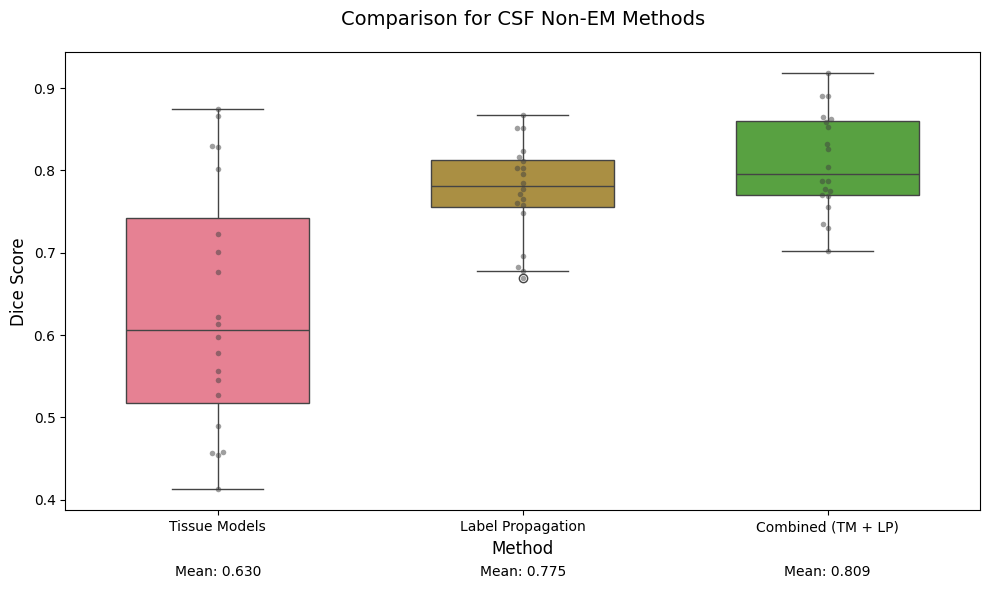

In [68]:
csf_values_tissue_models = [
    0.4565065026088311, 0.6761751857521562, 0.874349101738372, 0.556033531877344,
    0.4574051776038531, 0.4890643985419198, 0.6135198966177978, 0.8285704813685187,
    0.5274434986791899, 0.4123579318072675, 0.7222172190201729, 0.6222608432824542,
    0.4546041842667594, 0.5449044212501466, 0.5976545374835598, 0.5781866911295183,
    0.8290048593245947, 0.8019020729623301, 0.8661854440349295, 0.7012080626132039
]
csf_values_tissue_models_and_label_propagation = [
    0.7347140039447732, 0.8586945313305606, 0.889726820687433, 0.7875865942707359,
    0.7686421907510571, 0.7696726706959488, 0.8320885414651136, 0.8642086569300501,
    0.7553514242373167, 0.7302319780493889, 0.8521518053021139, 0.77671004337671,
    0.7022953066118534, 0.7868182189876523, 0.7744852380433599, 0.8627666790380998,
    0.8902835056681211, 0.804330525399042, 0.9179624266726071, 0.8254173290937997
]

csf_values_label_propagation = [
    0.6687690742624619, 0.8230077120822622, 0.7712003845371689, 0.8108197126271152,
    0.7480163228292904, 0.6954262463846267, 0.8163014958939585, 0.7581343163968585,
    0.8033154632903692, 0.6819659405171995, 0.851865377592404, 0.8026124818577649,
    0.7772101288316304, 0.7601159230096238, 0.7650849443468073, 0.7840513923176979,
    0.8509427179036511, 0.6780209817381169, 0.8672700409096646, 0.7950561355130983
]

data = {
    'Tissue Models': csf_values_tissue_models,
    'Label Propagation': csf_values_label_propagation,
    'Combined (TM + LP)': csf_values_tissue_models_and_label_propagation
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison for CSF Non-EM Methods', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    plt.text(i, plt.ylim()[0] - 0.08, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

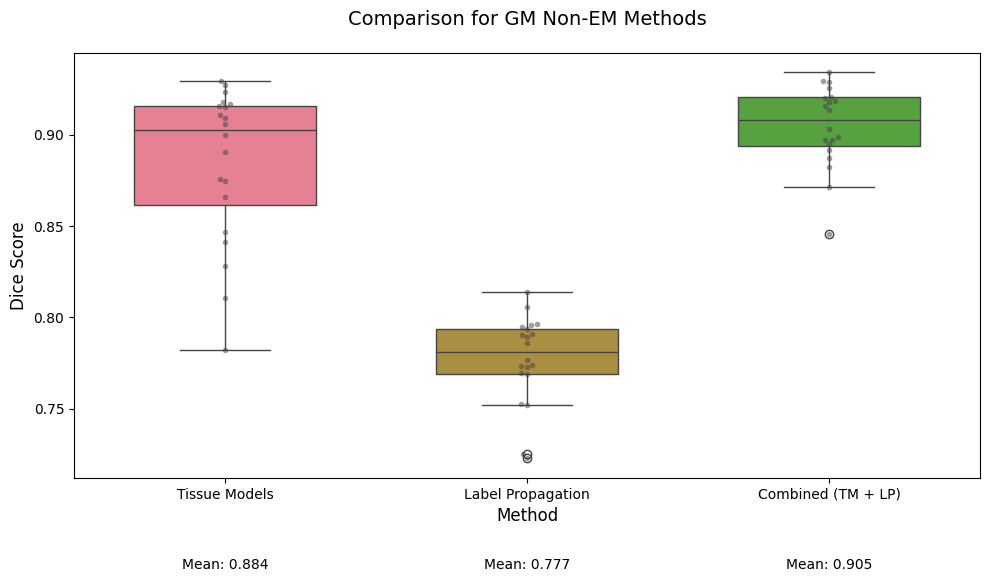

In [45]:
gm_values_label_propagation = [
    0.7956623503776792, 0.7936557014959185, 0.7227632035092657, 0.789181632368979,
    0.7727176860039675, 0.7947243228560488, 0.786055093061969, 0.7251844081109199,
    0.7908573268881707, 0.7518109592827059, 0.7961228856911974, 0.7765665117563153,
    0.8137994691975303, 0.774045285833387, 0.8059306118777456, 0.7524894695634298,
    0.7732693445666754, 0.7689550281675253, 0.7905311072768749, 0.769366529611918
]
gm_values_tissue_models = [
    0.9271022236475268, 0.874478924545988, 0.9158115093948858, 0.9167207502920516,
    0.9091626615202856, 0.918105489601143, 0.9058026696922032, 0.8998707346012179,
    0.915222570364775, 0.9232311619654561, 0.9108587299946518, 0.8281585380268227,
    0.8468878463738595, 0.8414486821020639, 0.9295240081756936, 0.8904706319585848,
    0.8757445793379558, 0.7819060852927909, 0.8662249265715689, 0.8105141178052995
]
gm_values_tissue_models_and_label_propagation = [
    0.9290504994698592, 0.9208494191505633, 0.8915907529270015, 0.918356375718178,
    0.920388864586145, 0.9297278509610372, 0.9155653252778078, 0.8873188788570778,
    0.9180536790773347, 0.9134709130483583, 0.9254787842072429, 0.8714201963813897,
    0.8949625093824424, 0.903161789083633, 0.9344119412749035, 0.8974288269195164,
    0.8970298194283122, 0.8458456913191377, 0.8988608134471706, 0.8822080692525661
]

data = {
    'Tissue Models': gm_values_tissue_models,
    'Label Propagation': gm_values_label_propagation,
    'Combined (TM + LP)': gm_values_tissue_models_and_label_propagation
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison for GM Non-EM Methods', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    plt.text(i, plt.ylim()[0] - 0.05, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

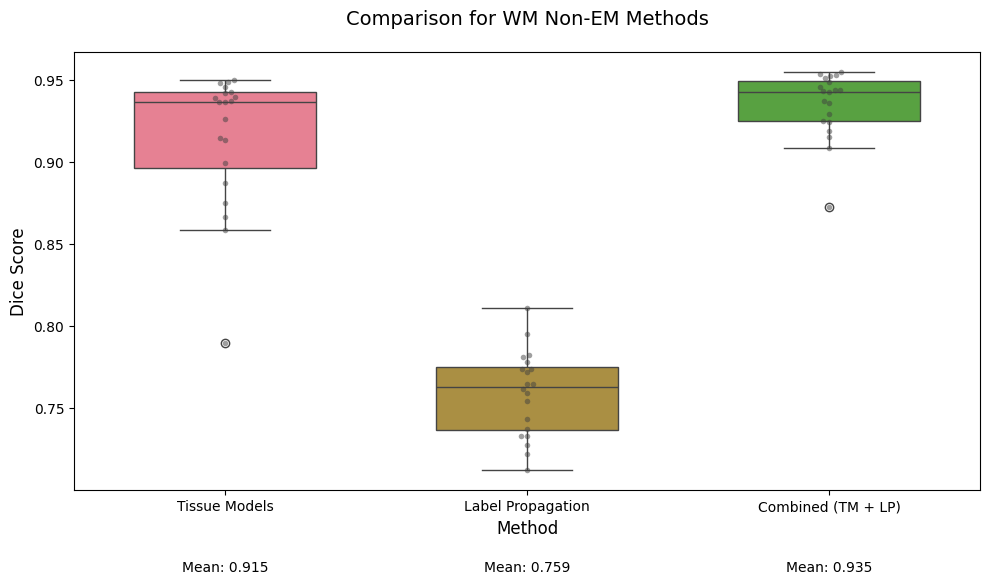

In [44]:

wm_values_label_propagation = [
    0.7783452354429312, 0.7618441054703271, 0.7122486195315726, 0.7736934485318994,
    0.7541002585837618, 0.7821471391352108, 0.7809327618575794, 0.7329543733529881,
    0.7717120962467391, 0.722212126468588, 0.7948815805515939, 0.7739718239559931,
    0.8109919950866236, 0.7594744734857305, 0.7644565184941935, 0.7375154927053623,
    0.7332399664768083, 0.727388206158057, 0.7644542267443393, 0.7431535321197682
]


wm_values_tissue_models_and_label_propagation = [
    0.953387453017135, 0.9487898123303445, 0.9290579622590069, 0.9430420147912444,
    0.9529246342677331, 0.9525520005025641, 0.94395695437005, 0.9357495615063167,
    0.9426248023492206, 0.9436614038128862, 0.9510605358732696, 0.9084210708595969,
    0.924864322738478, 0.9456715952599771, 0.9546608214893285, 0.9369580908837785,
    0.9244949606272149, 0.8724312232848088, 0.9191126791260285, 0.9152160355181843
]
wm_values_tissue_models = [
    0.9499159777624182, 0.9262002644305785, 0.9422995970714175, 0.9390439379465149,
    0.9478340701736195, 0.942573025096133, 0.9365945176724169, 0.9393961712880383,
    0.937233689500477, 0.9486315795307798, 0.9367609395989316, 0.8663993294489609,
    0.8747018082316356, 0.9148022304394005, 0.9459044010235459, 0.9134140745258633,
    0.8993050672710824, 0.789494491933264, 0.8874374336024784, 0.8584925214055092
]

data = {
    'Tissue Models': wm_values_tissue_models,
    'Label Propagation': wm_values_label_propagation,
    'Combined (TM + LP)': wm_values_tissue_models_and_label_propagation
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison for WM Non-EM Methods', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    plt.text(i, plt.ylim()[0] - 0.05, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## With EM

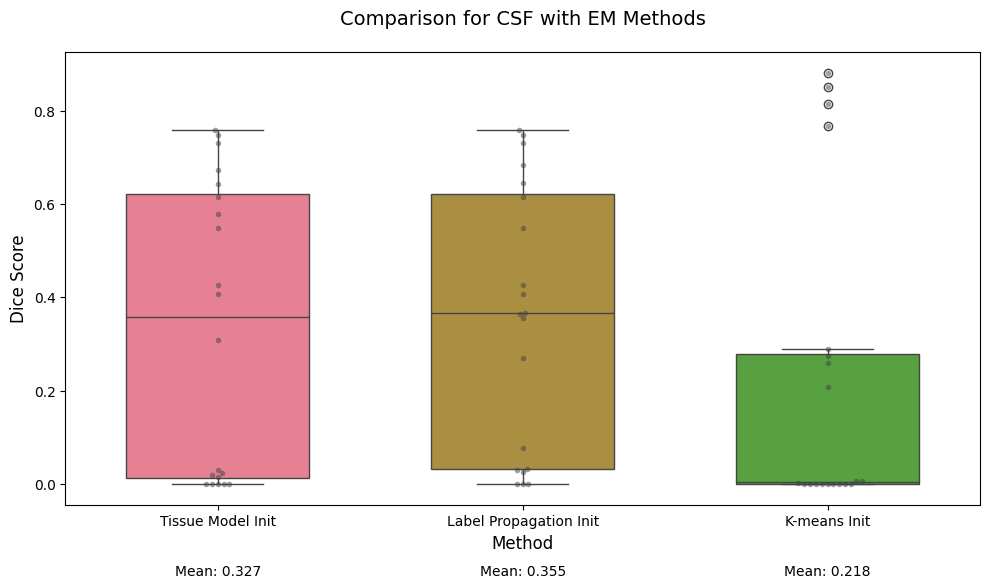

In [51]:
csf_values_EM_with_kmeans = [
    0.00014391232860941114, 1.4951426552985986e-05, 0.880780291329243, 5.1973431181979775e-05,
    0.0012575571673803026, 0.000406269851822305, 3.654623464144489e-05, 0.8512667556834932,
    0.0005291031212185049, 0.002222831308789822, 0.7662504666694321, 0.00011124486982363716,
    0.00749372380429044, 0.007699106489345541, 0.001385069273479126, 0.28966647054073075,
    0.2586545123062899, 0.2743331295178576, 0.8145237625043412, 0.20834135244880123
]


csf_values_EM_with_label_propagation = [
    3.620581193796134e-05, 0.4064165794848802, 0.7487176440298655, 0.0786046157361566,
    0.0334639618871984, 0.025894025025296773, 0.367291924070538, 0.7315214782817374,
    0.2699055330634278, 0.03061050960829885, 0.549031904052677, 0.4267800771659067,
    0.0, 0.36535678503840585, 0.0, 0.6147124017286195,
    0.6840811090125085, 0.6441084302275801, 0.7586695097421376, 0.3553210094722102
]

csf_values_EM_with_tissue_models = [
    0.03173205339802994, 0.4064165794848802, 0.7487176440298655, 0.021040979512493643,
    0.0, 0.0008816074642765309, 0.01668101539211832, 0.7315214782817374,
    0.023597509868114708, 0.0, 0.549031904052677, 0.4267800771659067,
    0.0, 0.0, 0.3089128454296994, 0.6147124017286195,
    0.6725014387109151, 0.6422005762107285, 0.7586695097421376, 0.579634571120119
]

data = {
    'Tissue Model Init': csf_values_EM_with_tissue_models,
    'Label Propagation Init': csf_values_EM_with_label_propagation,
    'K-means Init': csf_values_EM_with_kmeans
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison for CSF with EM Methods', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.15, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

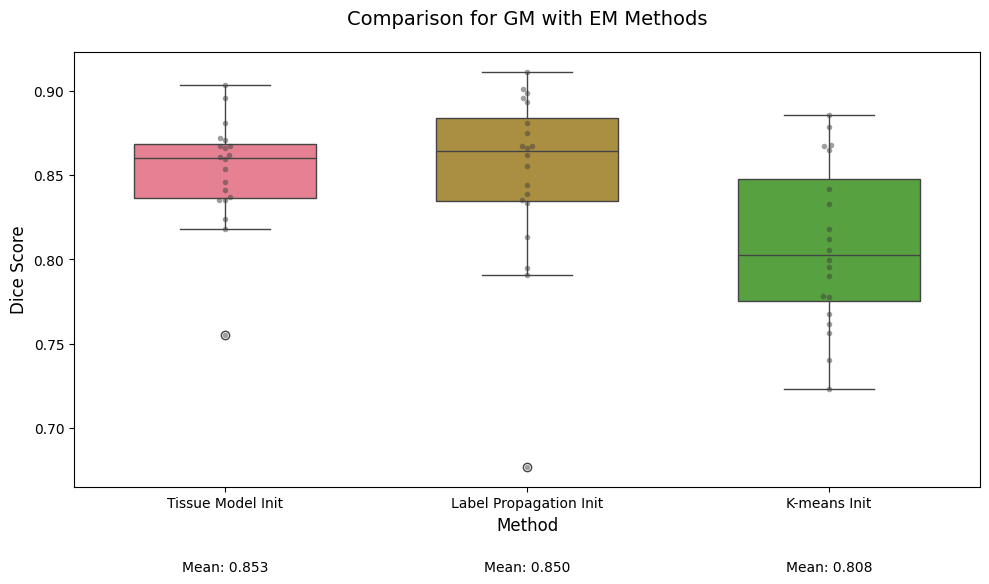

In [53]:

gm_values_EM_with_tissue_models = [
    0.8236772741183743, 0.8958235574515216, 0.8674991018943736, 0.8458593066968338,
    0.8710231831812963, 0.8180271584988188, 0.836733204431191, 0.8620257122961692,
    0.8534290553874064, 0.8609414467310949, 0.8671266911534935, 0.8808224558760992,
    0.8596417899105153, 0.8410352149247649, 0.835445887626733, 0.8659285236165766,
    0.9035091118657429, 0.8722479458582497, 0.8352841238501286, 0.7552759186191343
]

gm_values_EM_with_label_propagation = [
    0.7904249391368084, 0.8958235574515216, 0.8674991018943736, 0.8933464933362197,
    0.8553571904393935, 0.8438700639416342, 0.9010784869239165, 0.8620257122961692,
    0.8988724169242706, 0.8332193182868689, 0.8671266911534935, 0.8808224558760992,
    0.8384611858763787, 0.9112250800699984, 0.7948686142199409, 0.8659285236165766,
    0.8129794141316384, 0.874934645231675, 0.8352841238501286, 0.6768053025101504
]

gm_values_EM_with_kmeans = [
    0.7616943126296404, 0.7404823496722805, 0.8853325743075757, 0.789834511824184,
    0.8179459232169434, 0.7993270813600091, 0.7563099741994133, 0.8680268747120691,
    0.8118604691926322, 0.7775566254878632, 0.8787864399862205, 0.7952684956193324,
    0.8055251790301516, 0.8325430648806644, 0.7232647289745722, 0.8649595561844771,
    0.7782583454672559, 0.8669581702119988, 0.8416422421688954, 0.7676972681146742
]
data = {
    'Tissue Model Init': gm_values_EM_with_tissue_models,
    'Label Propagation Init': gm_values_EM_with_label_propagation,
    'K-means Init': gm_values_EM_with_kmeans
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison for GM with EM Methods', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.05, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


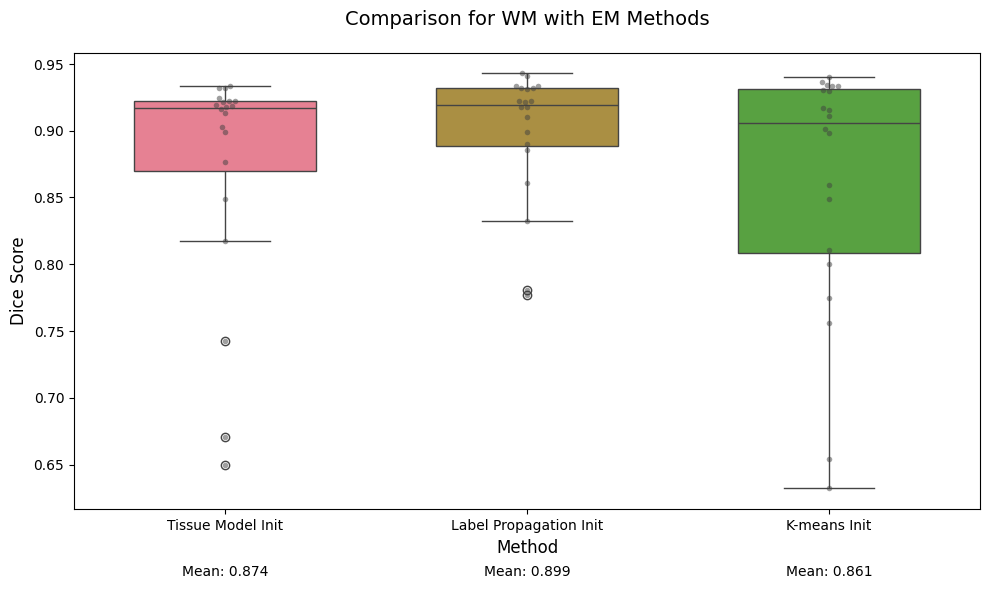

In [54]:
wm_values_EM_with_label_propagation = [
    0.9315874723510978, 0.9335135675303367, 0.9212980826060678, 0.9320933084087594,
    0.8607292826574008, 0.7766335940601408, 0.9413560882602178, 0.9222214797212592,
    0.9337742097102276, 0.8325728585558039, 0.9223729287858488, 0.9323168990094498,
    0.9103348519626651, 0.9430045643474174, 0.8854880820730513, 0.9178475541549429,
    0.8899626602707617, 0.9174095468849262, 0.8991396843619562, 0.7810747295038012
]
wm_values_EM_with_tissue_models = [
    0.6498907809625387, 0.9335135675303367, 0.9212980826060678, 0.7428456759155636,
    0.9319634868657356, 0.8491257978248198, 0.6706801569783181, 0.9222214797212592,
    0.8171386671830905, 0.9242840703642565, 0.9223729287858488, 0.9323168990094498,
    0.9181803735153696, 0.9133287898437836, 0.902883278951146, 0.9178475541549429,
    0.9189753851343033, 0.9163151352873612, 0.8991396843619562, 0.8767138167782179
]
wm_values_EM_with_kmeans = [
    0.9108680030283169, 0.9402203933381286, 0.934540482613355, 0.9336961273254609,
    0.800248283353377, 0.8983738365144327, 0.9331577764495435, 0.9297454723207705,
    0.9172187688991756, 0.8490639126023439, 0.9304932241991125, 0.9158577035520469,
    0.7746867358467547, 0.8590944470373355, 0.9366234948296258, 0.8109469668636398,
    0.6320500518546519, 0.7556361441645811, 0.9013695934202527, 0.653803282612924
]

data = {
    'Tissue Model Init': wm_values_EM_with_tissue_models,
    'Label Propagation Init': wm_values_EM_with_label_propagation,
    'K-means Init': wm_values_EM_with_kmeans
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison for WM with EM Methods', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.05, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## MNI vs Our Atlas LP Only

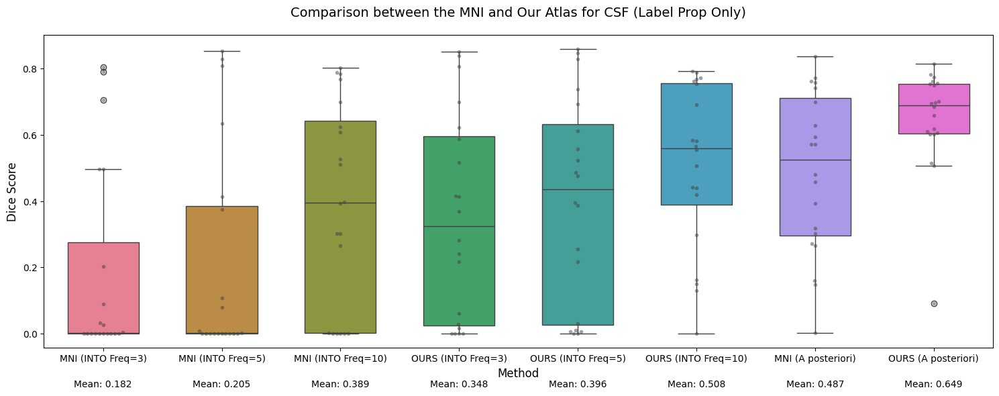

In [61]:
csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10 = [
    0.0, 0.5117153468751433, 0.7889336999109101, 0.26423877327491785,
    0.0, 0.0010900370612600828, 0.3961278257521588, 0.7844259236223411,
    0.30272753373528566, 0.30272753373528566, 0.6985820516373378, 0.5276033596999103, 0.0,
    0.39398682342663705, 0.0, 0.6237110952720362, 0.6089439587395433,
    0.7674907292954265, 0.8036742049880821, 0.0
]

csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3 = [
    0.0, 0.03240424607362344, 0.804912380142648, 0.0,
    0.0, 0.0, 0.0, 0.7061055853098699,
    0.0027372887155272703, 0.49708348028975285, 0.49708348028975285, 0.20141200201714574, 0.0,
    0.00018259837487446363, 0.0, 0.0, 0.025054583199112353,
    0.08909838046893885, 0.7910136894263878, 0.00011496895838123707
]

csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5 = [
    0.0, 0.4126779425623729, 0.8538719688221709, 0.007129842351263567,
    0.0, 0.0, 0.0795265642662411, 0.8284263401041285,
    0.10612139251973599, 0.6350803497289113, 0.3754080522306855, 0.0,
    0.0020977745348412986, 0.0, 0.0, 0.0,
    0.0, 0.0, 0.808517324071777, 0.0
]

csf_values_intoEM_our_atlas_with_label_propagation_only_freq_5 = [
    0.030611175175594925, 0.5580127500549571, 0.8469581489993732, 0.3865992414664981,
    0.0, 0.21601634718303006, 0.4771752055006979, 0.8284263401041285,
    0.3952231708635037, 0.006229191279132209, 0.6940952734356881, 0.5223874482815124,
    0.0, 0.4870360262008734, 0.2546825303333726, 0.004516753468221413,
    0.7375058224741823, 0.6121138767563017, 0.858757858311608, 0.009782328880752839
]

csf_values_intoEM_our_atlas_with_label_propagation_only_freq_3 = [
    0.00021292451825827744, 0.4126779425623729, 0.8387244486775588, 0.21550628442310407,
    0.0, 0.027155172413793102, 0.28065799631807115, 0.8063814222205549,
    0.24094657583363213, 0.0, 0.6232831109905556, 0.4161773146717294,
    0.0, 0.3679940729764771, 0.060189842963999825, 0.016083579627465806,
    0.700069197659008, 0.5169386606640405, 0.8521974285578733, 0.5877683272579992
]

csf_values_intoEM_our_atlas_with_label_propagation_only_freq_10 = [
    0.14914786720520146, 0.581446311176041, 0.7933160285528877, 0.4412336085478388,
    0.12891871081289188, 0.2982213620864436, 0.5075963376597243, 0.7693470843672456,
    0.4402449876982673, 0.16152112123885132, 0.6915457589285714, 0.5843512195121952,
    0.0, 0.5545445714470745, 0.4191612538830839, 0.7540771748444283,
    0.7720457097562586, 0.7621503238533107, 0.7893005845985617, 0.5655135513345544
]

csf_values_a_posteriori_our_atlas_with_label_propagation_only = [
    0.09149272612270715, 0.6056887408511198, 0.7742290642534986, 0.6016935082184958,
    0.7619585687382298, 0.6948556821812759, 0.6111111111111112, 0.7566886200629287,
    0.5060732877411452, 0.7014647137150466, 0.6595119582372223, 0.6025685795212044,
    0.7510015782445065, 0.5141908826119352, 0.6184939428988859, 0.697059923692676,
    0.7536447418824219, 0.6854972467325682, 0.8149932977524856, 0.7819093262821573
]

csf_values_a_posteriori_MNI_atlas_with_label_propagation_only = [
    0.0018996289097013607, 0.14844505088407528, 0.7577432105563312, 0.3178920795203534,
    0.458703685209228, 0.2643681252185138, 0.15954939790236955, 0.7419249268607131,
    0.3027052103569254, 0.5711037618850765, 0.5711037618850765, 0.4805503652114829, 0.6280058501411516,
    0.27181654535493466, 0.3928174617397226, 0.7722850678733032, 0.7001940149332706,
    0.8383885293007866, 0.7614689177892116, 0.5946297098310958
]


data = {
    'MNI (INTO Freq=3)': csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3,
    'MNI (INTO Freq=5)': csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5,
    'MNI (INTO Freq=10)': csf_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10,
    'OURS (INTO Freq=3)': csf_values_intoEM_our_atlas_with_label_propagation_only_freq_3,
    'OURS (INTO Freq=5)': csf_values_intoEM_our_atlas_with_label_propagation_only_freq_5,
    'OURS (INTO Freq=10)': csf_values_intoEM_our_atlas_with_label_propagation_only_freq_10,
    'MNI (A posteriori)': csf_values_a_posteriori_MNI_atlas_with_label_propagation_only,
    'OURS (A posteriori)': csf_values_a_posteriori_our_atlas_with_label_propagation_only
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(15, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison between the MNI and Our Atlas for CSF (Label Prop Only)', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.12, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


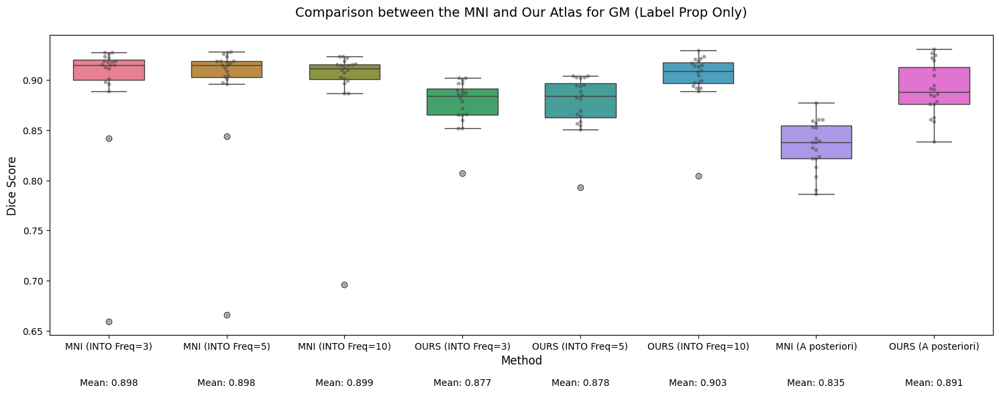

In [63]:
gm_values_intoEM_our_atlas_with_label_propagation_only_freq_10 = [
    0.9217438221208943, 0.9239688169221524, 0.8977816628232621, 0.9213279199649032,
    0.8978676720369329, 0.9188346817822134, 0.9085241461480114, 0.8940897014300327,
    0.9169684609057207, 0.9136149873217203, 0.9151401751890008, 0.8922985839506795,
    0.9097758773223238, 0.8888967064080916, 0.92962775528565, 0.9142750864168264,
    0.8924432300009423, 0.8998651570061467, 0.9048671303582058, 0.8043661623690521
]

gm_values_intoEM_our_atlas_with_label_propagation_only_freq_3 = [
    0.8878164738228892, 0.902210232351571, 0.8664096915278837, 0.8898792562763836,
    0.8653788526150715, 0.8972162151124635, 0.8824338302802073, 0.8600392930231174,
    0.8896307410362275, 0.8864061231297955, 0.9024484709242431, 0.8654724353843981,
    0.9004825104428219, 0.8522549568996037, 0.8966984642193395, 0.8791186298895173,
    0.8721183428048267, 0.851751883386083, 0.8858925579808875, 0.807046932519272
]

gm_values_intoEM_our_atlas_with_label_propagation_only_freq_5 = [
    0.8939323573563447, 0.9039481009900511, 0.8565268099357264, 0.8955052232089632,
    0.8637638594693389, 0.9027878955405381, 0.8851229156827543, 0.8505375692949667,
    0.8951915672186198, 0.882758908540721, 0.90200854022213, 0.8662135753365554,
    0.9026472174683966, 0.8545393107241324, 0.9045218334063369, 0.8817284433805047,
    0.8697683828702121, 0.8590677824795743, 0.8889133276892345, 0.7931646417890074
]

gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5 = [
    0.9277499771406722, 0.9262820209432824, 0.90894802579288, 0.9237491052377609,
    0.9169502951765207, 0.9192205755715296, 0.9120941895531464, 0.9039258110045143,
    0.918460300632966, 0.9147346544206532, 0.896122483134331, 0.9006753291815174,
    0.9186878599588473, 0.9283740626959958, 0.9152180936995153, 0.9049529134482573,
    0.8974056816690881, 0.8441099425678416, 0.6659426861383314, 0.9192205755715296
]

gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3 = [
    0.9278806403537692, 0.926538274303571, 0.9192101322685301, 0.9236991732207767,
    0.918032590591619, 0.9193125883327647, 0.9130028326867959, 0.9154414814145968,
    0.9184615455449556, 0.9149993263427847, 0.8982294800005424, 0.8961775248874492,
    0.9226200724992022, 0.9275632448740269, 0.9115829724860415, 0.8888377796394256,
    0.9013700161349896, 0.8418206304263605, 0.6591858301147469, 0.9149993263427847
]

gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10 = [
    0.9239785522788204, 0.9222535901043893, 0.9191264146601678, 0.9153108002465713,
    0.9165864027969289, 0.9152088400949435, 0.9155523404702788, 0.9153464672550793,
    0.9137653113631754, 0.9101536310448172, 0.9028907789690009, 0.8871093586360018,
    0.9239752047726503, 0.9018544389340195, 0.8970358200234947, 0.8871292383010461,
    0.9078595693580185, 0.8994140206747523, 0.6957624457523812, 0.9101536310448172
]

gm_values_a_posteriori_MNI_atlas_with_label_propagation_only = [
    0.8217552222609774, 0.8133450804800239, 0.8576932326878592, 0.8377396195306223,
    0.8380926716805078, 0.8325251038608995, 0.8309369534455412, 0.853491911790733,
    0.8421066462740028, 0.8606499259300784, 0.8774311212114879, 0.8041436910227718,
    0.8240378651169085, 0.7861197801288262, 0.8396036064218441, 0.7904463171203412,
    0.8593326597647019, 0.8530020515883063, 0.822163120049747, 0.8606499259300784
]

gm_values_a_posteriori_our_atlas_with_label_propagation_only = [
    0.891730517731713, 0.9273220569731587, 0.878899443774293, 0.9193636785880167,
    0.8905532526284111, 0.8854790870918513, 0.9313317377012406, 0.8763082646677287,
    0.9226796806719731, 0.8588565200770266, 0.9050987157749372, 0.9112610371844297,
    0.8759452490958487, 0.9253087994924033, 0.8606655091952625, 0.885993805011194,
    0.8629560870251053, 0.8952189944951062, 0.8841367034609423, 0.8383315344363532
]


data = {
    'MNI (INTO Freq=3)': gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3,
    'MNI (INTO Freq=5)': gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5,
    'MNI (INTO Freq=10)': gm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10,
    'OURS (INTO Freq=3)': gm_values_intoEM_our_atlas_with_label_propagation_only_freq_3,
    'OURS (INTO Freq=5)': gm_values_intoEM_our_atlas_with_label_propagation_only_freq_5,
    'OURS (INTO Freq=10)': gm_values_intoEM_our_atlas_with_label_propagation_only_freq_10,
    'MNI (A posteriori)': gm_values_a_posteriori_MNI_atlas_with_label_propagation_only,
    'OURS (A posteriori)': gm_values_a_posteriori_our_atlas_with_label_propagation_only
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(15, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison between the MNI and Our Atlas for GM (Label Prop Only)', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.05, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

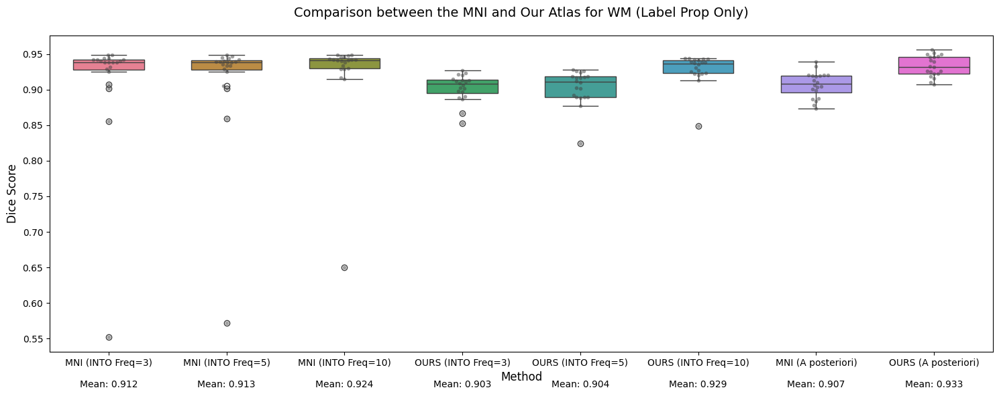

In [64]:
wm_values_intoEM_our_atlas_with_label_propagation_only_freq_10 = [
    0.9435494218084319, 0.9437763673964201, 0.9226629838643148, 0.942545227924099,
    0.930790748371956, 0.9427122869409348, 0.9381889831566351, 0.923004322652679,
    0.9383567441056005, 0.938892549788231, 0.9412395956389608, 0.9270085447804083,
    0.9355052919782599, 0.9204523759179006, 0.943145182128617, 0.9373313036165646,
    0.9124339286158402, 0.9220162757683003, 0.9250283332561713, 0.8487456104822854
]

wm_values_intoEM_our_atlas_with_label_propagation_only_freq_3 = [
    0.9130524473295909, 0.9214645534719468, 0.8979004270521631, 0.9120370055131496,
    0.902654117396996, 0.9204997873346417, 0.9133519357048572, 0.8967205149932399,
    0.9105474497914017, 0.9147853440551174, 0.9270485615062081, 0.9013041456889637,
    0.9236794935703864, 0.8860725492178095, 0.9089767211078379, 0.8902018521626665,
    0.8887899696933197, 0.8666416853326522, 0.9065897829552949, 0.8526749767596167
]

wm_values_intoEM_our_atlas_with_label_propagation_only_freq_5 = [
    0.918766244333847, 0.924385558569446, 0.8892059492281562, 0.9184111393357794,
    0.9011951004979046, 0.9263643297407578, 0.9169923422454185, 0.8895299098158321,
    0.9170627559573635, 0.9115410938685548, 0.9279097392011854, 0.9029565672262925,
    0.9258260593448847, 0.889657983620119, 0.9179273577311972, 0.8924899673257501,
    0.8882371515351999, 0.8770170509404893, 0.9100576478036414, 0.8245057418694308
]

wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5 = [
    0.9488891608756159, 0.945243242573393, 0.935255835779396, 0.9436251536392667,
    0.9464149609666406, 0.9424037911297218, 0.9391715386160485, 0.9337830531585791,
    0.9387722592188447, 0.9394608167190436, 0.9285729391363194, 0.9336985878760439,
    0.9386919684148268, 0.9405801307082616, 0.924729211082471, 0.9054215230956514,
    0.9018077239112572, 0.8595561747157492, 0.5713718372487621, 0.9394608167190436
]

wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3 = [
    0.9490398823096156, 0.9436709988335755, 0.9422776984448459, 0.9436408537660963,
    0.9487672730589886, 0.9425525844853074, 0.9397611617960905, 0.9385982650193113,
    0.938201617052501, 0.938673905845928, 0.9293690809345477, 0.9321394026938007,
    0.9421224165858926, 0.9403264626518045, 0.9247968352137416, 0.9013288830127316,
    0.9068806182262035, 0.8558539707634352, 0.5514429222916308, 0.938673905845928
]

wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10 = [
    0.9489968223071245, 0.9460291061210656, 0.94188838312135, 0.9424955899167745,
    0.9486513110606604, 0.9430105275181329, 0.9456512188386513, 0.9423492730271775,
    0.9398724355415082, 0.941402699189183, 0.938087074661324, 0.928738390136474,
    0.9473205070595442, 0.9289114096944886, 0.9301709649936941, 0.9151370629304287,
    0.9335528278024272, 0.9171187539199971, 0.65016449291094, 0.941402699189183
]

wm_values_a_posteriori_MNI_atlas_with_label_propagation_only = [
    0.9396082147630198, 0.8735116893600251, 0.9185913822572367, 0.9040800261327308,
    0.9194105665501546, 0.8983163607218133, 0.887470697985935, 0.9203451534708982,
    0.9031992929318359, 0.9207519828722385, 0.932555710325419, 0.9010505182145593,
    0.910076252559089, 0.8862361994136848, 0.9125902640501297, 0.8836505741998794,
    0.9193000331059471, 0.906566489320541, 0.8777394184580652, 0.9207519828722385
]


wm_values_a_posteriori_our_atlas_with_label_propagation_only = [
    0.9516017517055584, 0.9494876232070144, 0.9220636817072551, 0.9460050319717757,
    0.939141929098554, 0.9322157361044713, 0.9561573347653529, 0.9248536816759535,
    0.9462049324286983, 0.9186140961589316, 0.9408503262477319, 0.9463539243632796,
    0.9317318231640482, 0.9495907341960687, 0.9155776716239901, 0.9262085754825724,
    0.910466188677, 0.9264803422236015, 0.9226021849792753, 0.9074413865029013
]


data = {
    'MNI (INTO Freq=3)': wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_3,
    'MNI (INTO Freq=5)': wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_5,
    'MNI (INTO Freq=10)': wm_values_intoEM_MNI_atlas_with_label_propagation_only_freq_10,
    'OURS (INTO Freq=3)': wm_values_intoEM_our_atlas_with_label_propagation_only_freq_3,
    'OURS (INTO Freq=5)': wm_values_intoEM_our_atlas_with_label_propagation_only_freq_5,
    'OURS (INTO Freq=10)': wm_values_intoEM_our_atlas_with_label_propagation_only_freq_10,
    'MNI (A posteriori)': wm_values_a_posteriori_MNI_atlas_with_label_propagation_only,
    'OURS (A posteriori)': wm_values_a_posteriori_our_atlas_with_label_propagation_only
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(15, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison between the MNI and Our Atlas for WM (Label Prop Only)', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.05, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## MNI vs Our Atlas LP & TM

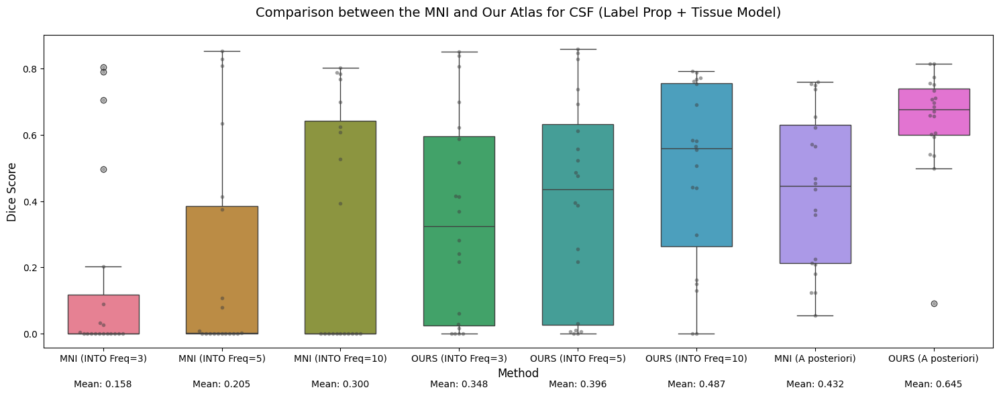

In [65]:
csf_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model = [
    0.2074734486555607, 0.4363260890943062, 0.7541908255433282, 0.2132753562447611,
    0.45484894007678184, 0.05449251114078412, 0.12331313131313132, 0.7370475090597746,
    0.22506479954219544, 0.565165507938155, 0.4677239605657951, 0.3736881964730066,
    0.17981666393845147, 0.3589516099219992, 0.6222306983249102, 0.7511675194958998,
    0.6546481172829007, 0.7593636434262432, 0.5722723543888433,  0.12331313131313132
]



csf_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model = [
    0.5419940769990128, 0.6056887408511198, 0.7742290642534986, 0.7525940195262905,
    0.73475196530225, 0.09108039876714663, 0.7124124942255072, 0.7566886200629287,
    0.6712665487946872, 0.7071268814604365, 0.6595119582372223, 0.6025685795212044,
    0.5937658739321173, 0.5370857443450815, 0.4994592402325267, 0.697059923692676,
    0.8151537995986452, 0.6845590798187522, 0.8149932977524856, 0.657228161417702
]

csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.14914786720520146, 0.581446311176041, 0.7933160285528877, 0.4412336085478388,
    0.12891871081289188, 0.2982213620864436, 0.5075963376597243, 0.7693470843672456,
    0.4402449876982673, 0.16152112123885132, 0.6915457589285714, 0.5843512195121952,
    0.0, 0.5545445714470745, 0.0, 0.7540771748444283,
    0.7720457097562586, 0.7621503238533107, 0.7893005845985617, 0.5655135513345544
]

csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.00021292451825827744, 0.4126779425623729, 0.8387244486775588, 0.21550628442310407,
    0.0, 0.027155172413793102, 0.28065799631807115, 0.8063814222205549,
    0.24094657583363213, 0.0, 0.6232831109905556, 0.4161773146717294,
    0.0, 0.3679940729764771, 0.060189842963999825, 0.016083579627465806,
    0.700069197659008, 0.5169386606640405, 0.8521974285578733, 0.5877683272579992
]



csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.030611175175594925, 0.5580127500549571, 0.8469581489993732, 0.3865992414664981,
    0.0, 0.21601634718303006, 0.4771752055006979, 0.8284263401041285,
    0.3952231708635037, 0.006229191279132209, 0.6940952734356881, 0.5223874482815124,
    0.0, 0.4870360262008734, 0.2546825303333726, 0.004516753468221413,
    0.7375058224741823, 0.6121138767563017, 0.858757858311608, 0.009782328880752839
]



csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.0, 0.0, 0.7889336999109101, 0.0,
    0.0, 0.0, 0.0, 0.7844259236223411,
    0.0, 0.6985820516373378, 0.5276033596999103, 0.0,
    0.39398682342663705, 0.0, 0.6237110952720362, 0.6089439587395433,
    0.7674907292954265, 0.8036742049880821, 0.0, 0.0
]

csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.0, 0.03240424607362344, 0.804912380142648, 0.0,
    0.0, 0.0, 0.0, 0.7061055853098699,
    0.0027372887155272703, 0.49708348028975285, 0.20141200201714574, 0.0,
    0.00018259837487446363, 0.0, 0.0, 0.025054583199112353,
    0.08909838046893885, 0.7910136894263878, 0.00011496895838123707, 0.0
]



csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.0, 0.4126779425623729, 0.8538719688221709, 0.007129842351263567,
    0.0, 0.0, 0.0795265642662411, 0.8284263401041285,
    0.10612139251973599, 0.6350803497289113, 0.3754080522306855, 0.0,
    0.0020977745348412986, 0.0, 0.0, 0.0,
    0.0, 0.0, 0.808517324071777, 0.0
]

data = {
    'MNI (INTO Freq=3)': csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3,
    'MNI (INTO Freq=5)': csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5,
    'MNI (INTO Freq=10)': csf_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10,
    'OURS (INTO Freq=3)': csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3,
    'OURS (INTO Freq=5)': csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5,
    'OURS (INTO Freq=10)': csf_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10,
    'MNI (A posteriori)': csf_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model,
    'OURS (A posteriori)': csf_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(15, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison between the MNI and Our Atlas for CSF (Label Prop + Tissue Model)', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.12, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


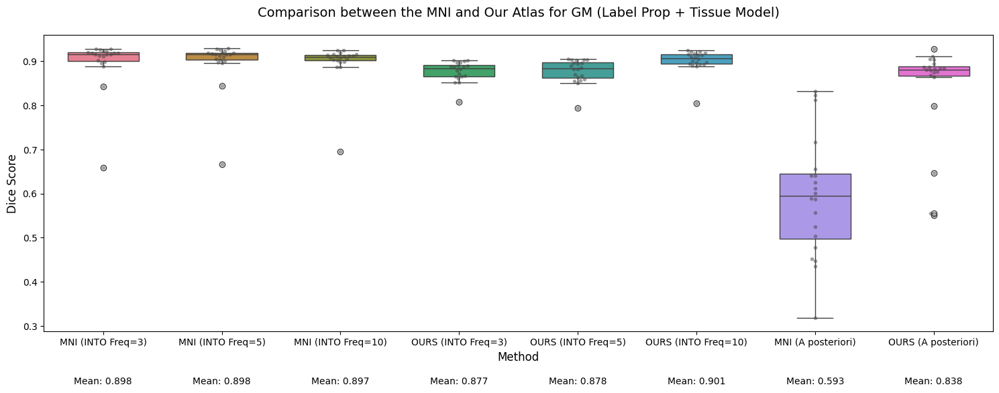

In [66]:
gm_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model = [
    0.8124682534922688, 0.7171256428147348, 0.6557792932011253, 0.44803802510295737,
    0.5255578917973274, 0.5892665254367382, 0.47709362733209204, 0.6247230478249122,
    0.4522802059290625, 0.640674260516305, 0.6122819327327478, 0.8313607764231125,
    0.4345596803117548, 0.8224839024229197, 0.6016529596089686, 0.5869700118164808,
    0.5566364554085139, 0.5043944064206682, 0.31835837910664316, 0.640674260516305
]
gm_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model = [
    0.64629865791202, 0.9273220569731587, 0.878899443774293, 0.8742661527892598,
    0.9031973774048123, 0.8686270489591988, 0.879909511635986, 0.8763082646677287,
    0.8829552874479918, 0.8825862865673764, 0.9050987157749372, 0.9112610371844297,
    0.5560381904631714, 0.886900225789023, 0.5502010109184731, 0.8860236465972493,
    0.7990531664082101, 0.8937531817771363, 0.8841367034609423, 0.8639761459808835
]

gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.8939323573563447, 0.9039481009900511, 0.8565268099357264, 0.8955052232089632,
    0.8637638594693389, 0.9027878955405381, 0.8851229156827543, 0.8505375692949667,
    0.8951915672186198, 0.882758908540721, 0.90200854022213, 0.8662135753365554,
    0.9026472174683966, 0.8545393107241324, 0.9045218334063369, 0.8817284433805047,
    0.8697683828702121, 0.8590677824795743, 0.8889133276892345, 0.7931646417890074
]

gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.8878164738228892, 0.902210232351571, 0.8664096915278837, 0.8898792562763836,
    0.8653788526150715, 0.8972162151124635, 0.8824338302802073, 0.8600392930231174,
    0.8896307410362275, 0.8864061231297955, 0.9024484709242431, 0.8654724353843981,
    0.9004825104428219, 0.8522549568996037, 0.8966984642193395, 0.8791186298895173,
    0.8721183428048267, 0.851751883386083, 0.8858925579808875, 0.807046932519272
]

gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.9217438221208943, 0.9239688169221524, 0.8977816628232621, 0.9213279199649032,
    0.8978676720369329, 0.9188346817822134, 0.9085241461480114, 0.8940897014300327,
    0.9169684609057207, 0.9136149873217203, 0.9151401751890008, 0.8922985839506795,
    0.9097758773223238, 0.8888967064080916, 0.8876268557132482, 0.9142750864168264,
    0.8924432300009423, 0.8998651570061467, 0.9048671303582058, 0.8043661623690521
]


gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.9277499771406722, 0.9262820209432824, 0.90894802579288, 0.9237491052377609,
    0.9169502951765207, 0.9192205755715296, 0.9120941895531464, 0.9039258110045143,
    0.918460300632966, 0.9147346544206532, 0.896122483134331, 0.9006753291815174,
    0.9186878599588473, 0.9283740626959958, 0.9152180936995153, 0.9049529134482573,
    0.8974056816690881, 0.8441099425678416, 0.6659426861383314, 0.9147346544206532
]

gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.9278806403537692, 0.926538274303571, 0.9192101322685301, 0.9236991732207767,
    0.918032590591619, 0.9193125883327647, 0.9130028326867959, 0.9154414814145968,
    0.9184615455449556, 0.9149993263427847, 0.8982294800005424, 0.8961775248874492,
    0.9226200724992022, 0.9275632448740269, 0.9115829724860415, 0.8888377796394256,
    0.9013700161349896, 0.8418206304263605, 0.6591858301147469, 0.9149993263427847
]

gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.9239785522788204, 0.9048241188498062, 0.9191264146601678, 0.9126239416717133,
    0.9158945143534839, 0.91344409519533, 0.9123650504345507, 0.9153464672550793,
    0.9080406910251009, 0.9101536310448172, 0.9028907789690009, 0.8871093586360018,
    0.9239752047726503, 0.9018544389340195, 0.8970358200234947, 0.8871292383010461,
    0.9078595693580185, 0.8994140206747523, 0.6957624457523812, 0.9101536310448172
]

data = {
    'MNI (INTO Freq=3)': gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3,
    'MNI (INTO Freq=5)': gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5,
    'MNI (INTO Freq=10)': gm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10,
    'OURS (INTO Freq=3)': gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3,
    'OURS (INTO Freq=5)': gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5,
    'OURS (INTO Freq=10)': gm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10,
    'MNI (A posteriori)': gm_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model,
    'OURS (A posteriori)': gm_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(15, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison between the MNI and Our Atlas for GM (Label Prop + Tissue Model)', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.12, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


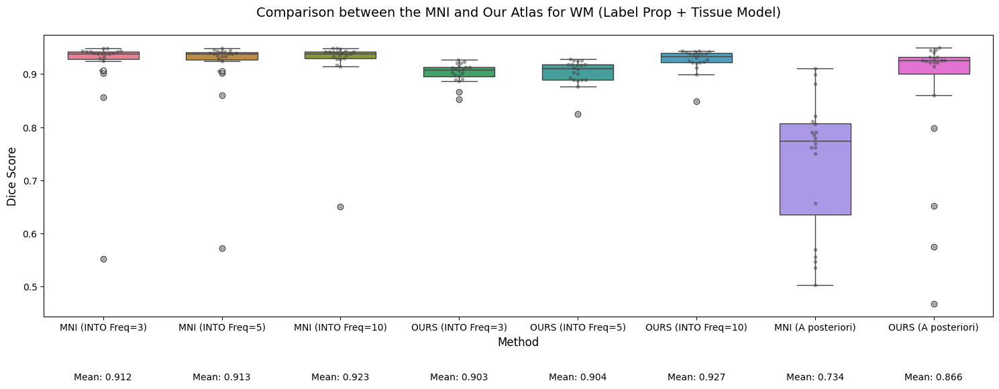

In [67]:

wm_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model = [
    0.6515335459207932, 0.9494876232070144, 0.9220636817072551, 0.9220304233132445,
    0.9455240505521498, 0.7978098235895248, 0.9296746192119061, 0.9248536816759535,
    0.9263083665657773, 0.9320184082302936, 0.9408503262477319, 0.9463539243632796,
    0.5741576438524196, 0.9321293554646731, 0.46650889226990916, 0.9262223079046011,
    0.8596370391009567, 0.9258450146830274, 0.9226021849792753, 0.9145179112457672
]

wm_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model = [
    0.8819183901321569, 0.8212986266067099, 0.8110568078155975, 0.5689504008016032,
    0.6566754887580859, 0.5024562963481767, 0.5557055505095333, 0.8054036447730567,
    0.5350257158234836, 0.7911251187336529, 0.785246688682293, 0.9104282981723938,
    0.5462146520241099, 0.8988283817437394, 0.7620523637768903, 0.7690007090276466,
    0.7494638664404711, 0.7786556012186168, 0.7611216628139972, 0.7911251187336529
]

wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.918766244333847, 0.924385558569446, 0.8892059492281562, 0.9184111393357794,
    0.9011951004979046, 0.9263643297407578, 0.9169923422454185, 0.8895299098158321,
    0.9170627559573635, 0.9115410938685548, 0.9279097392011854, 0.9029565672262925,
    0.9258260593448847, 0.889657983620119, 0.9179273577311972, 0.8924899673257501,
    0.8882371515351999, 0.8770170509404893, 0.9100576478036414, 0.8245057418694308
]

wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.9130524473295909, 0.9214645534719468, 0.8979004270521631, 0.9120370055131496,
    0.902654117396996, 0.9204997873346417, 0.9133519357048572, 0.8967205149932399,
    0.9105474497914017, 0.9147853440551174, 0.9270485615062081, 0.9013041456889637,
    0.9236794935703864, 0.8860725492178095, 0.9089767211078379, 0.8902018521626665,
    0.8887899696933197, 0.8666416853326522, 0.9065897829552949, 0.8526749767596167
]

wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.9435494218084319, 0.9437763673964201, 0.9226629838643148, 0.942545227924099,
    0.930790748371956, 0.9427122869409348, 0.9381889831566351, 0.923004322652679,
    0.9383567441056005, 0.938892549788231, 0.9412395956389608, 0.9270085447804083,
    0.9355052919782599, 0.9204523759179006, 0.8998499054817768, 0.9373313036165646,
    0.9124339286158402, 0.9220162757683003, 0.9250283332561713, 0.8487456104822854
]

wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5 = [
    0.9488891608756159, 0.945243242573393, 0.935255835779396, 0.9436251536392667,
    0.9464149609666406, 0.9424037911297218, 0.9391715386160485, 0.9337830531585791,
    0.9387722592188447, 0.9394608167190436, 0.9285729391363194, 0.9336985878760439,
    0.9386919684148268, 0.9405801307082616, 0.924729211082471, 0.9054215230956514,
    0.9018077239112572, 0.8595561747157492, 0.5713718372487621, 0.9394608167190436
]

wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3 = [
    0.9490398823096156, 0.9436709988335755, 0.9422776984448459, 0.9436408537660963,
    0.9487672730589886, 0.9425525844853074, 0.9397611617960905, 0.9385982650193113,
    0.938201617052501, 0.938673905845928, 0.9293690809345477, 0.9321394026938007,
    0.9421224165858926, 0.9403264626518045, 0.9247968352137416, 0.9013288830127316,
    0.9068806182262035, 0.8558539707634352, 0.5514429222916308, 0.938673905845928
]

wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10 = [
    0.9489968223071245, 0.9354879281763333, 0.94188838312135, 0.9400695913974905,
    0.9485267522691672, 0.9423888020436295, 0.9437156057007616, 0.9423492730271775,
    0.9359360860823853, 0.941402699189183, 0.938087074661324, 0.928738390136474,
    0.9473205070595442, 0.9289114096944886, 0.9301709649936941, 0.9151370629304287,
    0.9335528278024272, 0.9171187539199971, 0.65016449291094, 0.941402699189183
]

data = {
    'MNI (INTO Freq=3)': wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_3,
    'MNI (INTO Freq=5)': wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_5,
    'MNI (INTO Freq=10)': wm_values_intoEM_MNI_atlas_with_label_propagation_and_tissue_model_freq_10,
    'OURS (INTO Freq=3)': wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_3,
    'OURS (INTO Freq=5)': wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_5,
    'OURS (INTO Freq=10)': wm_values_intoEM_our_atlas_with_label_propagation_and_tissue_model_freq_10,
    'MNI (A posteriori)': wm_values_a_posteriori_mni_atlas_with_label_propagation_and_tissue_model,
    'OURS (A posteriori)': wm_values_a_posteriori_our_atlas_with_label_propagation_and_tissue_model
}
df = pd.DataFrame(data)
sns.set_palette("husl")
plt.figure(figsize=(15, 6))
box_plot = sns.boxplot(data=df, width=0.6)
sns.swarmplot(data=df, color=".25", size=4, alpha=0.5)
plt.title('Comparison between the MNI and Our Atlas for WM (Label Prop + Tissue Model)', pad=20, size=14)
plt.ylabel('Dice Score', size=12)
plt.xlabel('Method', size=12)
# Add mean values as text
for i, method in enumerate(df.columns):
    mean_val = df[method].mean()
    # put a small offset to avoid overlapping with the plot
    
    plt.text(i, plt.ylim()[0] - 0.12, f'Mean: {mean_val:.3f}', 
             horizontalalignment='center', size=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()